# Group 14 - Project FP01
## Time series anomaly detection - Isolation Forest Classifier

This project aims at investigating the current state-of-the-arts TAD scenario.

In [1]:
# %pip install --no-binary :all: -r requirements.txt

In [2]:
# %pip install numpy==1.26.4
# %pip install pandas==1.5.3
# %pip install tensorflow
# %pip install tsfel
# %pip install keras_tuner
# %pip install -U kaleido
# %pip install seaborn
# %pip install plotly
# %pip install openpyxl
# %pip install tables
# %pip install ipykernel

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.ensemble import IsolationForest

from dataset import *
from plots import *
from metrics import *
from models_funtions import *

# Set style for matplotlib
plt.style.use("Solarize_Light2")

In [4]:
# Path to the root directory of the dataset
ROOTDIR_DATASET_NORMAL =  '../dataset/normal'
ROOTDIR_DATASET_ANOMALY = '../dataset/collisions'

# TF_ENABLE_ONEDNN_OPTS=0 means that the model will not use the oneDNN library for optimization
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

### Data Loading

In [5]:
#freq = '1.0'
freq = '0.1'
#freq = '0.01'
#freq = '0.005'

file_name_normal = "_20220811_rbtc_"
file_name_collisions = "_collision_20220811_rbtc_"

recording_normal = [0, 2, 3, 4]
recording_collisions = [1, 5]

features_folder_normal = "../features/normal/"
features_folder_collisions = "../features/collisions/"

### Features Exctraction

In [6]:
df_features_normal, df_normal_raw, _ = get_dataframes(ROOTDIR_DATASET_NORMAL, file_name_normal, recording_normal, freq, f"{features_folder_normal}")
df_features_collisions, df_collisions_raw, df_collisions_raw_action = get_dataframes(ROOTDIR_DATASET_ANOMALY, file_name_collisions, recording_collisions, freq, f"{features_folder_collisions}1_5/")
df_features_collisions_1, df_collisions_raw_1, df_collisions_raw_action_1 = get_dataframes(ROOTDIR_DATASET_ANOMALY, file_name_collisions, [1], freq, f"{features_folder_collisions}1/")
df_features_collisions_5, df_collisions_raw_5, df_collisions_raw_action_5 = get_dataframes(ROOTDIR_DATASET_ANOMALY, file_name_collisions, [5], freq, f"{features_folder_collisions}5/")

Loading data.
Found 31 different actions.
Loading data done.

Loading features from file.
--- 1.763530969619751 seconds ---
Loading data.
Found 31 different actions.
Loading data done.

Loading features from file.
--- 0.023999691009521484 seconds ---
Loading data.
Found 31 different actions.
Loading data done.

Loading features from file.
--- 0.01900196075439453 seconds ---
Loading data.
Found 31 different actions.
Loading data done.

Loading features from file.
--- 0.0200040340423584 seconds ---


In [20]:
X_train, y_train, X_test, y_test, df_test = get_train_test_data(df_features_normal, df_features_collisions, full_normal=True)
X_train_1, y_train_1, X_test_1, y_test_1, df_test_1 = get_train_test_data(df_features_normal, df_features_collisions_1, full_normal=True)
X_train_5, y_train_5, X_test_5, y_test_5, df_test_5 = get_train_test_data(df_features_normal, df_features_collisions_5, full_normal=True)

d:\Dati\Users\Desktop\Poli\V\MLiA\Project\gabri_test\MLinAPP-FP01-14\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but VarianceThreshold was fitted with feature names

d:\Dati\Users\Desktop\Poli\V\MLiA\Project\gabri_test\MLinAPP-FP01-14\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but VarianceThreshold was fitted with feature names

d:\Dati\Users\Desktop\Poli\V\MLiA\Project\gabri_test\MLinAPP-FP01-14\venv\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but VarianceThreshold was fitted with feature names



### Collisions

In [21]:
collisions_rec1, collisions_init1 = get_collisions('1', ROOTDIR_DATASET_ANOMALY)
collisions_rec5, collisions_init5 = get_collisions('5', ROOTDIR_DATASET_ANOMALY)

# Merge the collisions of the two recordings in one dataframe
collisions_rec = pd.concat([collisions_rec1, collisions_rec5])
collisions_init = pd.concat([collisions_init1, collisions_init5])

In [22]:
collisions_zones, y_collisions = get_collisions_zones_and_labels(collisions_rec, collisions_init, df_features_collisions)
collisions_zones_1, y_collisions_1 = get_collisions_zones_and_labels(collisions_rec1, collisions_init1, df_features_collisions_1)
collisions_zones_5, y_collisions_5 = get_collisions_zones_and_labels(collisions_rec5, collisions_init5, df_features_collisions_5)


## Isolation Forest

In [23]:
#Let's cheat a little bit, computing contamination dircetly on the test set --> By the way in the training set we do not have collisions -.-
cont = np.sum(y_collisions)/float(len(y_collisions))
print(f"dataset contamination = {cont}")

num_estims = [1, 2, 3, 5, 10, 100]
contamination_s = [cont, 0.005, 0.001, 0.001, 0.03, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
contamination_s += np.linspace(0.03, 0.1, 5).tolist()
clf_s = []
clf_s_1 = []
clf_s_5 = []

#Variare contamination è come variare threshold
for n in num_estims:
    for cont in contamination_s:
        classifier = IsolationForest(
            n_estimators = n,
            contamination = cont
        )
        # Train the RandomForestClassifier on normal data
        classifier.fit(X_train, y_train)
        clf_s.append((classifier, n, cont))

        classifier.fit(X_train_1, y_train_1)
        clf_s_1.append((classifier, n, cont))

        classifier.fit(X_train_5, y_train_5)
        clf_s_5.append((classifier, n, cont))

        print("Random Forest training completed.")


dataset contamination = 0.3431372549019608
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Rando

In [24]:
print(f"Real number of collisions {np.sum(y_collisions == 1)}")
print(f"Real number of collisions {np.sum(y_collisions_1 == 1)}")
print(f"Real number of collisions {np.sum(y_collisions_5 == 1)}")

Real number of collisions 105
Real number of collisions 35
Real number of collisions 56


## Decision function

In [25]:
anomaly_scores_s = []
for clf in clf_s:
    try:
        anomaly_scores = clf[0].decision_function(X_test)
        # Replace inf values with the maximum float value
        anomaly_scores_s.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
print("Anomaly prediction completed.")

Anomaly prediction completed.


In [26]:
anomaly_scores_s_1 = []
for clf in clf_s_1:
    try:
        anomaly_scores = clf[0].decision_function(X_test_1)
        # Replace inf values with the maximum float value
        anomaly_scores_s_1.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
print("Anomaly prediction completed.")

Anomaly prediction completed.


In [27]:
anomaly_scores_s_5 = []
for clf in clf_s_5:
    try:
        anomaly_scores = clf[0].decision_function(X_test_5)
        # Replace inf values with the maximum float value
        anomaly_scores_s_5.append(np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min))
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state
print("Anomaly prediction completed.")

Anomaly prediction completed.


### Classifying collisions

IsolationForest(contamination=0.3431372549019608, n_estimators=1)
103
F1 Score: 0.3365
Accuracy: 0.5490
Precision: 0.3398
Recall: 0.3333
              precision    recall  f1-score   support

           0       0.66      0.66      0.66       201
           1       0.34      0.33      0.34       105

    accuracy                           0.55       306
   macro avg       0.50      0.50      0.50       306
weighted avg       0.55      0.55      0.55       306



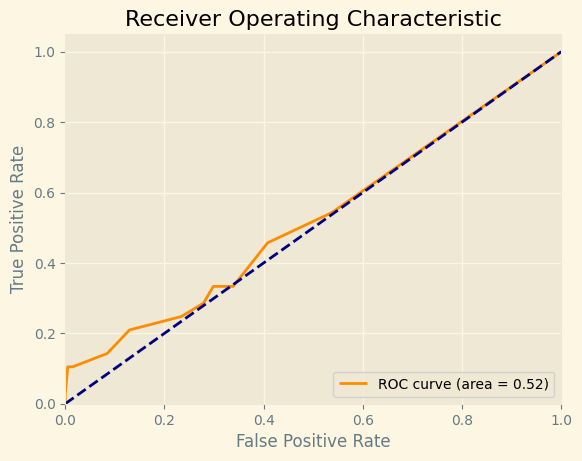

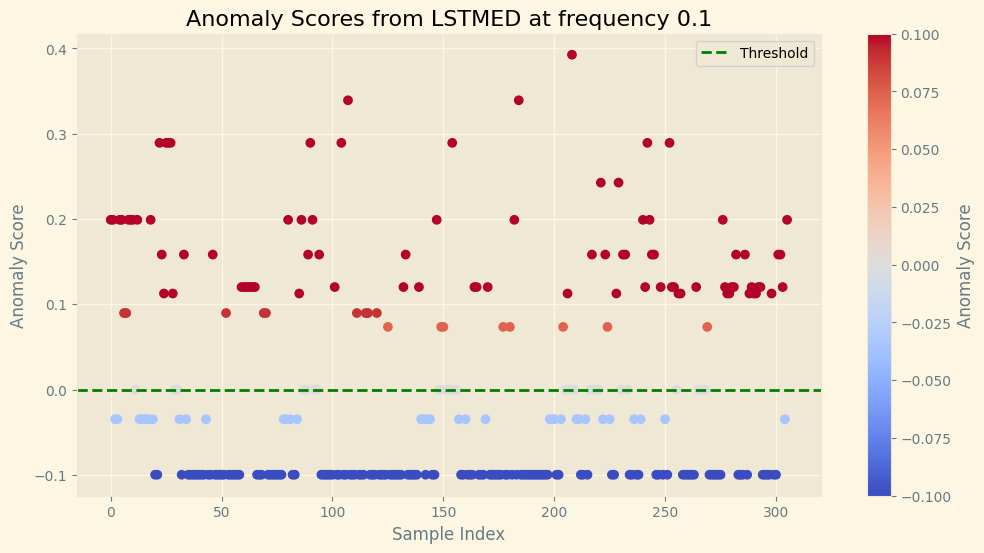

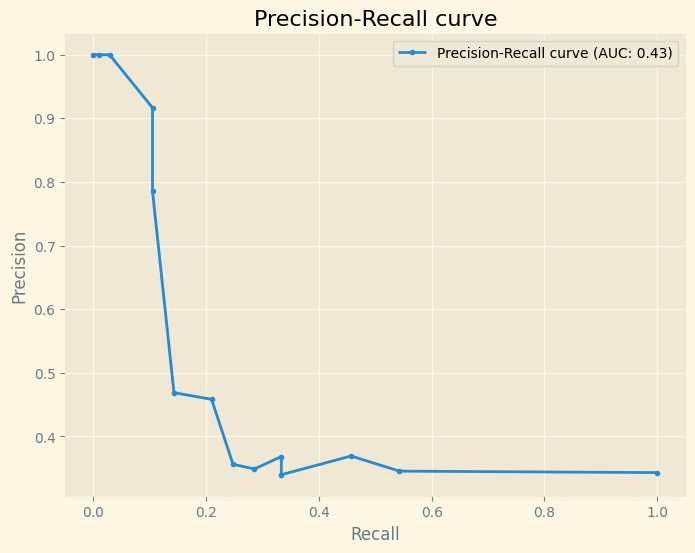

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=1)
2
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
20
IsolationForest(contamination=0.05, n_estimators=1)
31
IsolationForest(contamination=0.1, n_estimators=1)
57
IsolationForest(contamination=0.2, n_estimators=1)
72
IsolationForest(contamination=0.3, n_estimators=1)
124
IsolationForest(contamination=0.4, n_estimators=1)
115
F1 Score: 0.3545
Accuracy: 0.5359
Precision: 0.3391
Recall: 0.3714
              precision    recall  f1-score   support

           0       0.65      0.62      0.64       201
           1       0.34      0.37      0.35       105

    accuracy                           0.54       306
   macro avg       0.50      0.50      0.50       306
weighted avg       0.55      0.54      0.54       306



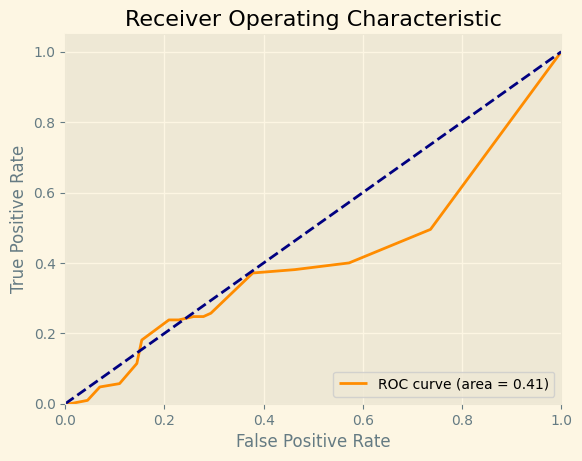

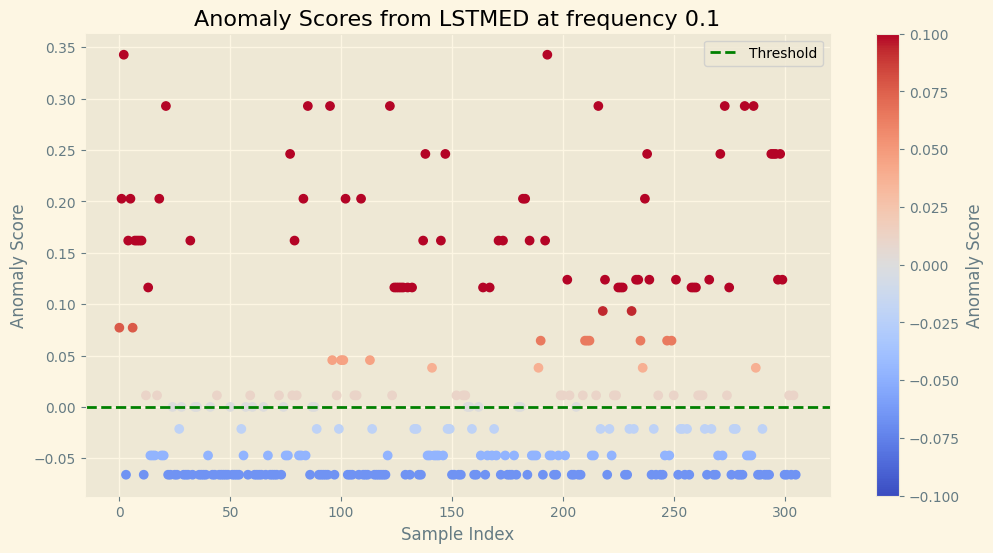

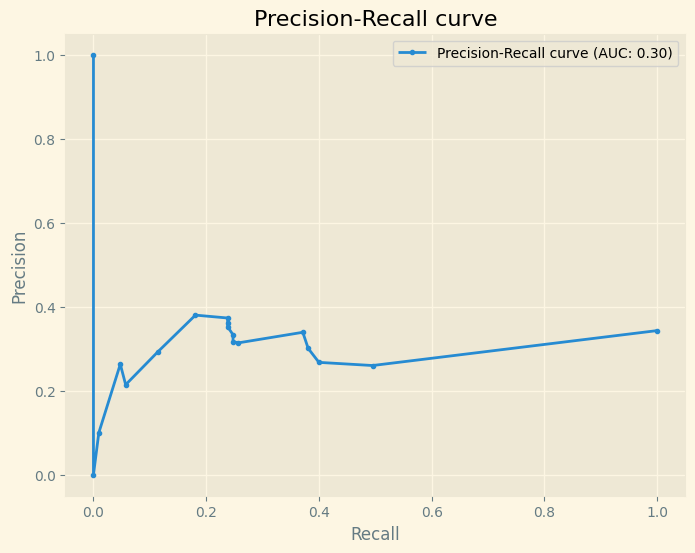

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.5, n_estimators=1)
198
IsolationForest(contamination=0.03, n_estimators=1)
48
IsolationForest(contamination=0.0475, n_estimators=1)
8
IsolationForest(contamination=0.065, n_estimators=1)
23
IsolationForest(contamination=0.0825, n_estimators=1)
28
IsolationForest(contamination=0.1, n_estimators=1)
72
IsolationForest(contamination=0.3431372549019608, n_estimators=2)
173
IsolationForest(contamination=0.005, n_estimators=2)
4
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
57
IsolationForest(contamination=0.05, n_estimators=2)
23
IsolationForest(contamination=0.1, n_estimators=2)
55
IsolationForest(contamination=0.2, n_estimators=2)
90
F1 Score: 0.6051
Accuracy: 0.7484
Precision: 0.6556
Recall: 0.5619
              precision    recall  f1-score   suppor

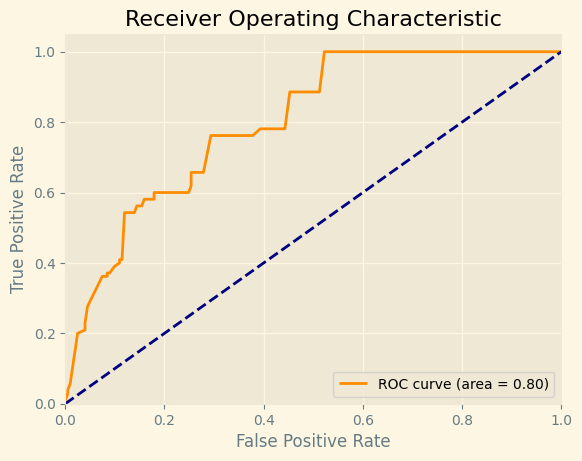

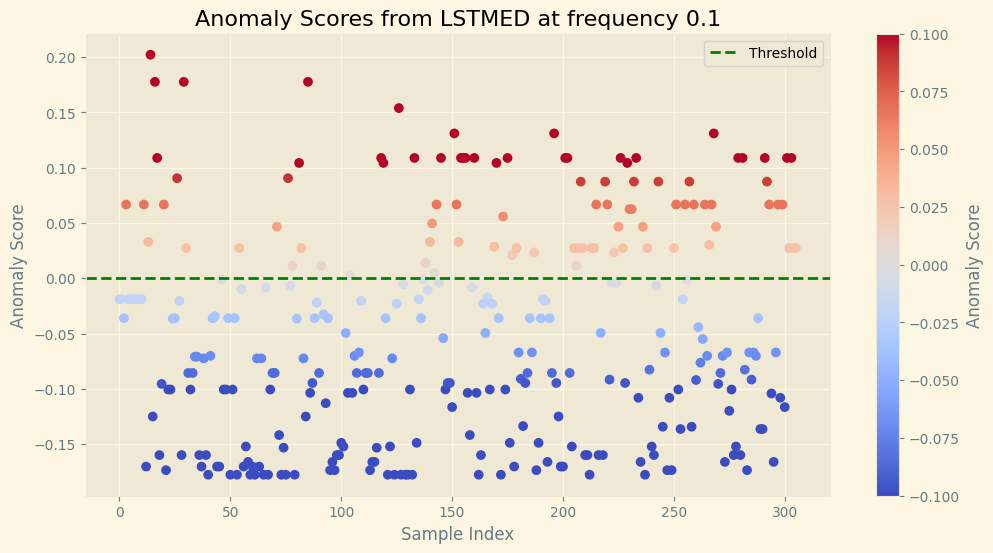

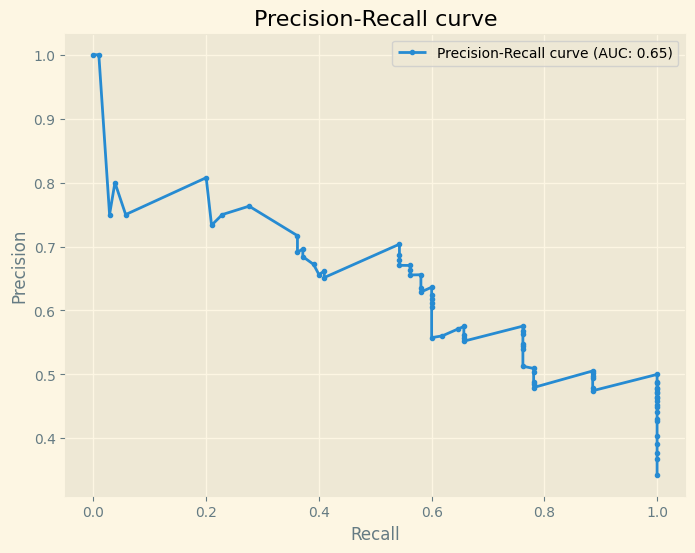

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=2)
147
IsolationForest(contamination=0.4, n_estimators=2)
186
IsolationForest(contamination=0.5, n_estimators=2)
207
IsolationForest(contamination=0.03, n_estimators=2)
21
IsolationForest(contamination=0.0475, n_estimators=2)
112
F1 Score: 0.8848
Accuracy: 0.9183
Precision: 0.8571
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.95      0.92      0.94       201
           1       0.86      0.91      0.88       105

    accuracy                           0.92       306
   macro avg       0.91      0.92      0.91       306
weighted avg       0.92      0.92      0.92       306



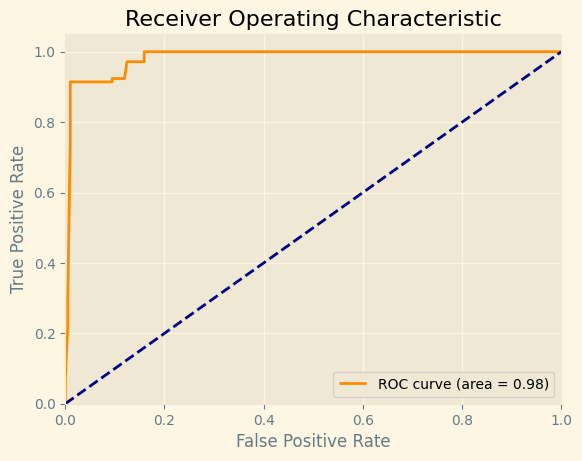

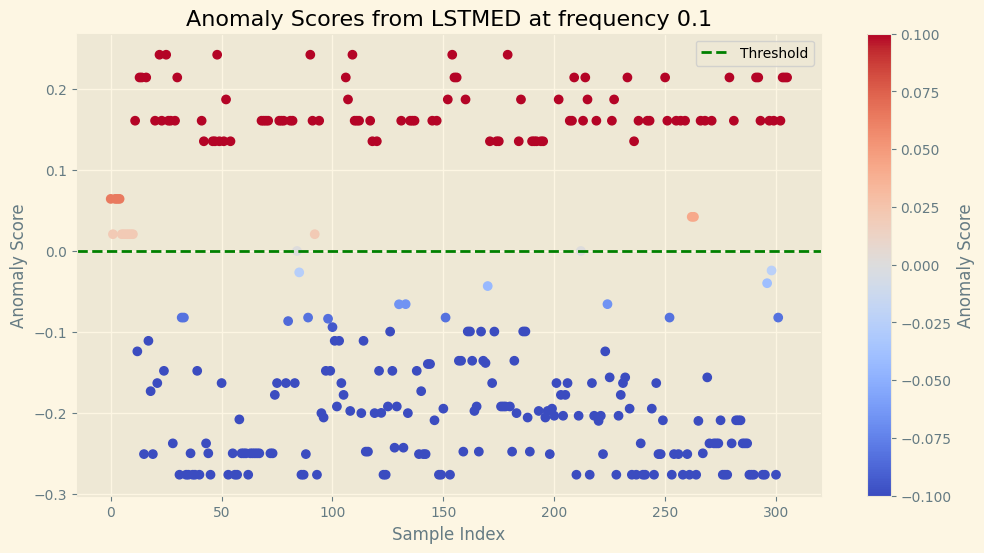

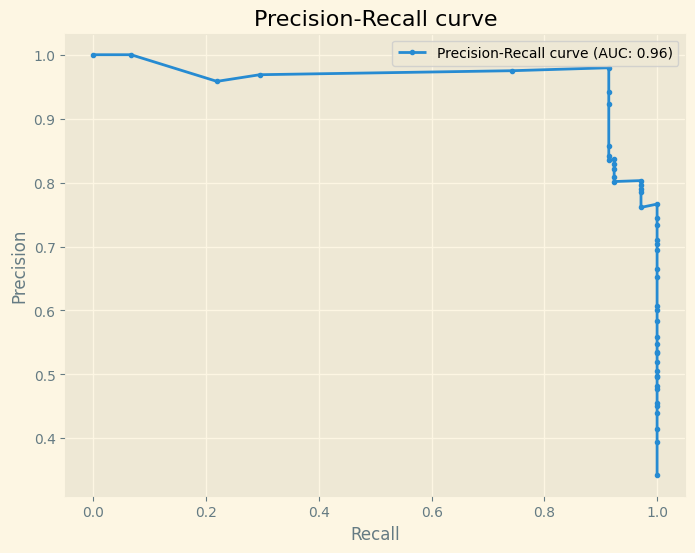

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=2)
33
IsolationForest(contamination=0.0825, n_estimators=2)
41
IsolationForest(contamination=0.1, n_estimators=2)
51
IsolationForest(contamination=0.3431372549019608, n_estimators=3)
168
IsolationForest(contamination=0.005, n_estimators=3)
23
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.03, n_estimators=3)
12
IsolationForest(contamination=0.05, n_estimators=3)
45
IsolationForest(contamination=0.1, n_estimators=3)
96
F1 Score: 0.7363
Accuracy: 0.8268
Precision: 0.7708
Recall: 0.7048
              precision    recall  f1-score   support

           0       0.85      0.89      0.87       201
           1       0.77      0.70      0.74       105

    accuracy                           0.83       306
   macro avg       0.81      0.80      0.80       306

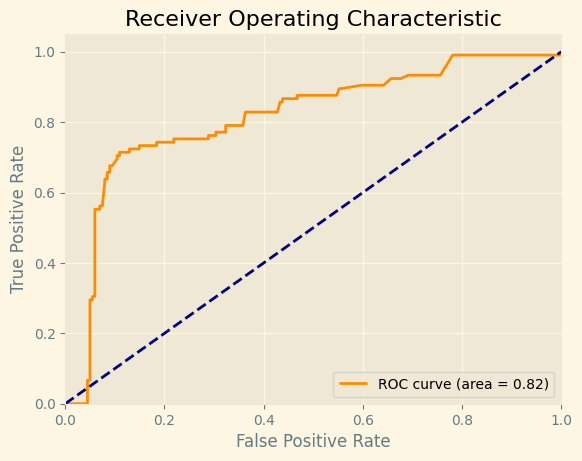

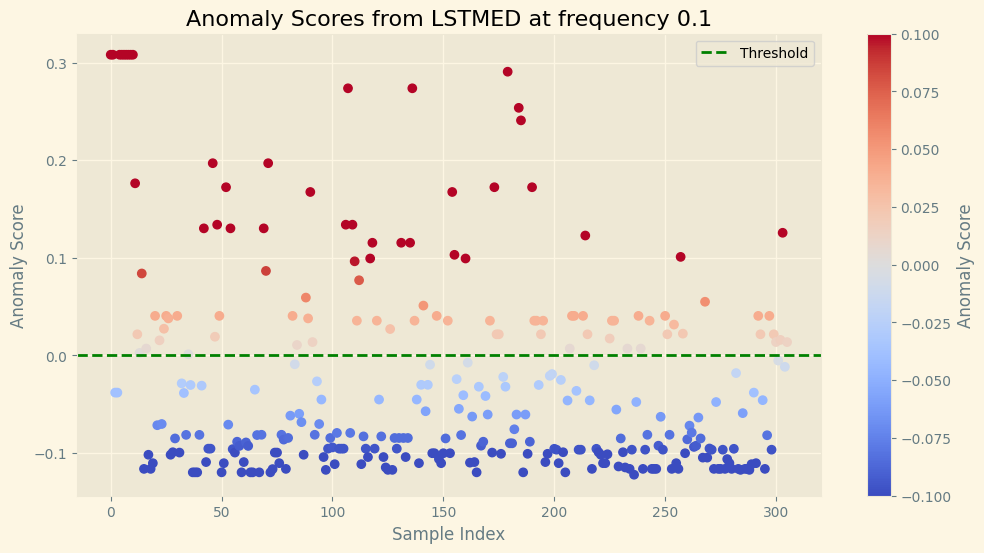

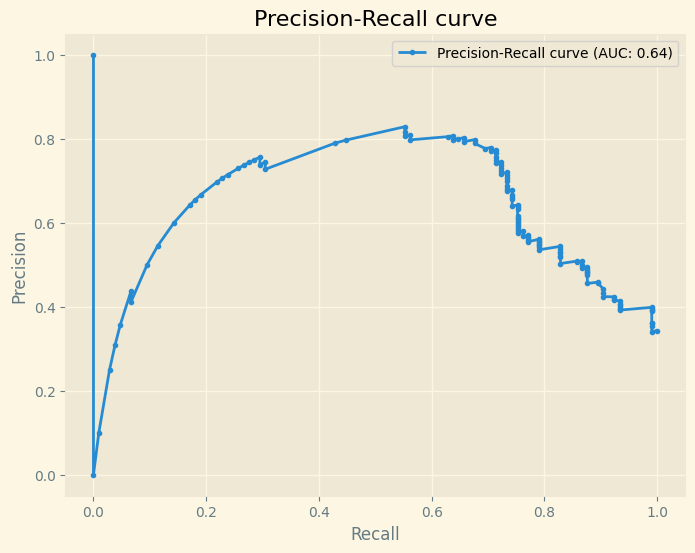

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
85
F1 Score: 0.5368
Accuracy: 0.7124
Precision: 0.6000
Recall: 0.4857
              precision    recall  f1-score   support

           0       0.76      0.83      0.79       201
           1       0.60      0.49      0.54       105

    accuracy                           0.71       306
   macro avg       0.68      0.66      0.66       306
weighted avg       0.70      0.71      0.70       306



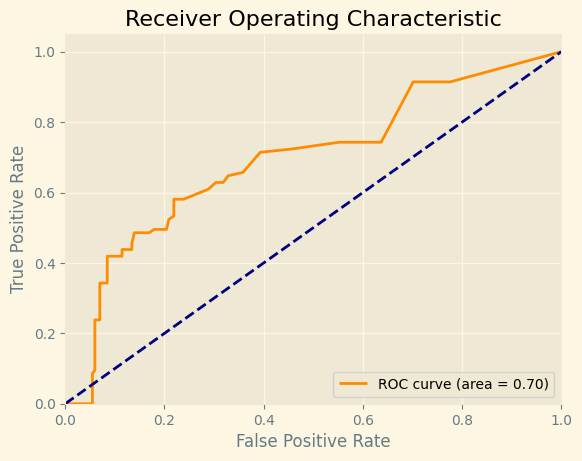

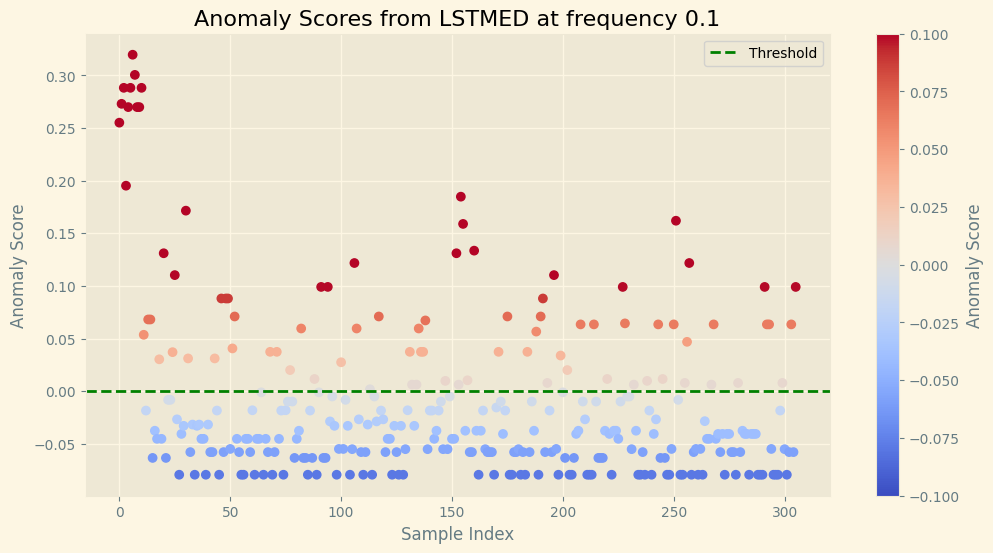

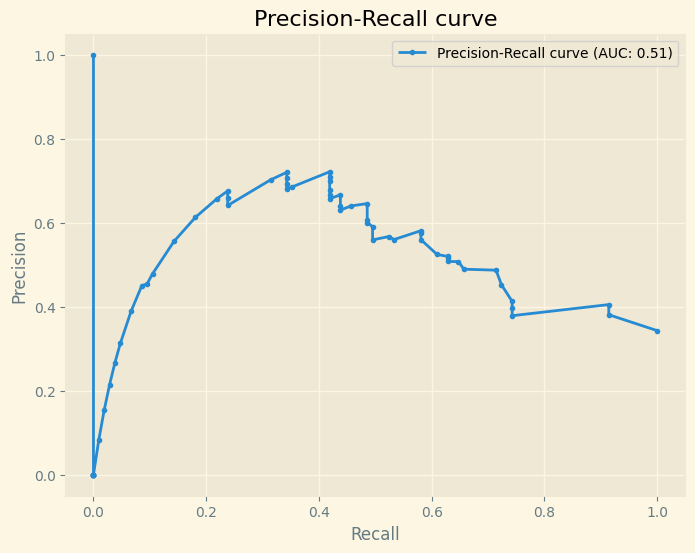

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=3)
101
F1 Score: 0.5340
Accuracy: 0.6863
Precision: 0.5446
Recall: 0.5238
              precision    recall  f1-score   support

           0       0.76      0.77      0.76       201
           1       0.54      0.52      0.53       105

    accuracy                           0.69       306
   macro avg       0.65      0.65      0.65       306
weighted avg       0.68      0.69      0.68       306



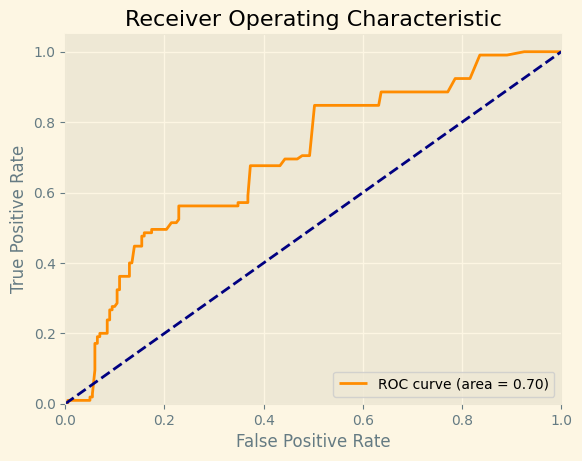

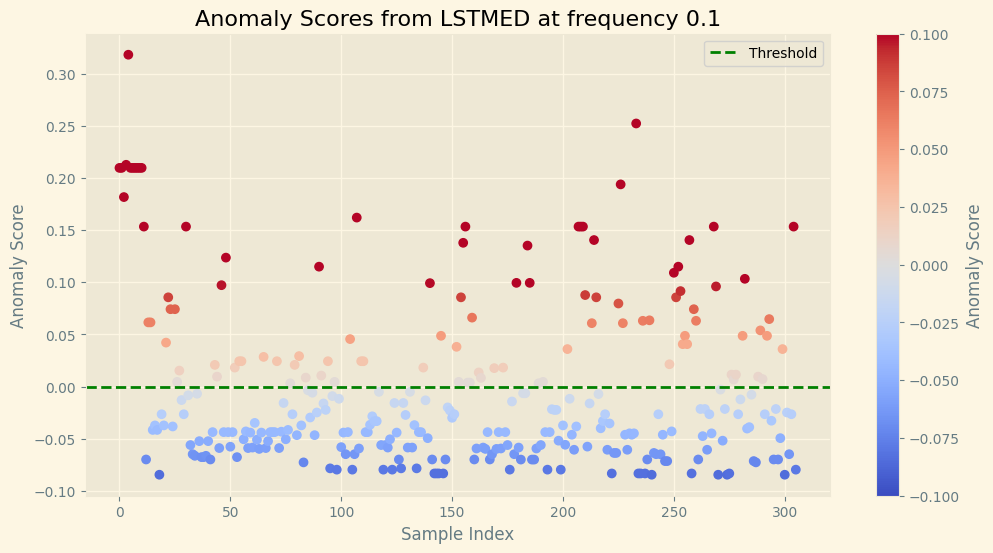

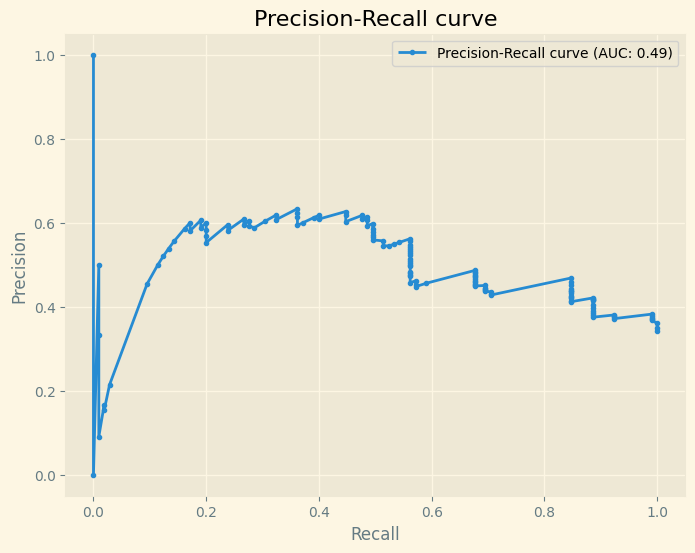

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=3)
180
IsolationForest(contamination=0.5, n_estimators=3)
193
IsolationForest(contamination=0.03, n_estimators=3)
29
IsolationForest(contamination=0.0475, n_estimators=3)
22
IsolationForest(contamination=0.065, n_estimators=3)
92
F1 Score: 0.8122
Accuracy: 0.8791
Precision: 0.8696
Recall: 0.7619
              precision    recall  f1-score   support

           0       0.88      0.94      0.91       201
           1       0.87      0.76      0.81       105

    accuracy                           0.88       306
   macro avg       0.88      0.85      0.86       306
weighted avg       0.88      0.88      0.88       306



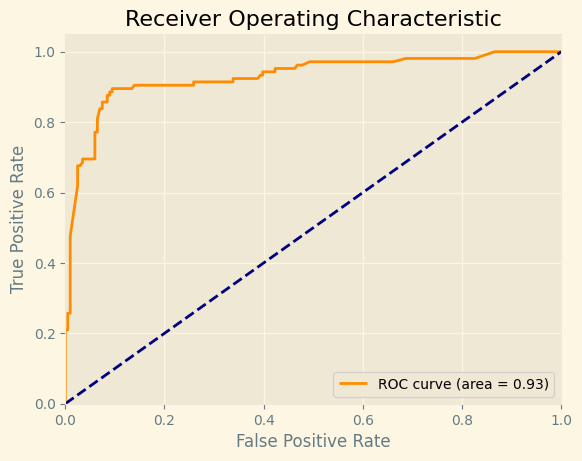

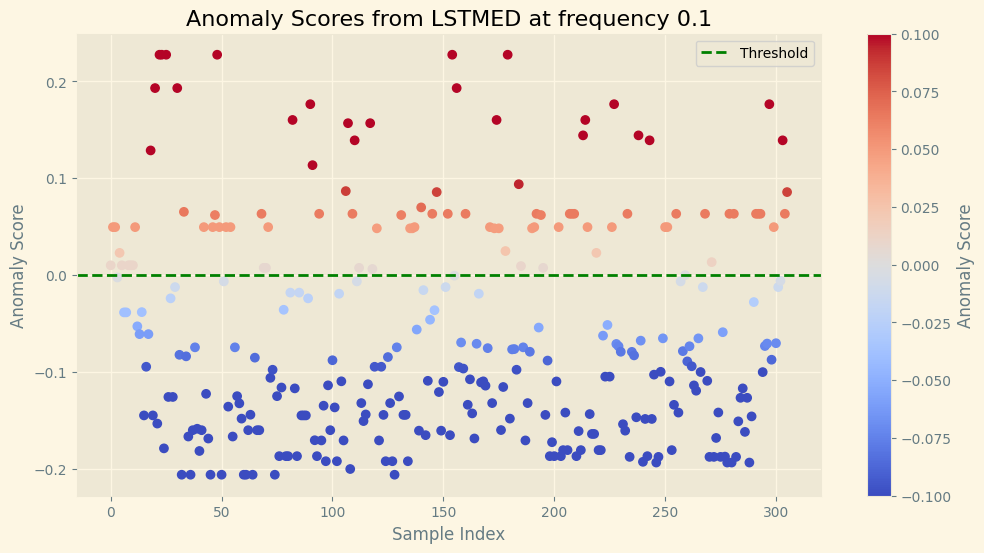

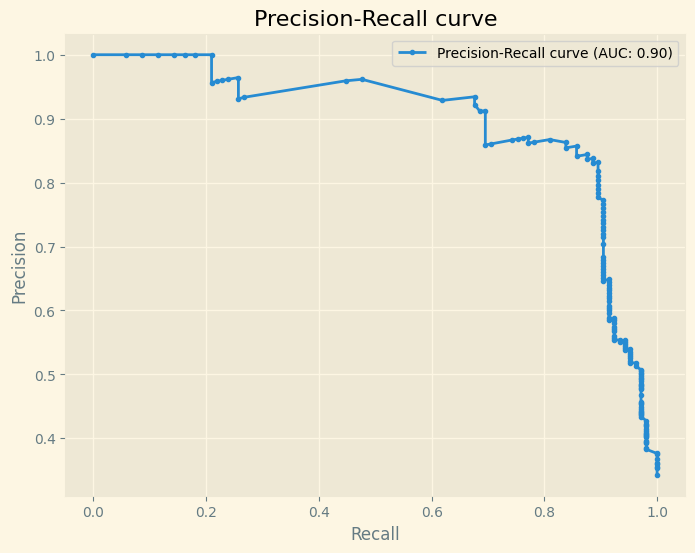

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=3)
104
F1 Score: 0.8421
Accuracy: 0.8922
Precision: 0.8462
Recall: 0.8381
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       201
           1       0.85      0.84      0.84       105

    accuracy                           0.89       306
   macro avg       0.88      0.88      0.88       306
weighted avg       0.89      0.89      0.89       306



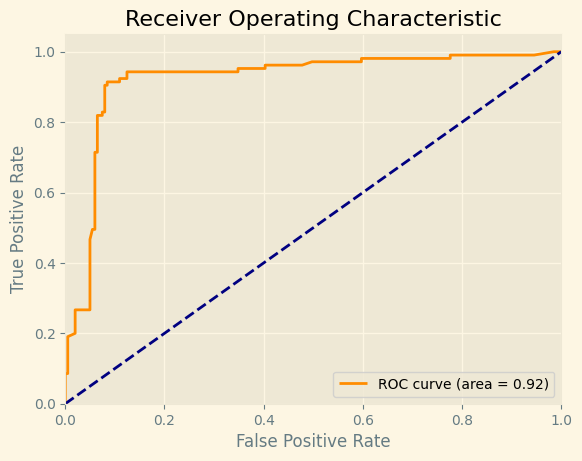

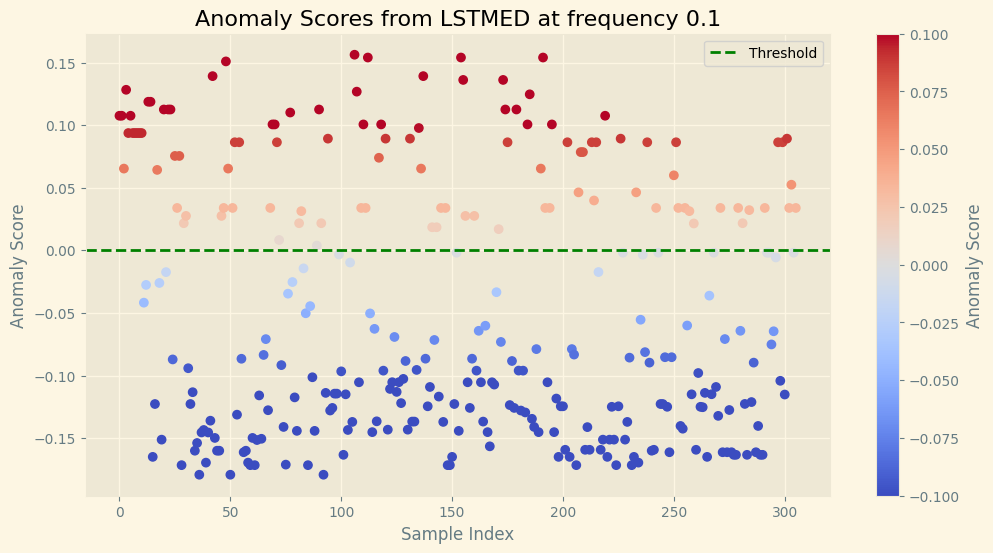

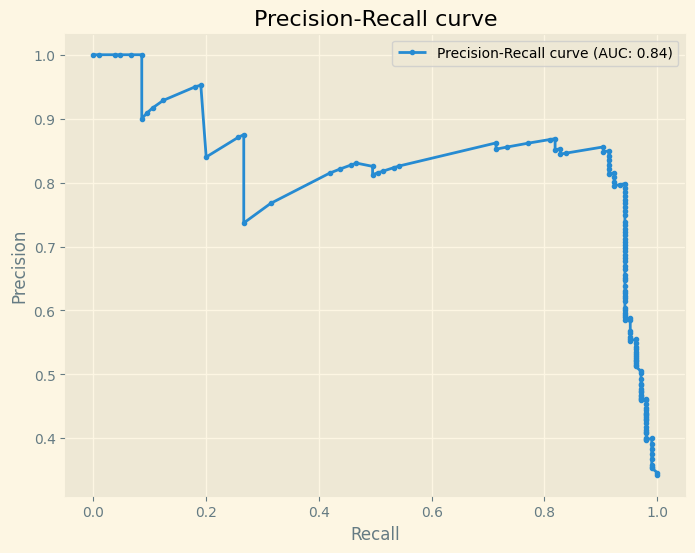

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=3)
40
IsolationForest(contamination=0.3431372549019608, n_estimators=5)
142
IsolationForest(contamination=0.005, n_estimators=5)
20
IsolationForest(contamination=0.001, n_estimators=5)
7
IsolationForest(contamination=0.001, n_estimators=5)
3
IsolationForest(contamination=0.03, n_estimators=5)
26
IsolationForest(contamination=0.05, n_estimators=5)
85
F1 Score: 0.7684
Accuracy: 0.8562
Precision: 0.8588
Recall: 0.6952
              precision    recall  f1-score   support

           0       0.86      0.94      0.90       201
           1       0.86      0.70      0.77       105

    accuracy                           0.86       306
   macro avg       0.86      0.82      0.83       306
weighted avg       0.86      0.86      0.85       306



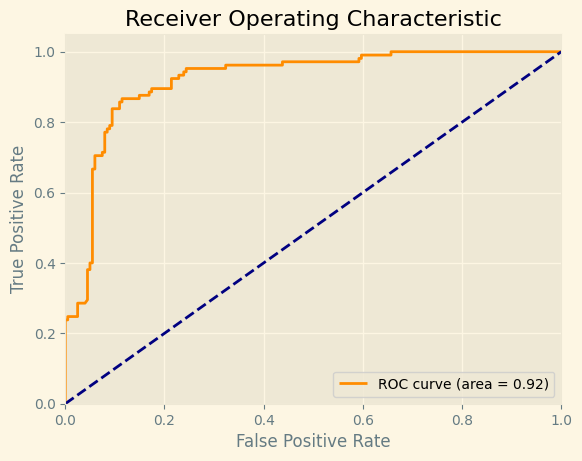

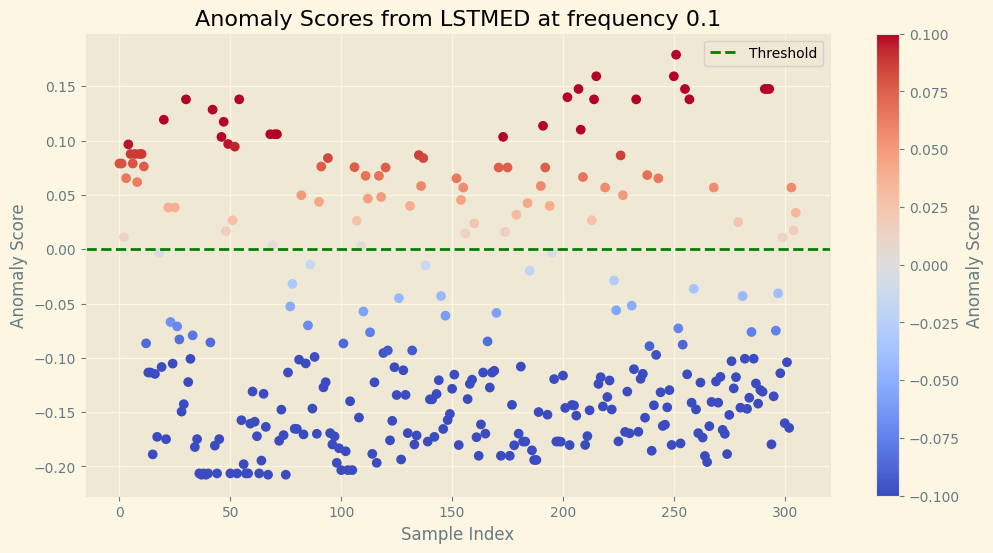

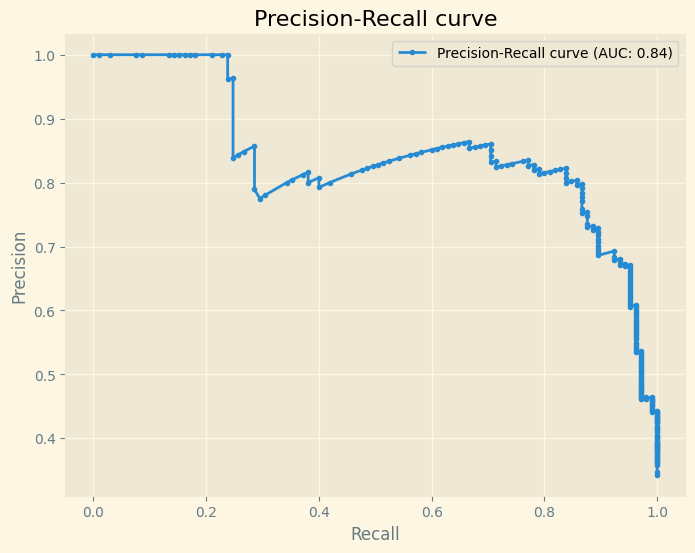

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=5)
66
IsolationForest(contamination=0.2, n_estimators=5)
99
F1 Score: 0.6275
Accuracy: 0.7516
Precision: 0.6465
Recall: 0.6095
              precision    recall  f1-score   support

           0       0.80      0.83      0.81       201
           1       0.65      0.61      0.63       105

    accuracy                           0.75       306
   macro avg       0.72      0.72      0.72       306
weighted avg       0.75      0.75      0.75       306



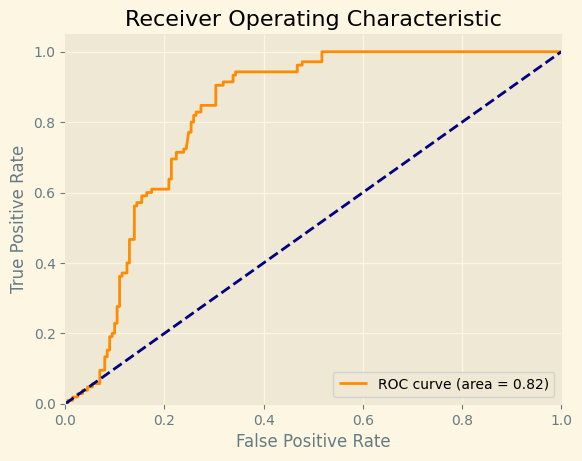

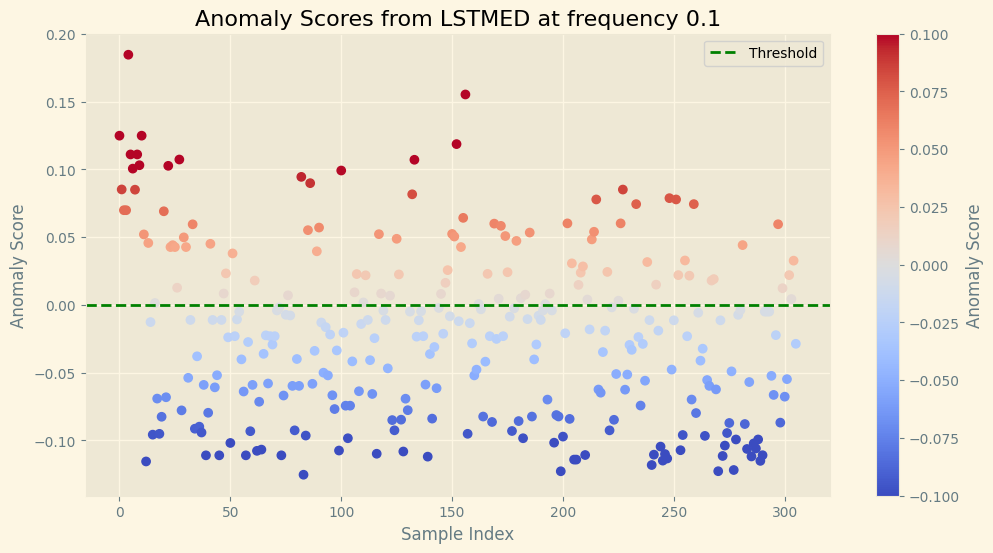

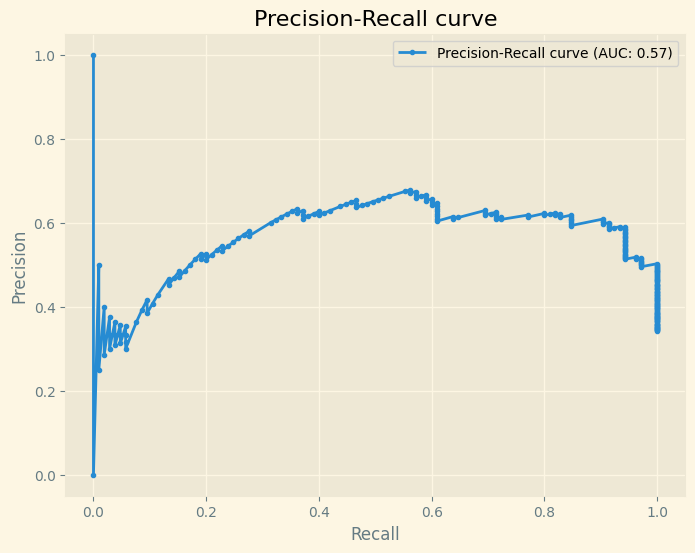

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=5)
156
IsolationForest(contamination=0.4, n_estimators=5)
186
IsolationForest(contamination=0.5, n_estimators=5)
200
IsolationForest(contamination=0.03, n_estimators=5)
18
IsolationForest(contamination=0.0475, n_estimators=5)
112
F1 Score: 0.8940
Accuracy: 0.9248
Precision: 0.8661
Recall: 0.9238
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       201
           1       0.87      0.92      0.89       105

    accuracy                           0.92       306
   macro avg       0.91      0.92      0.92       306
weighted avg       0.93      0.92      0.93       306



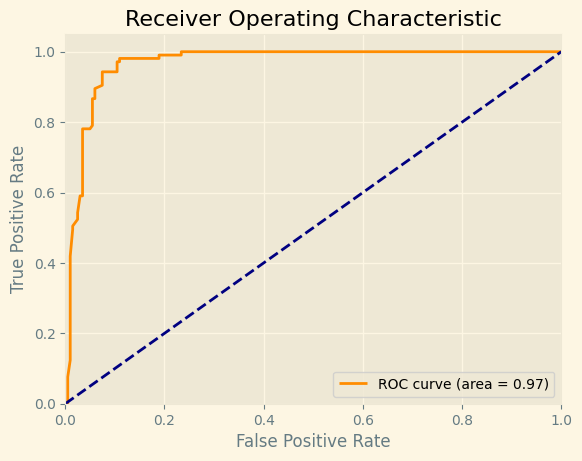

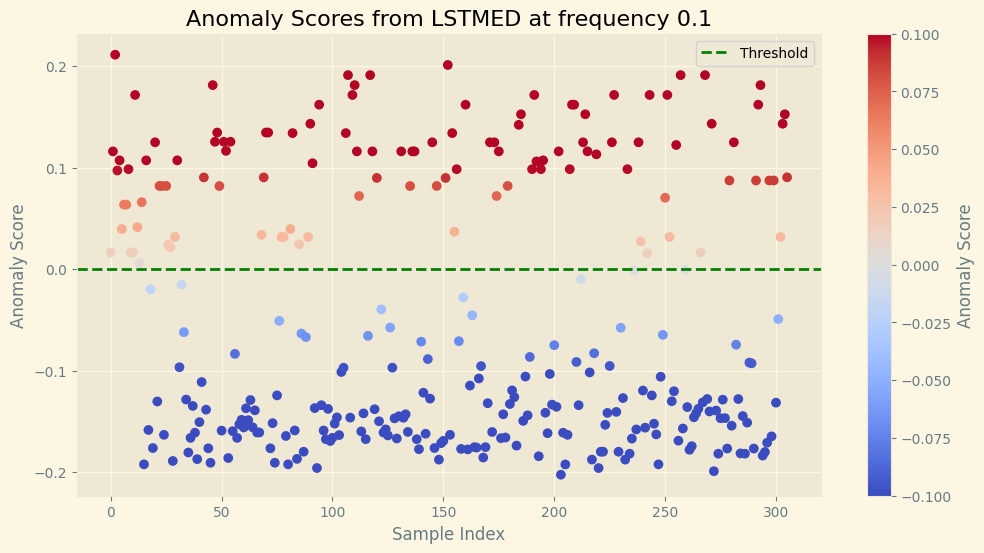

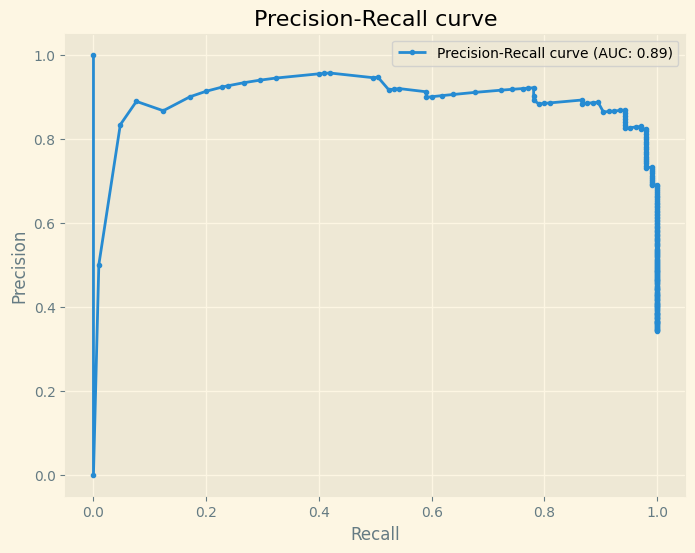

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=5)
37
IsolationForest(contamination=0.0825, n_estimators=5)
58
IsolationForest(contamination=0.1, n_estimators=5)
27
IsolationForest(contamination=0.3431372549019608, n_estimators=10)
168
IsolationForest(contamination=0.005, n_estimators=10)
2
IsolationForest(contamination=0.001, n_estimators=10)
3
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
13
IsolationForest(contamination=0.05, n_estimators=10)
82
F1 Score: 0.7380
Accuracy: 0.8399
Precision: 0.8415
Recall: 0.6571
              precision    recall  f1-score   support

           0       0.84      0.94      0.88       201
           1       0.84      0.66      0.74       105

    accuracy                           0.84       306
   macro avg       0.84      0.80      0.81       306
weighted avg       0.84      0.84      0.83     

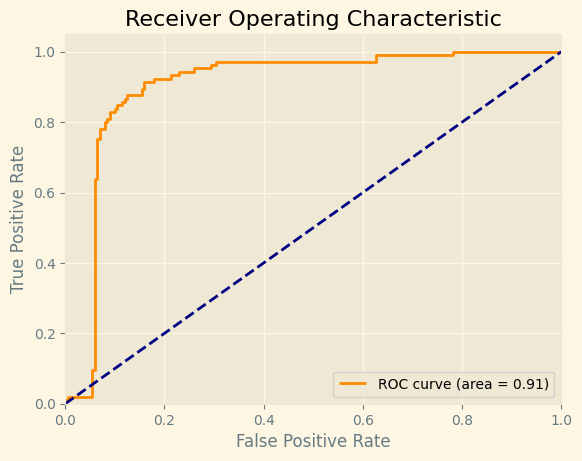

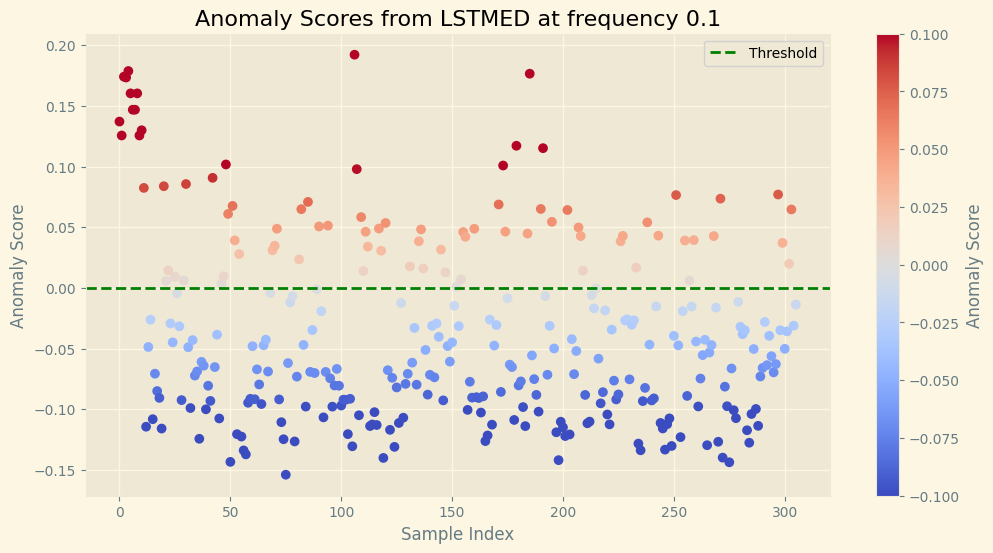

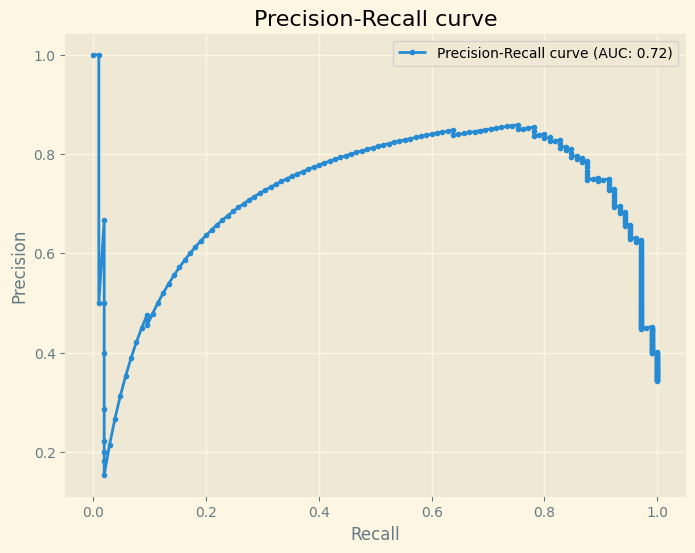

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
114
F1 Score: 0.8584
Accuracy: 0.8987
Precision: 0.8246
Recall: 0.8952
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       201
           1       0.82      0.90      0.86       105

    accuracy                           0.90       306
   macro avg       0.88      0.90      0.89       306
weighted avg       0.90      0.90      0.90       306



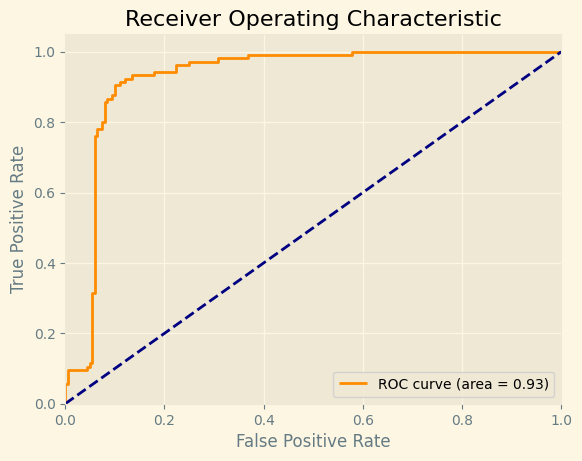

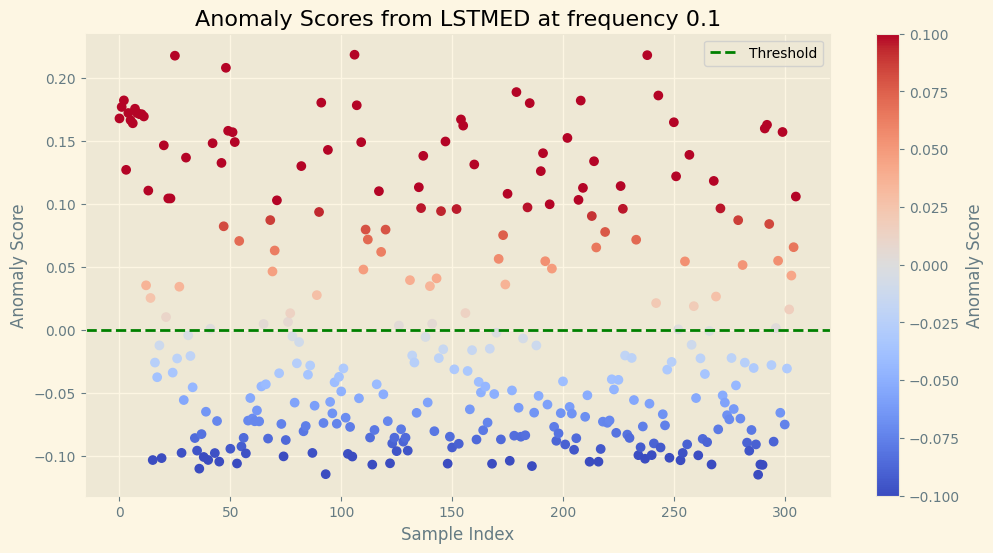

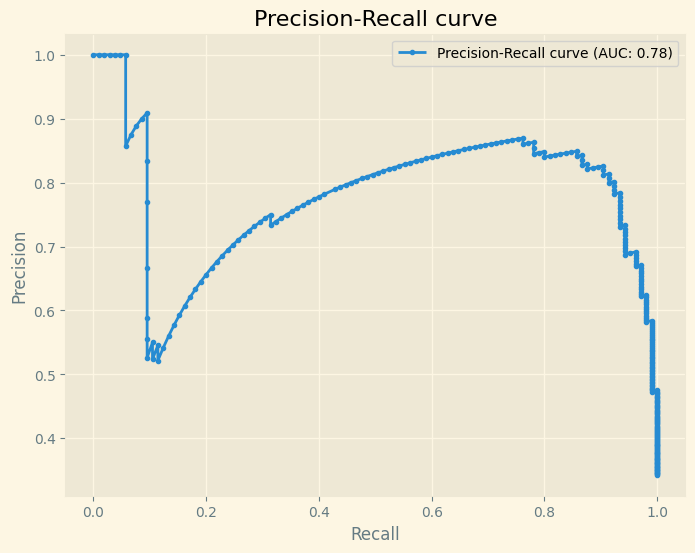

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=10)
134
IsolationForest(contamination=0.3, n_estimators=10)
156
IsolationForest(contamination=0.4, n_estimators=10)
181
IsolationForest(contamination=0.5, n_estimators=10)
197
IsolationForest(contamination=0.03, n_estimators=10)
18
IsolationForest(contamination=0.0475, n_estimators=10)
39
IsolationForest(contamination=0.065, n_estimators=10)
87
F1 Score: 0.6667
Accuracy: 0.7908
Precision: 0.7356
Recall: 0.6095
              precision    recall  f1-score   support

           0       0.81      0.89      0.85       201
           1       0.74      0.61      0.67       105

    accuracy                           0.79       306
   macro avg       0.77      0.75      0.76       306
weighted avg       0.79      0.79      0.79       306



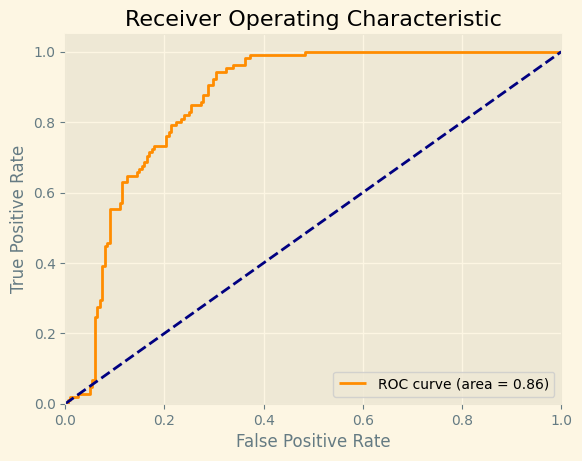

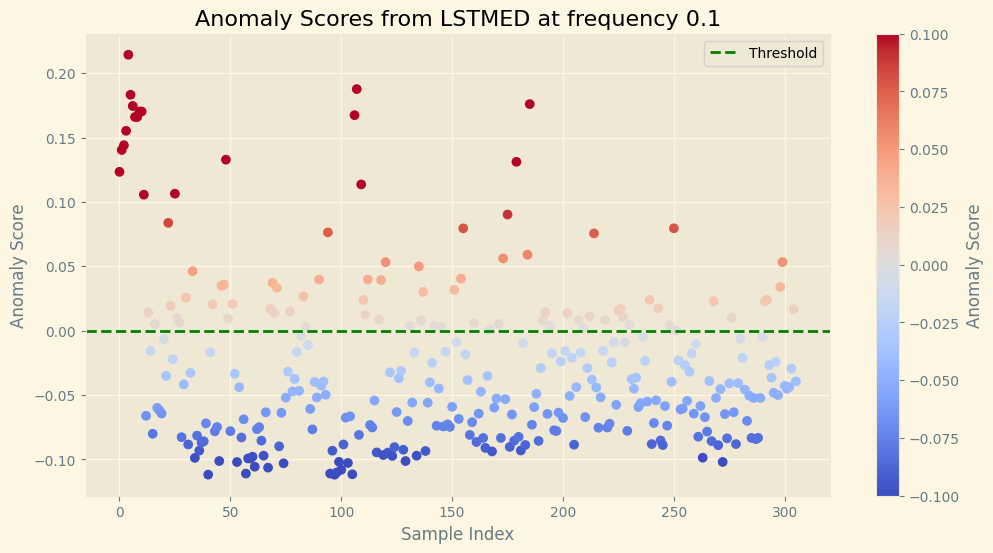

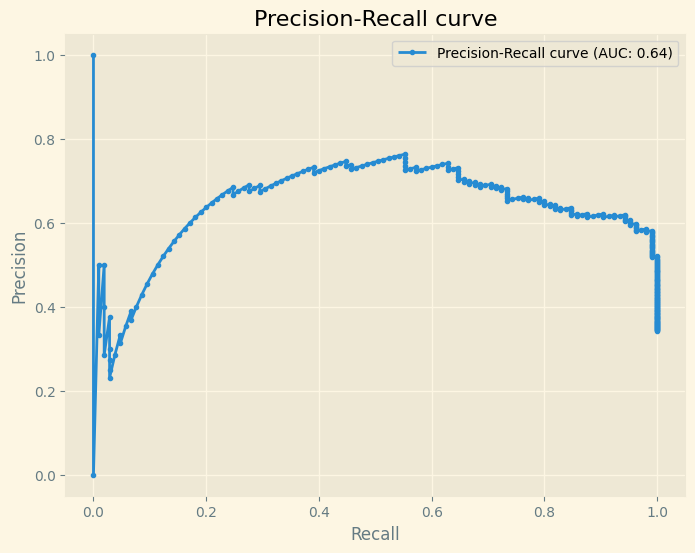

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
122
IsolationForest(contamination=0.1, n_estimators=10)
92
F1 Score: 0.6904
Accuracy: 0.8007
Precision: 0.7391
Recall: 0.6476
              precision    recall  f1-score   support

           0       0.83      0.88      0.85       201
           1       0.74      0.65      0.69       105

    accuracy                           0.80       306
   macro avg       0.78      0.76      0.77       306
weighted avg       0.80      0.80      0.80       306



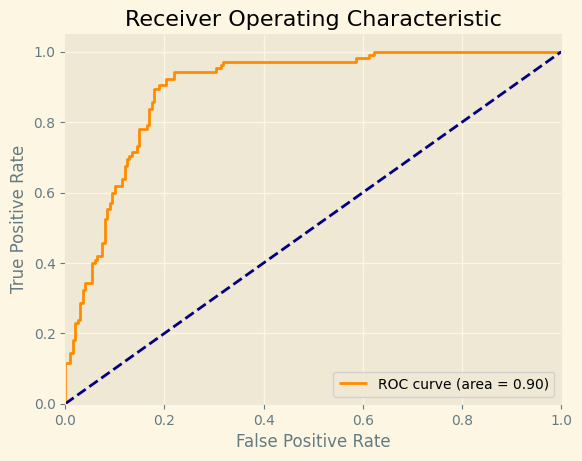

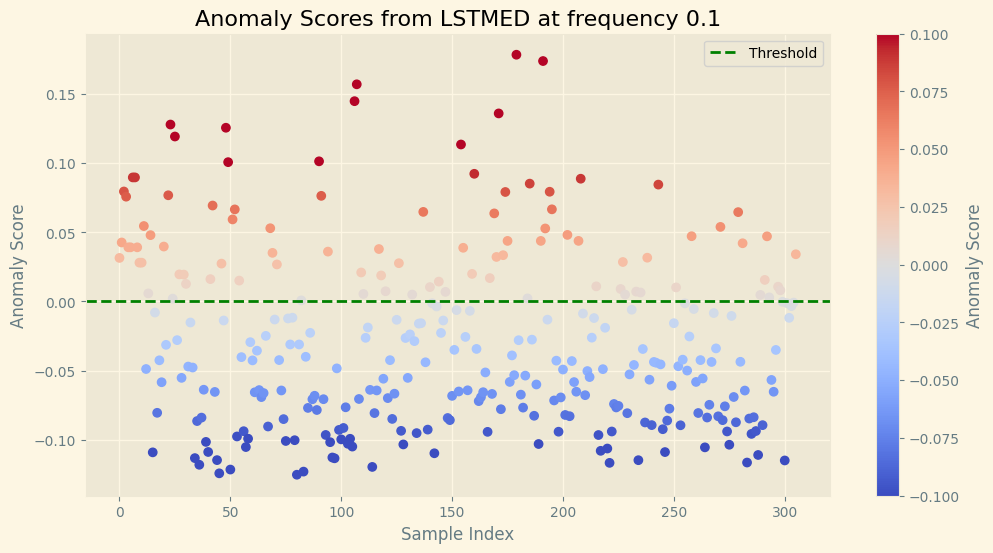

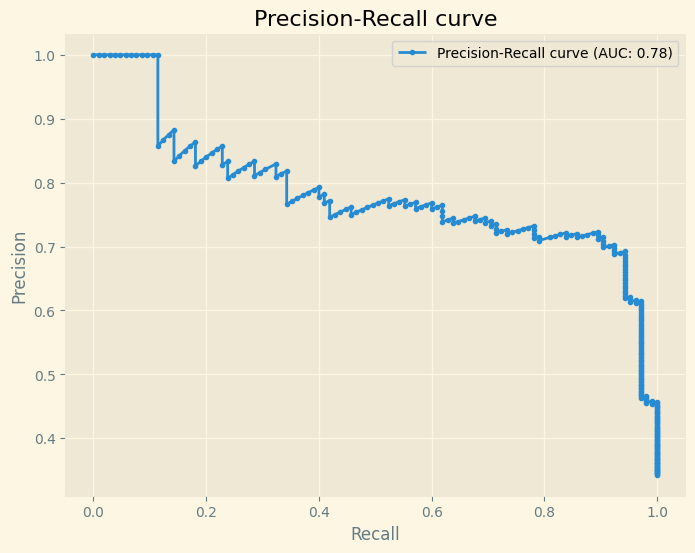

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608)
163
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
19
IsolationForest(contamination=0.05)
109
F1 Score: 0.8879
Accuracy: 0.9216
Precision: 0.8716
Recall: 0.9048
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       201
           1       0.87      0.90      0.89       105

    accuracy                           0.92       306
   macro avg       0.91      0.92      0.91       306
weighted avg       0.92      0.92      0.92       306



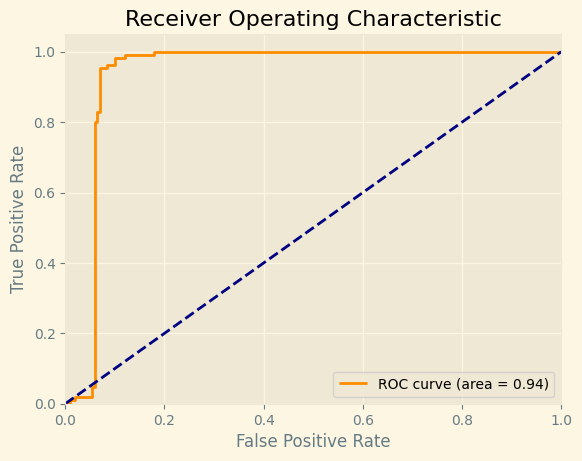

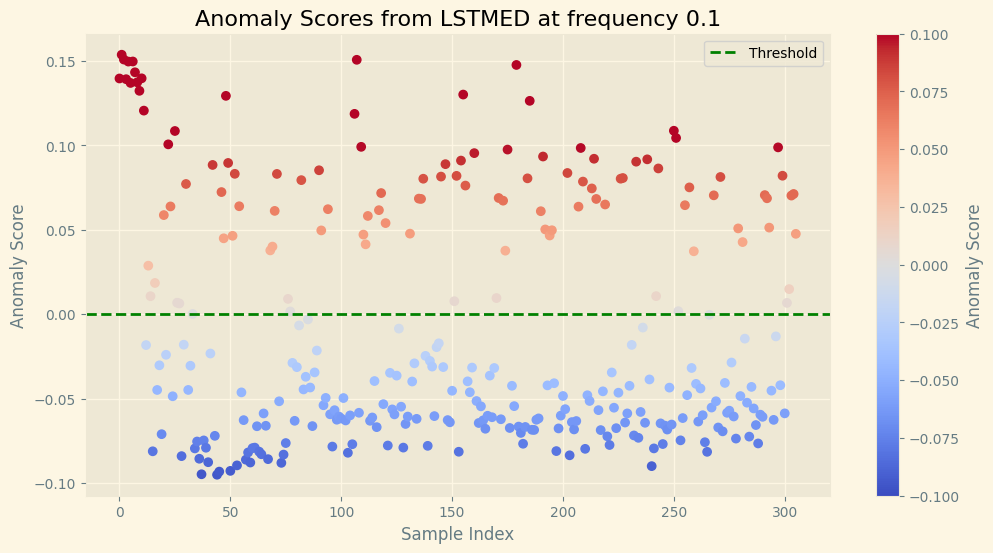

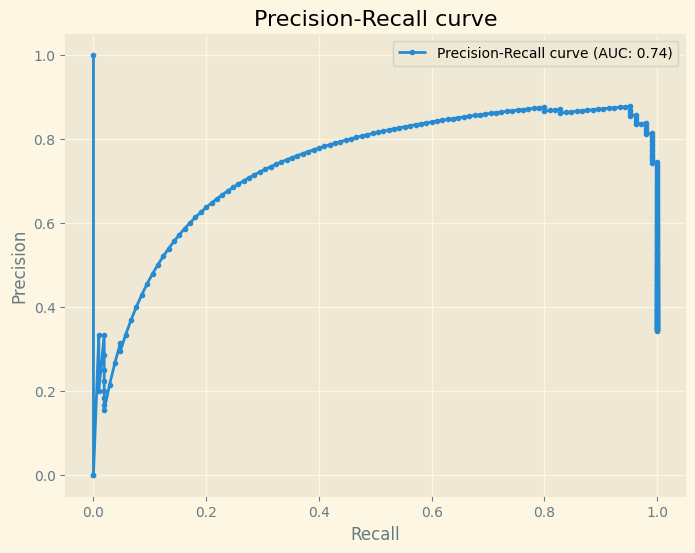

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
120
IsolationForest(contamination=0.2)
138
IsolationForest(contamination=0.3)
154
IsolationForest(contamination=0.4)
186
IsolationForest(contamination=0.5)
195
IsolationForest(contamination=0.03)
16
IsolationForest(contamination=0.0475)
105
F1 Score: 0.8762
Accuracy: 0.9150
Precision: 0.8762
Recall: 0.8762
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       201
           1       0.88      0.88      0.88       105

    accuracy                           0.92       306
   macro avg       0.91      0.91      0.91       306
weighted avg       0.92      0.92      0.92       306



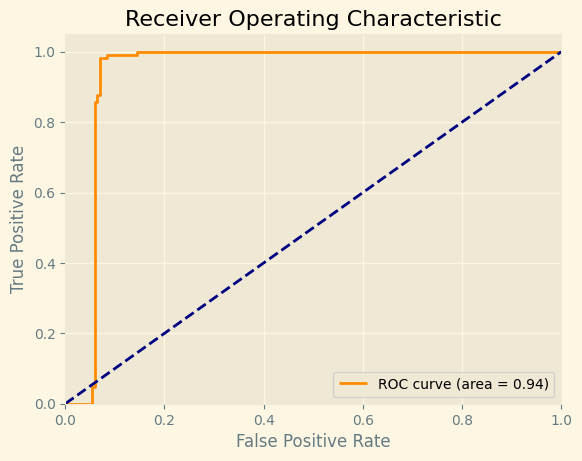

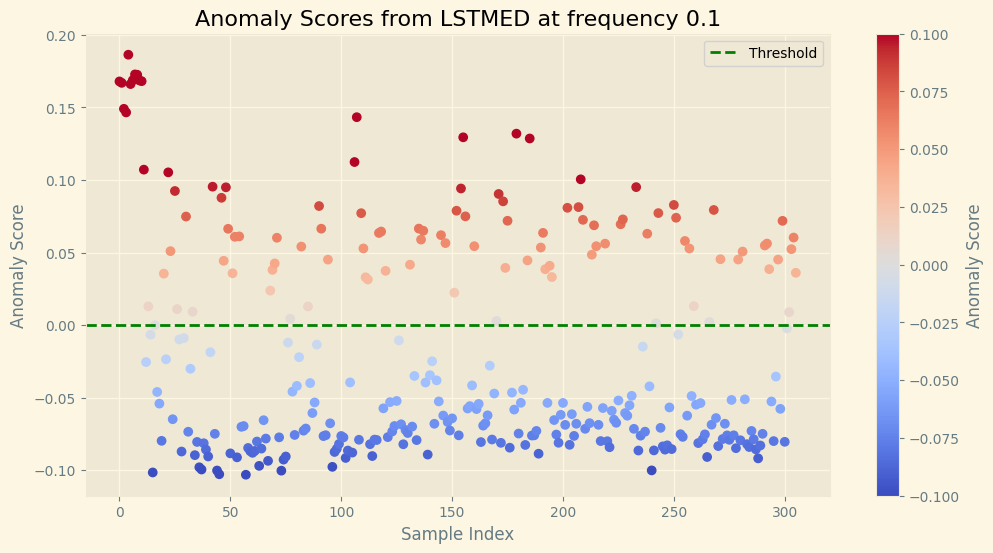

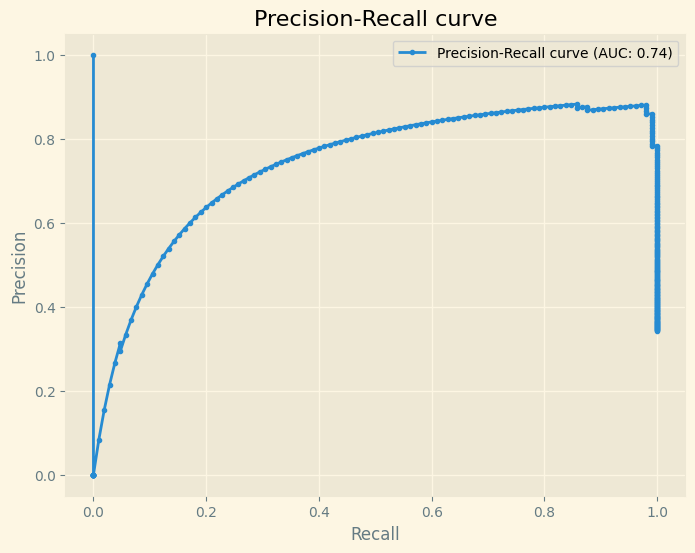

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
113
F1 Score: 0.9083
Accuracy: 0.9346
Precision: 0.8761
Recall: 0.9429
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       201
           1       0.88      0.94      0.91       105

    accuracy                           0.93       306
   macro avg       0.92      0.94      0.93       306
weighted avg       0.94      0.93      0.94       306



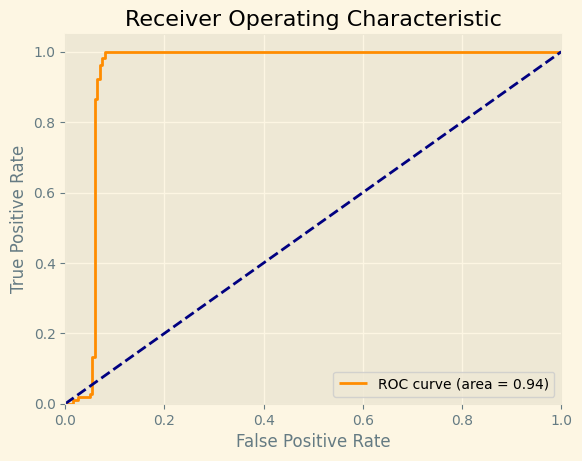

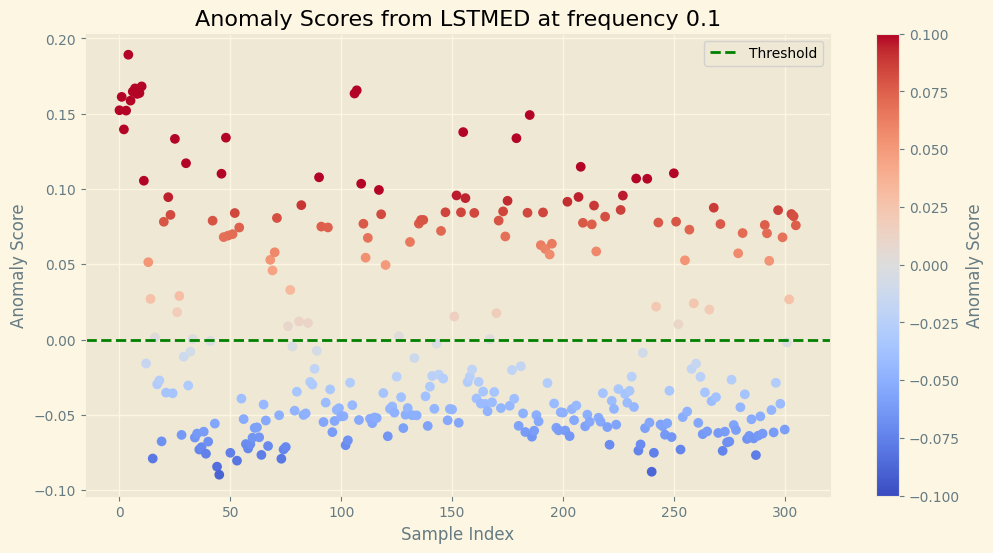

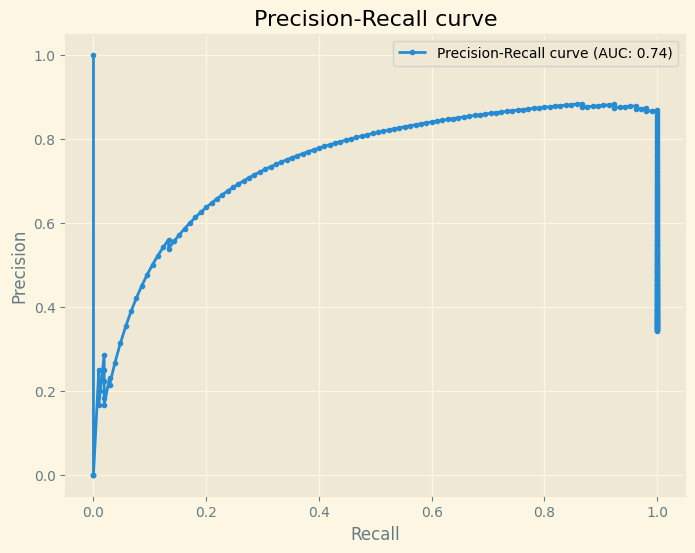

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
111
F1 Score: 0.8889
Accuracy: 0.9216
Precision: 0.8649
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       201
           1       0.86      0.91      0.89       105

    accuracy                           0.92       306
   macro avg       0.91      0.92      0.91       306
weighted avg       0.92      0.92      0.92       306



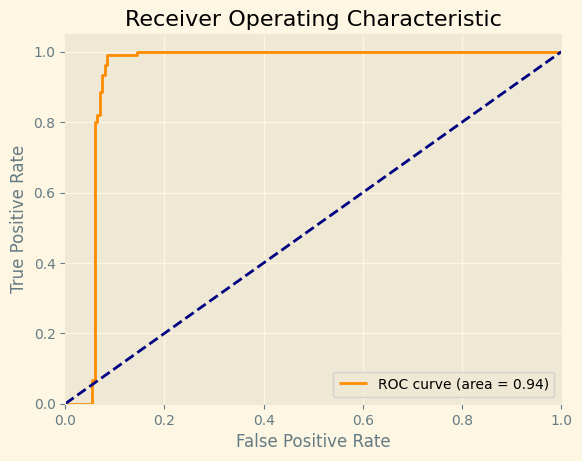

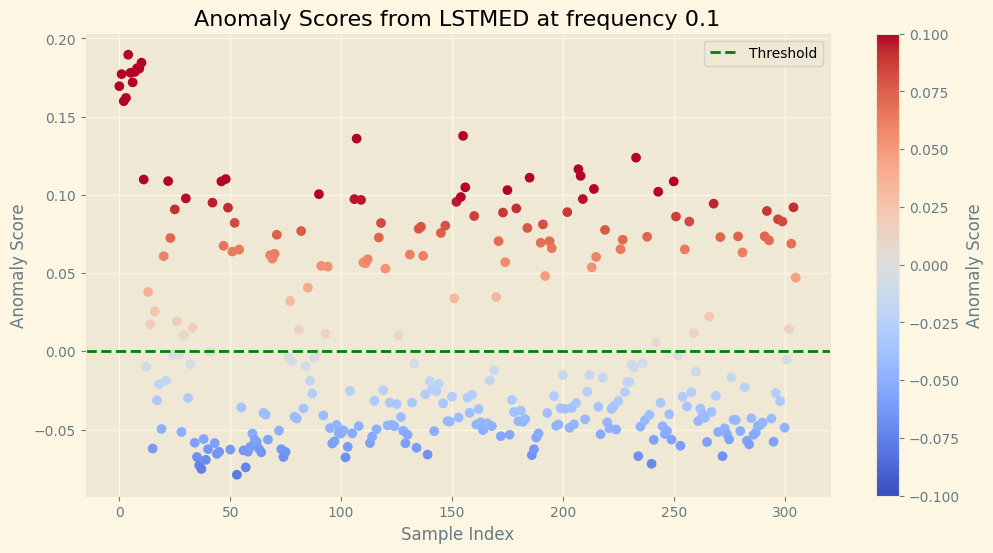

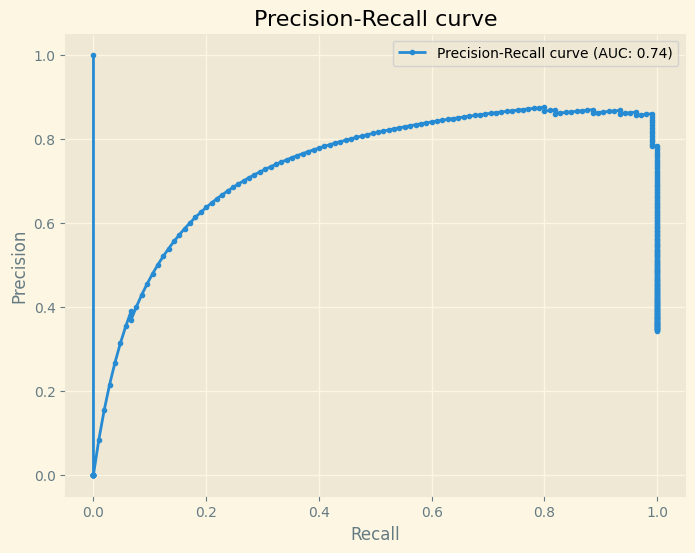

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
115
F1 Score: 0.8909
Accuracy: 0.9216
Precision: 0.8522
Recall: 0.9333
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       201
           1       0.85      0.93      0.89       105

    accuracy                           0.92       306
   macro avg       0.91      0.92      0.91       306
weighted avg       0.93      0.92      0.92       306



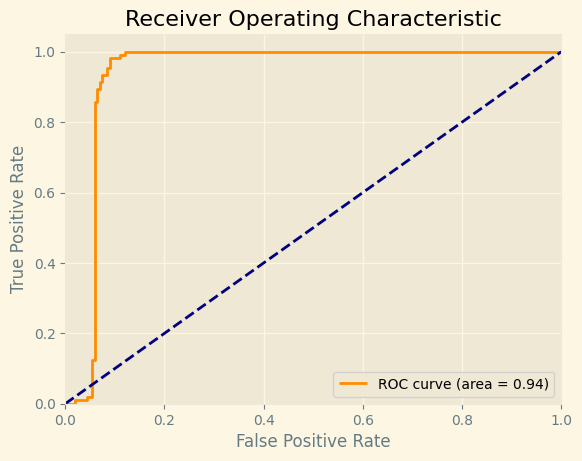

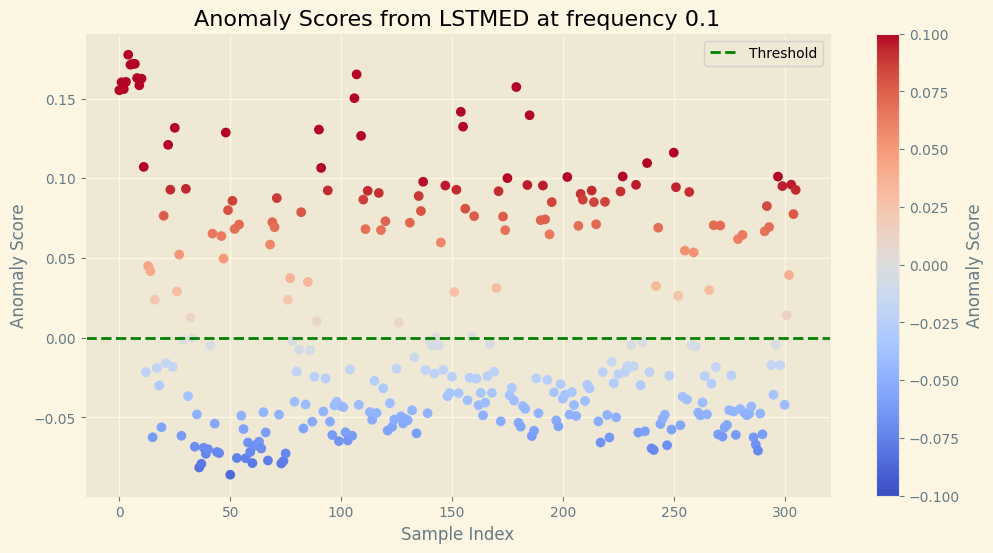

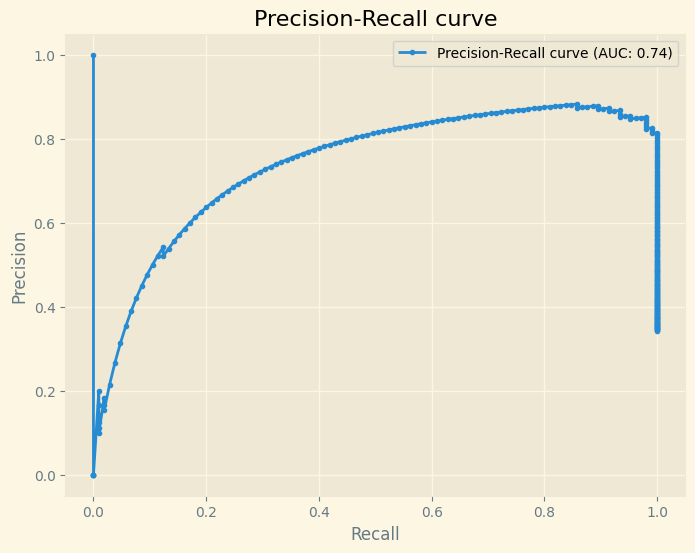

########################## ---------------------------------------- ##########################


In [31]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = anomaly_scores > 0
    df_test["anomaly_score"] = anomaly_scores
    df_test["is_collision"] = np.array(anomalies_detected, dtype=int)
    anomalies_detected_sum = np.sum(anomalies_detected)
    print(f"{anomalies_detected_sum}")

    if (anomalies_detected_sum > 80 and anomalies_detected_sum < 120):
        compute_metrics(y_collisions, anomalies_detected)
        plot_roc_curve(y_collisions, anomaly_scores)
        _ = plot_anomalies(anomaly_scores, freq, threshold)
        plot_precision_recall_curve(y_collisions, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

### Classifying collisions_1

IsolationForest(contamination=0.3431372549019608, n_estimators=1)
58
F1 Score: 0.3441
Accuracy: 0.6280
Precision: 0.2759
Recall: 0.4571
              precision    recall  f1-score   support

           0       0.82      0.67      0.74       129
           1       0.28      0.46      0.34        35

    accuracy                           0.63       164
   macro avg       0.55      0.57      0.54       164
weighted avg       0.70      0.63      0.66       164



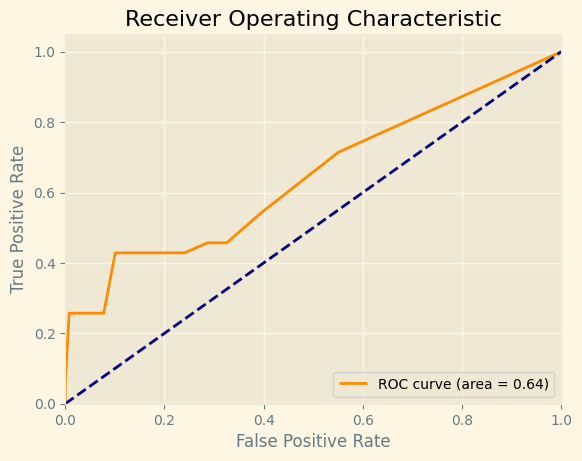

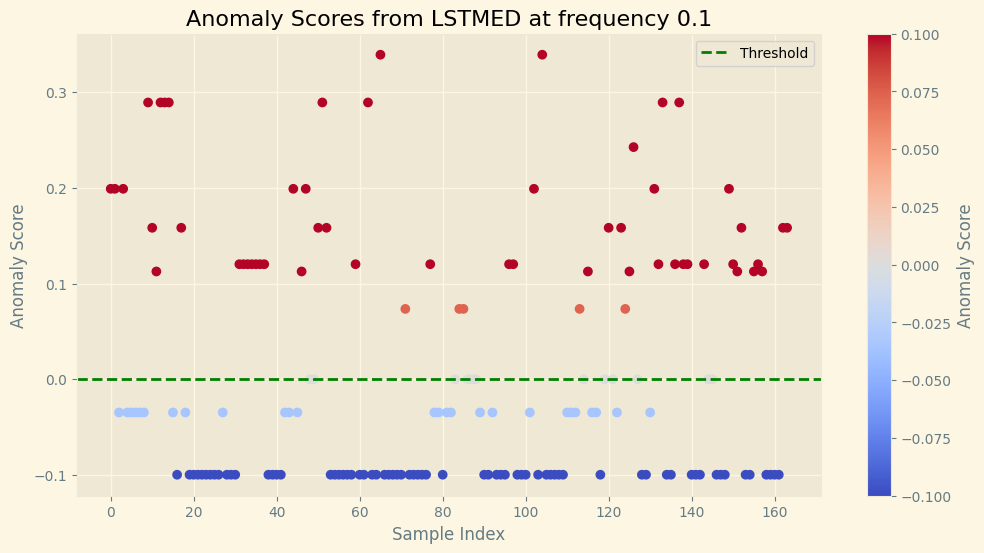

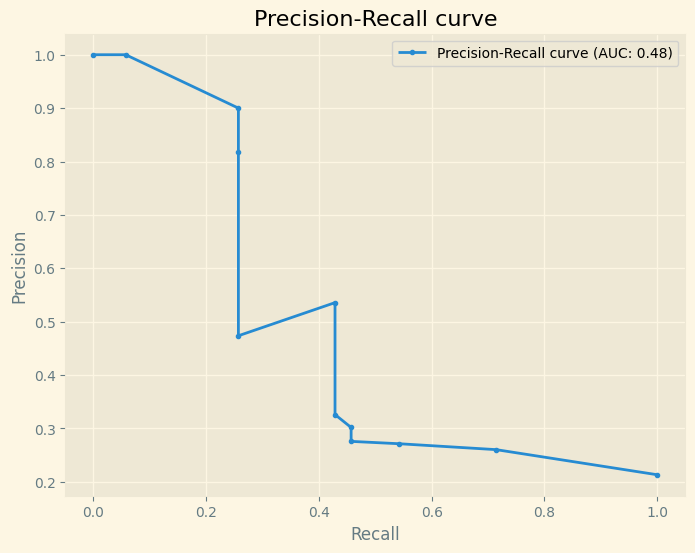

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=1)
2
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
7
IsolationForest(contamination=0.05, n_estimators=1)
11
IsolationForest(contamination=0.1, n_estimators=1)
20
IsolationForest(contamination=0.2, n_estimators=1)
21
F1 Score: 0.3214
Accuracy: 0.7683
Precision: 0.4286
Recall: 0.2571
              precision    recall  f1-score   support

           0       0.82      0.91      0.86       129
           1       0.43      0.26      0.32        35

    accuracy                           0.77       164
   macro avg       0.62      0.58      0.59       164
weighted avg       0.74      0.77      0.75       164



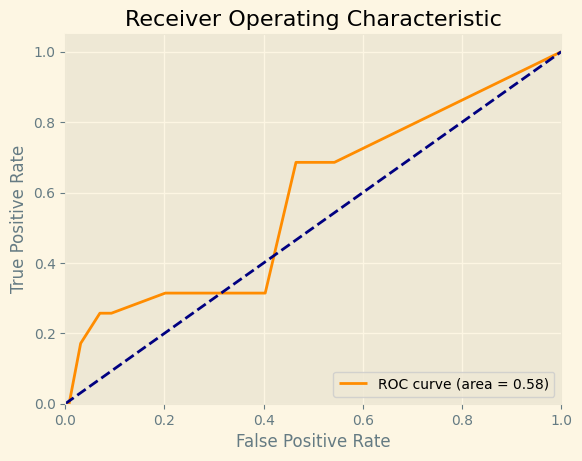

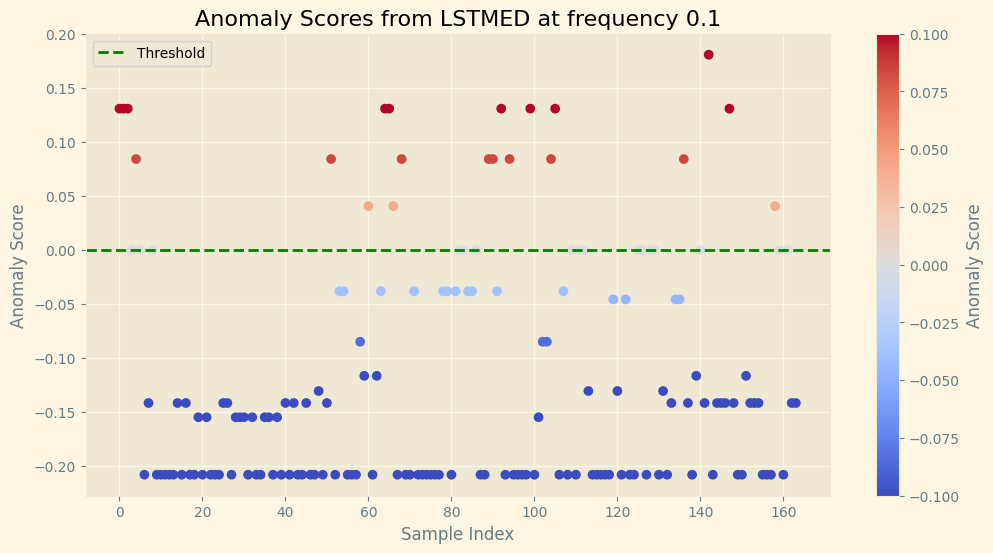

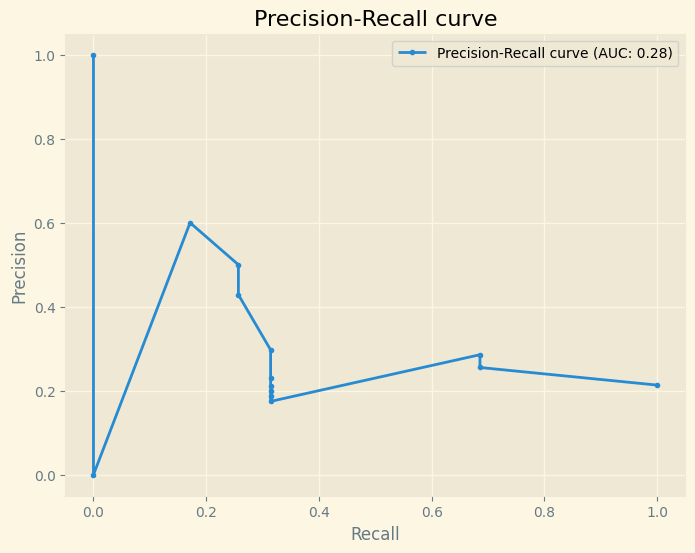

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=1)
46
F1 Score: 0.4938
Accuracy: 0.7500
Precision: 0.4348
Recall: 0.5714
              precision    recall  f1-score   support

           0       0.87      0.80      0.83       129
           1       0.43      0.57      0.49        35

    accuracy                           0.75       164
   macro avg       0.65      0.68      0.66       164
weighted avg       0.78      0.75      0.76       164



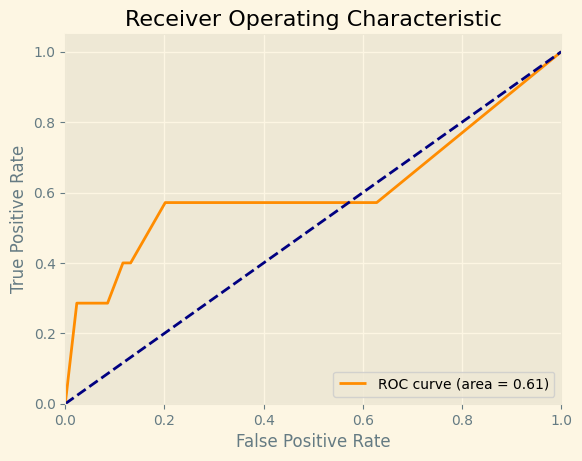

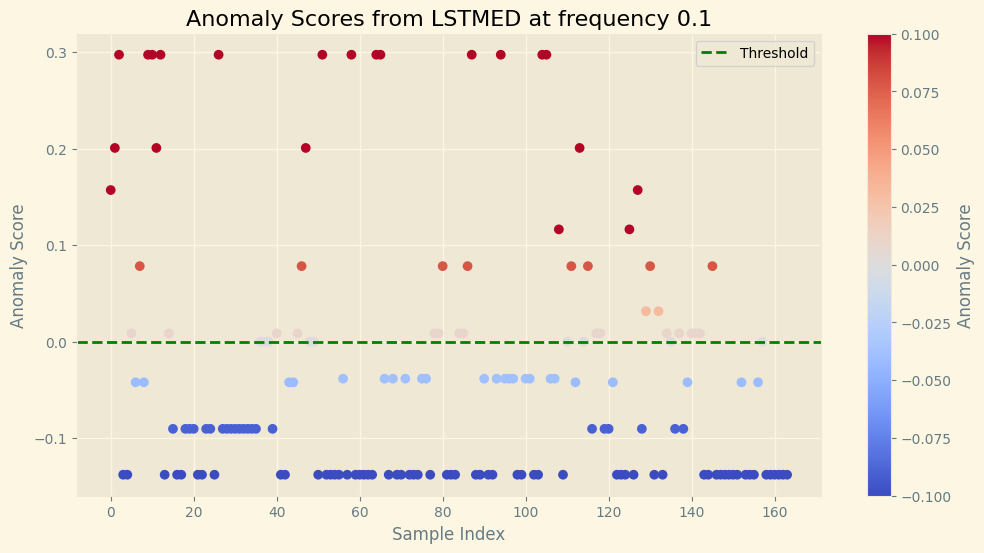

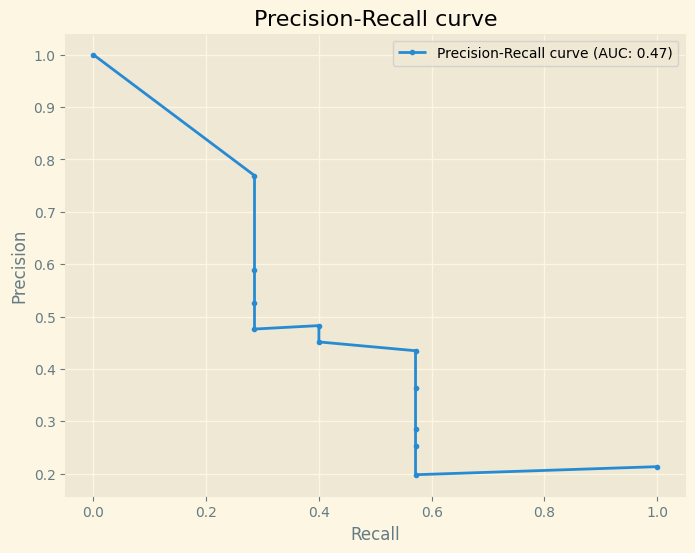

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=1)
61
IsolationForest(contamination=0.5, n_estimators=1)
94
IsolationForest(contamination=0.03, n_estimators=1)
15
IsolationForest(contamination=0.0475, n_estimators=1)
6
IsolationForest(contamination=0.065, n_estimators=1)
12
IsolationForest(contamination=0.0825, n_estimators=1)
10
IsolationForest(contamination=0.1, n_estimators=1)
29
F1 Score: 0.4688
Accuracy: 0.7927
Precision: 0.5172
Recall: 0.4286
              precision    recall  f1-score   support

           0       0.85      0.89      0.87       129
           1       0.52      0.43      0.47        35

    accuracy                           0.79       164
   macro avg       0.68      0.66      0.67       164
weighted avg       0.78      0.79      0.79       164



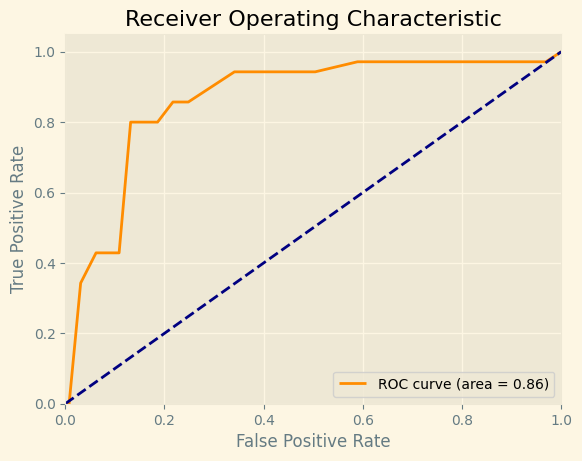

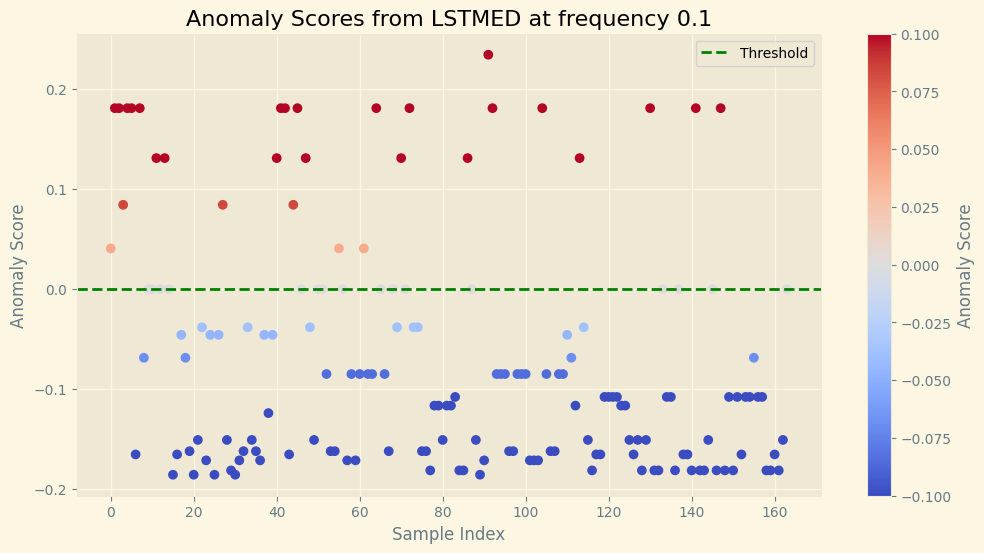

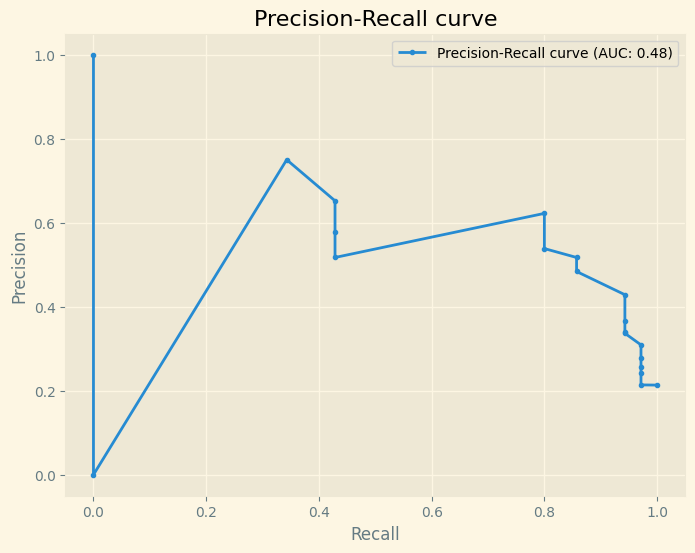

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=2)
71
IsolationForest(contamination=0.005, n_estimators=2)
1
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
21
F1 Score: 0.6786
Accuracy: 0.8902
Precision: 0.9048
Recall: 0.5429
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       129
           1       0.90      0.54      0.68        35

    accuracy                           0.89       164
   macro avg       0.90      0.76      0.81       164
weighted avg       0.89      0.89      0.88       164



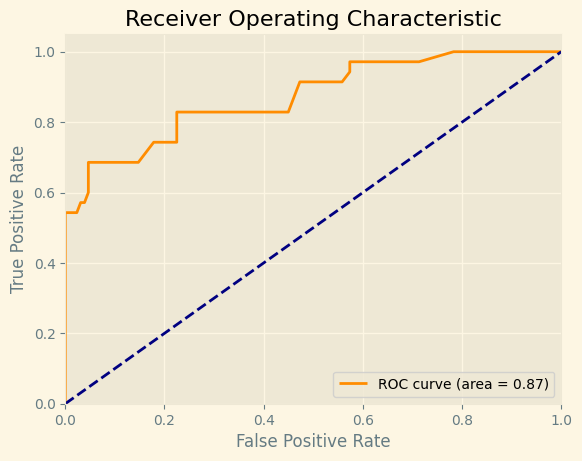

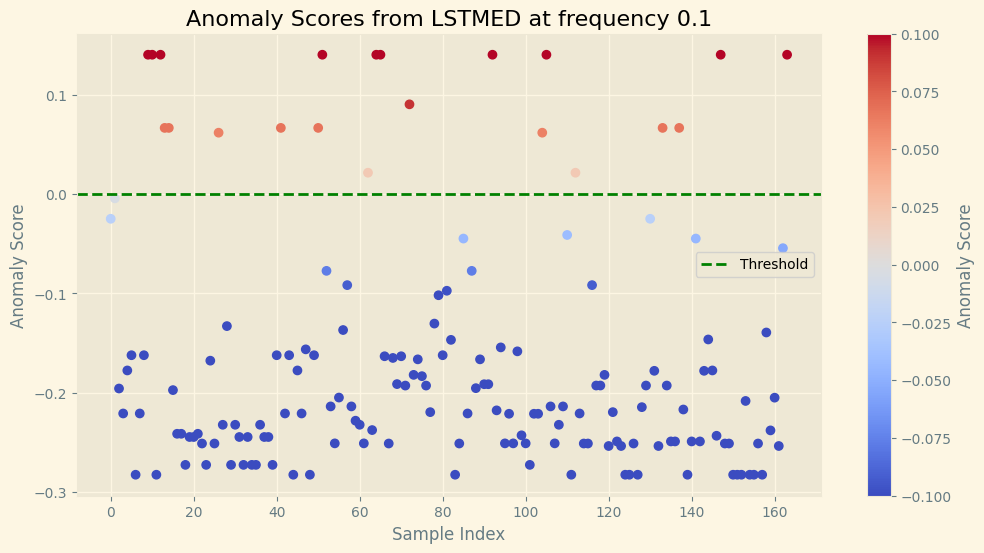

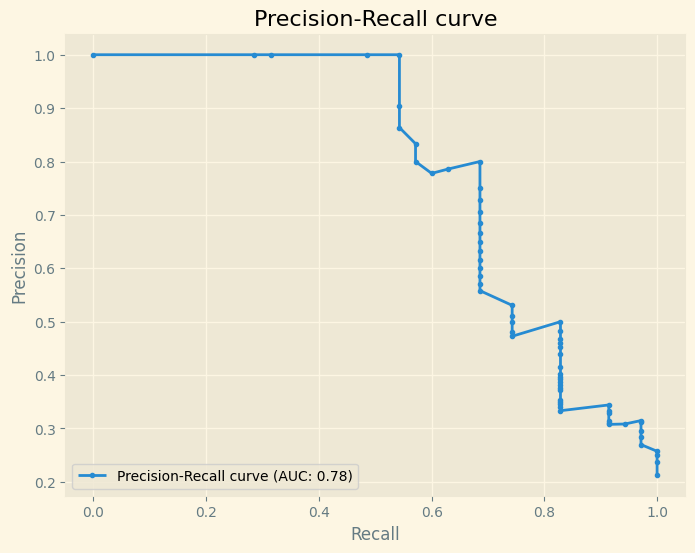

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.05, n_estimators=2)
7
IsolationForest(contamination=0.1, n_estimators=2)
23
F1 Score: 0.4138
Accuracy: 0.7927
Precision: 0.5217
Recall: 0.3429
              precision    recall  f1-score   support

           0       0.84      0.91      0.87       129
           1       0.52      0.34      0.41        35

    accuracy                           0.79       164
   macro avg       0.68      0.63      0.64       164
weighted avg       0.77      0.79      0.78       164



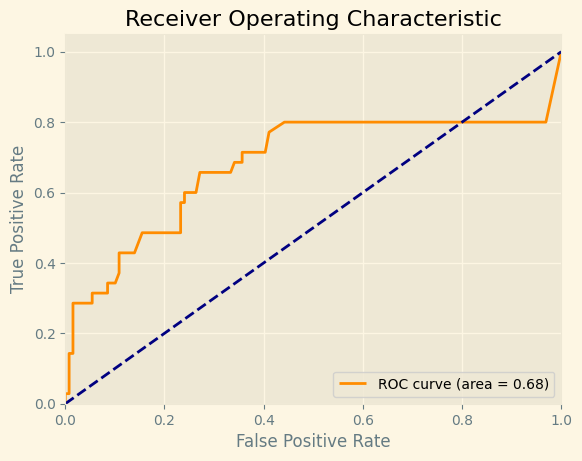

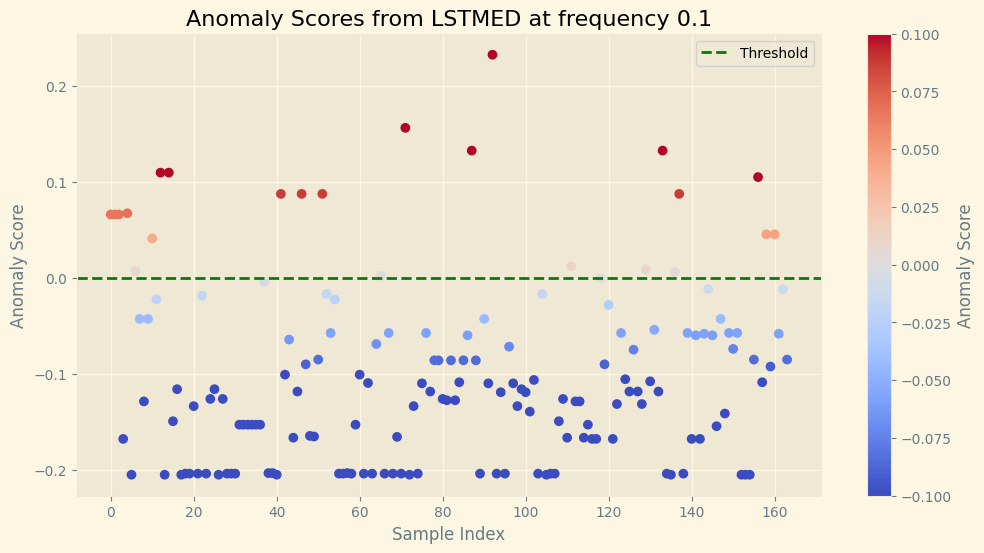

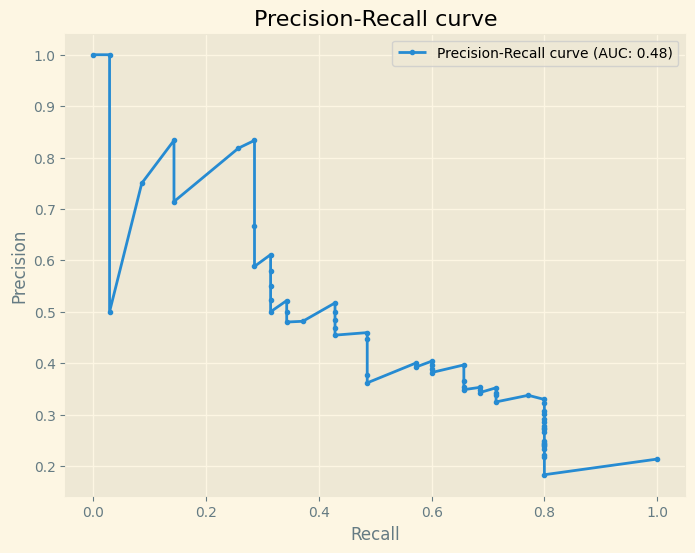

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=2)
32
F1 Score: 0.4776
Accuracy: 0.7866
Precision: 0.5000
Recall: 0.4571
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       129
           1       0.50      0.46      0.48        35

    accuracy                           0.79       164
   macro avg       0.68      0.67      0.67       164
weighted avg       0.78      0.79      0.78       164



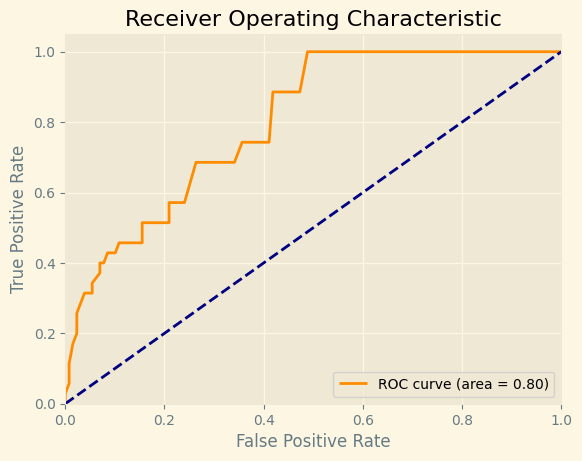

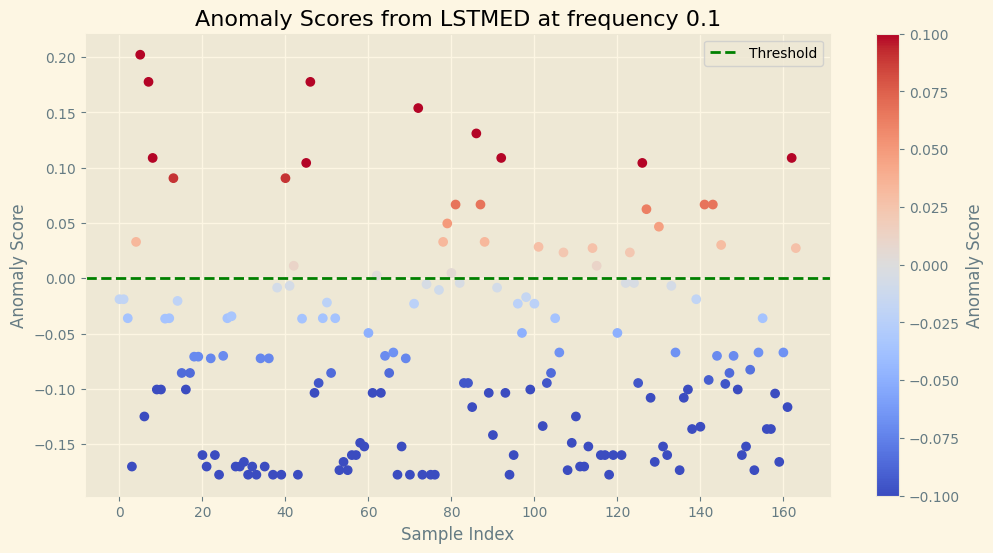

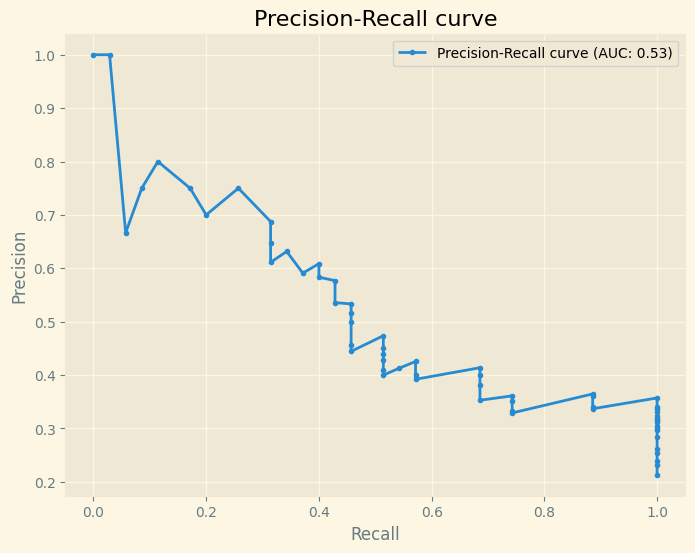

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=2)
53
F1 Score: 0.4318
Accuracy: 0.6951
Precision: 0.3585
Recall: 0.5429
              precision    recall  f1-score   support

           0       0.86      0.74      0.79       129
           1       0.36      0.54      0.43        35

    accuracy                           0.70       164
   macro avg       0.61      0.64      0.61       164
weighted avg       0.75      0.70      0.71       164



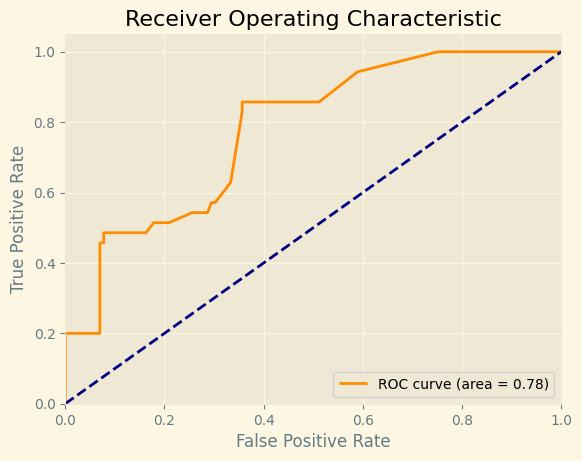

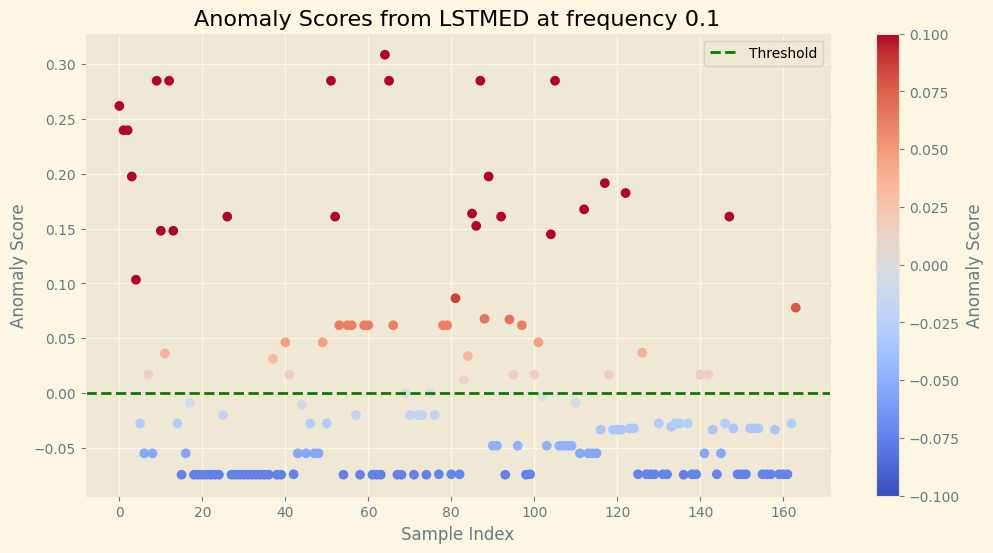

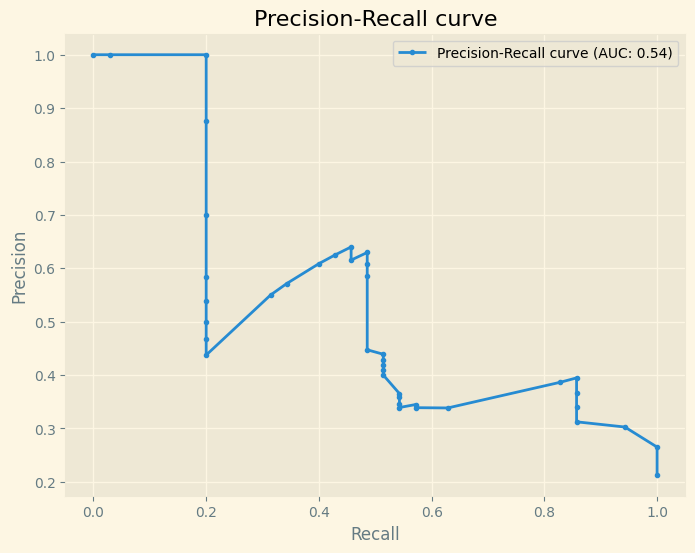

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=2)
80
IsolationForest(contamination=0.5, n_estimators=2)
93
IsolationForest(contamination=0.03, n_estimators=2)
8
IsolationForest(contamination=0.0475, n_estimators=2)
31
F1 Score: 0.8182
Accuracy: 0.9268
Precision: 0.8710
Recall: 0.7714
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       129
           1       0.87      0.77      0.82        35

    accuracy                           0.93       164
   macro avg       0.91      0.87      0.89       164
weighted avg       0.93      0.93      0.93       164



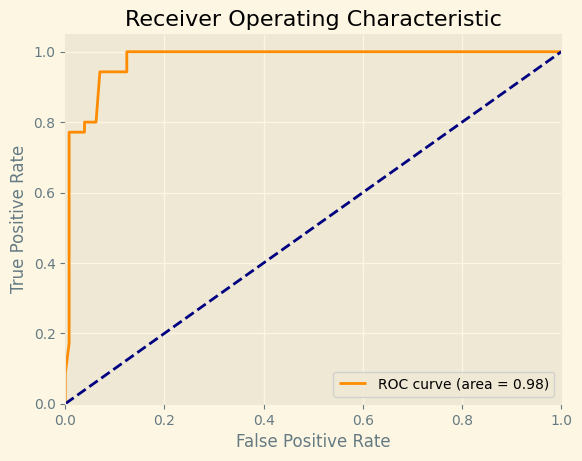

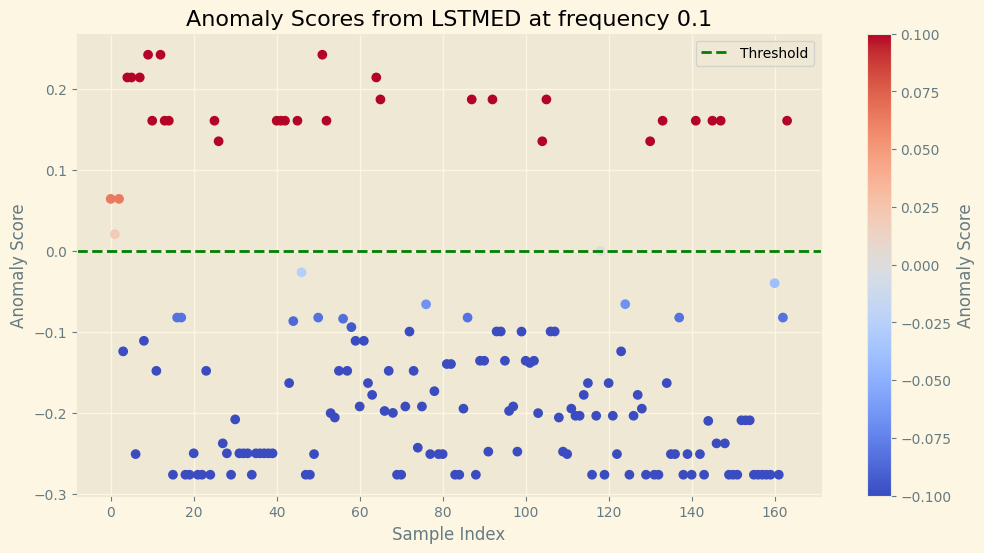

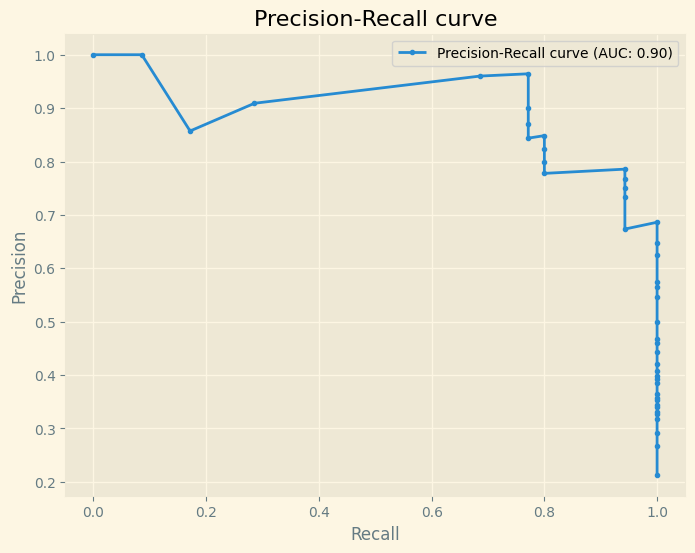

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=2)
15
IsolationForest(contamination=0.0825, n_estimators=2)
23
F1 Score: 0.3448
Accuracy: 0.7683
Precision: 0.4348
Recall: 0.2857
              precision    recall  f1-score   support

           0       0.82      0.90      0.86       129
           1       0.43      0.29      0.34        35

    accuracy                           0.77       164
   macro avg       0.63      0.59      0.60       164
weighted avg       0.74      0.77      0.75       164



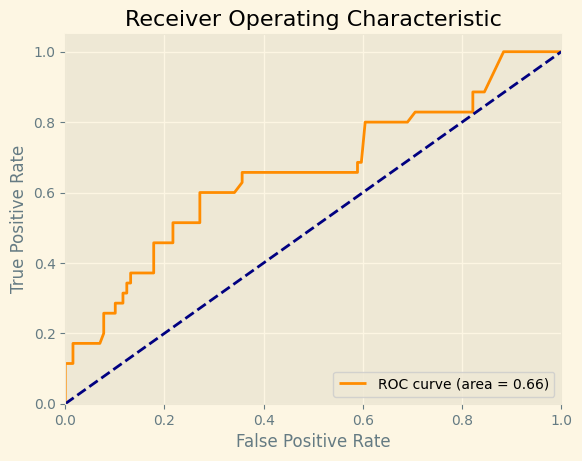

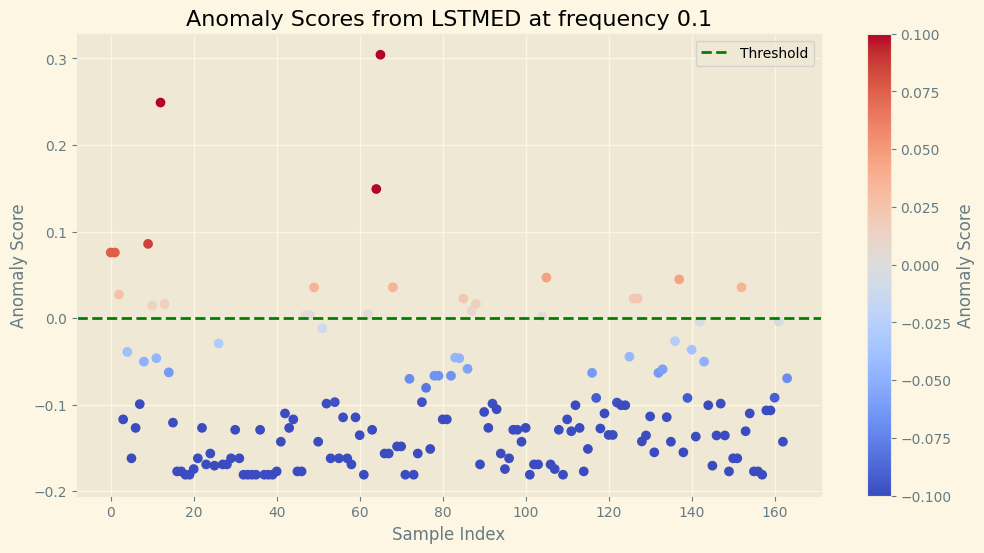

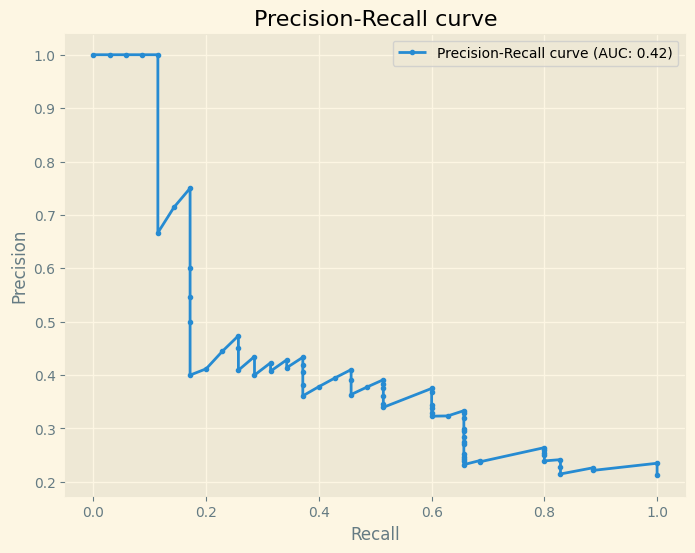

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=2)
20
IsolationForest(contamination=0.3431372549019608, n_estimators=3)
66
IsolationForest(contamination=0.005, n_estimators=3)
3
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.03, n_estimators=3)
4
IsolationForest(contamination=0.05, n_estimators=3)
13
IsolationForest(contamination=0.1, n_estimators=3)
27
F1 Score: 0.5161
Accuracy: 0.8171
Precision: 0.5926
Recall: 0.4571
              precision    recall  f1-score   support

           0       0.86      0.91      0.89       129
           1       0.59      0.46      0.52        35

    accuracy                           0.82       164
   macro avg       0.73      0.69      0.70       164
weighted avg       0.80      0.82      0.81       164



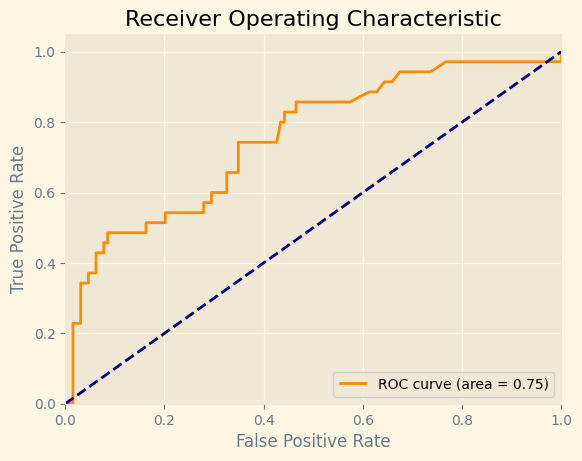

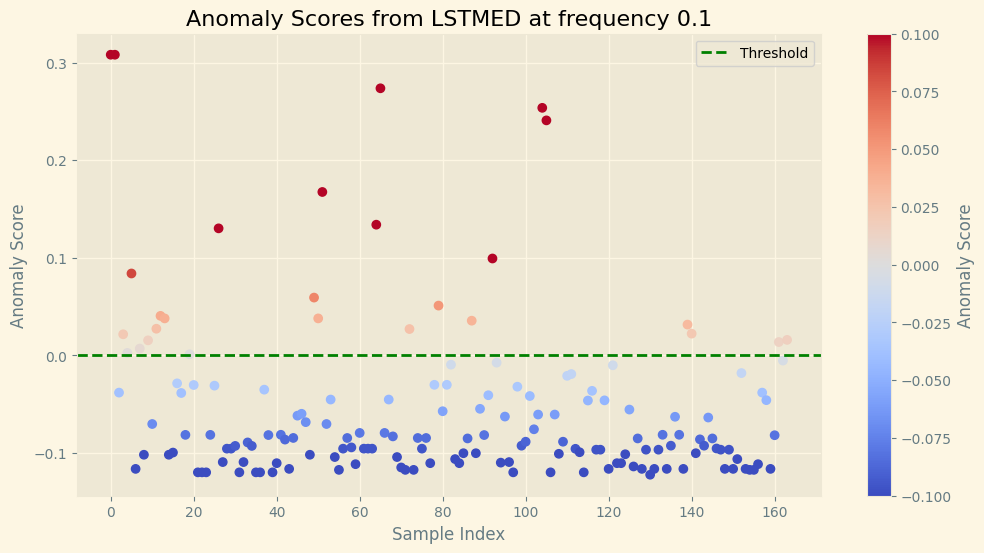

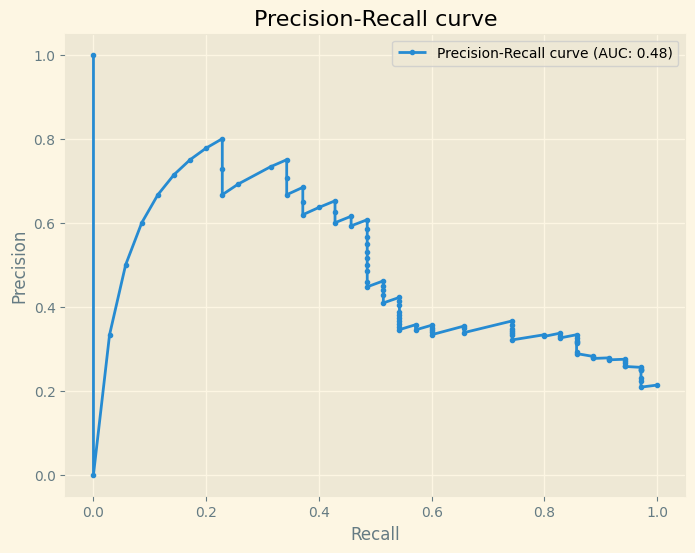

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
23
F1 Score: 0.3448
Accuracy: 0.7683
Precision: 0.4348
Recall: 0.2857
              precision    recall  f1-score   support

           0       0.82      0.90      0.86       129
           1       0.43      0.29      0.34        35

    accuracy                           0.77       164
   macro avg       0.63      0.59      0.60       164
weighted avg       0.74      0.77      0.75       164



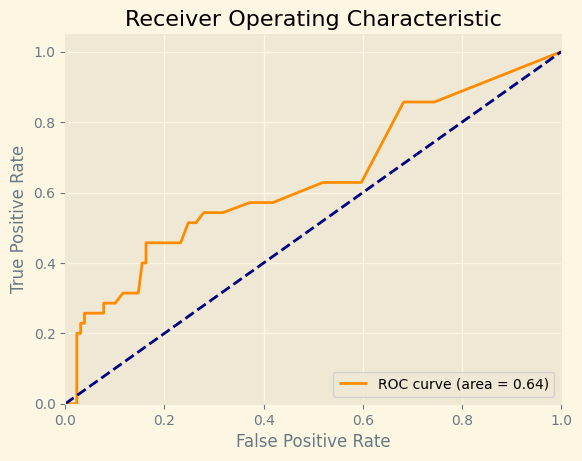

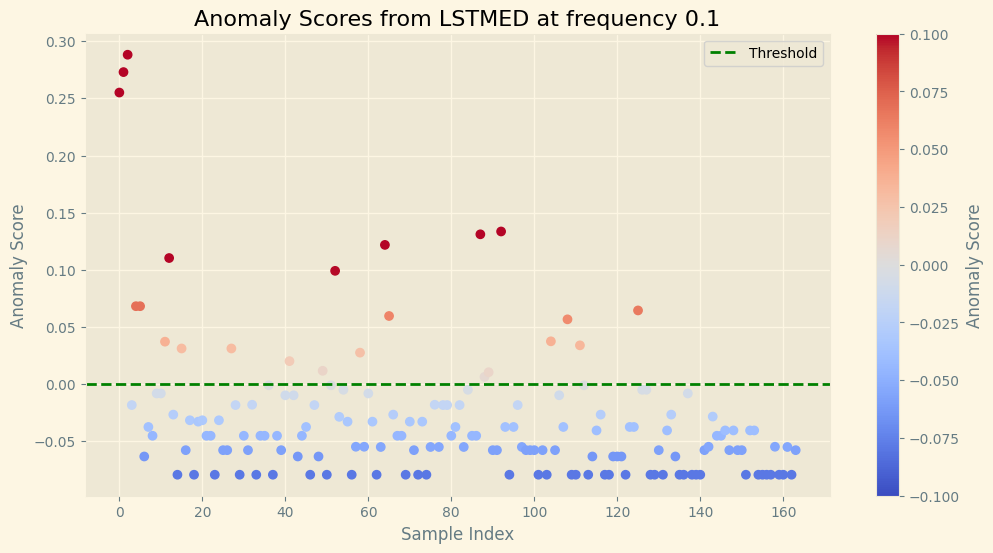

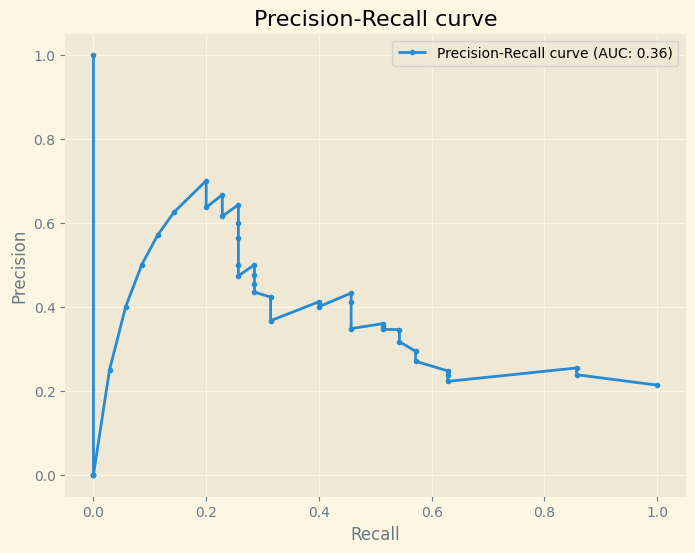

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=3)
48
F1 Score: 0.4337
Accuracy: 0.7134
Precision: 0.3750
Recall: 0.5143
              precision    recall  f1-score   support

           0       0.85      0.77      0.81       129
           1       0.38      0.51      0.43        35

    accuracy                           0.71       164
   macro avg       0.61      0.64      0.62       164
weighted avg       0.75      0.71      0.73       164



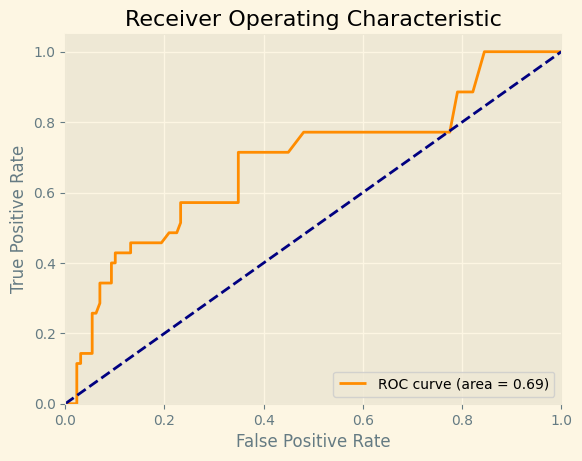

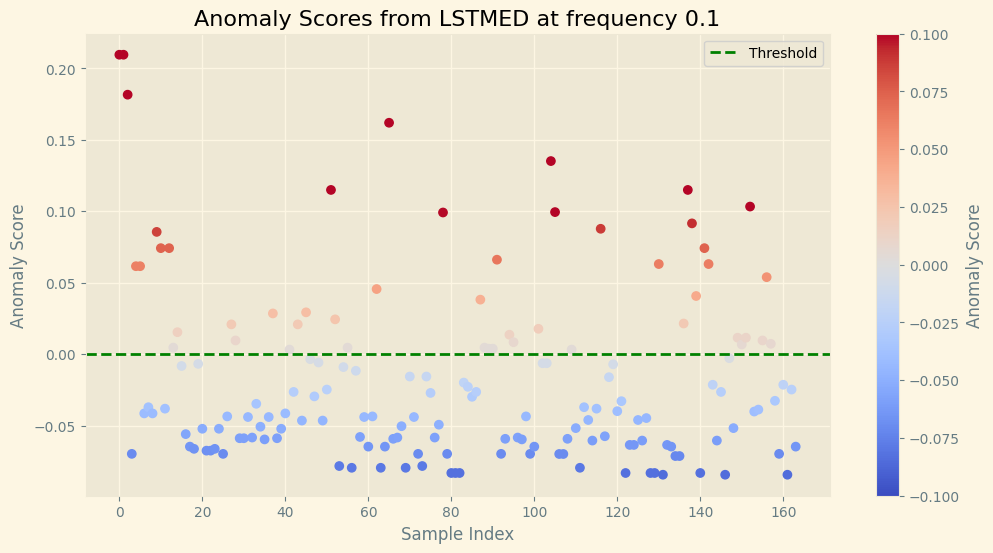

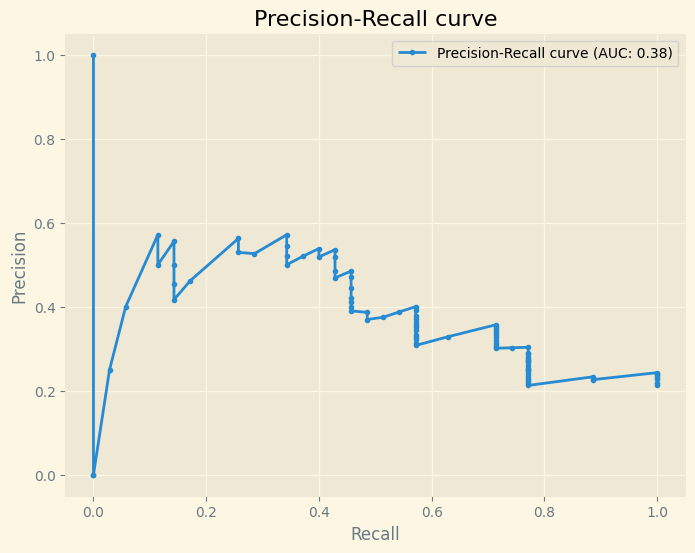

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=3)
77
IsolationForest(contamination=0.5, n_estimators=3)
86
IsolationForest(contamination=0.03, n_estimators=3)
6
IsolationForest(contamination=0.0475, n_estimators=3)
9
IsolationForest(contamination=0.065, n_estimators=3)
19
IsolationForest(contamination=0.0825, n_estimators=3)
31
F1 Score: 0.7273
Accuracy: 0.8902
Precision: 0.7742
Recall: 0.6857
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       129
           1       0.77      0.69      0.73        35

    accuracy                           0.89       164
   macro avg       0.85      0.82      0.83       164
weighted avg       0.89      0.89      0.89       164



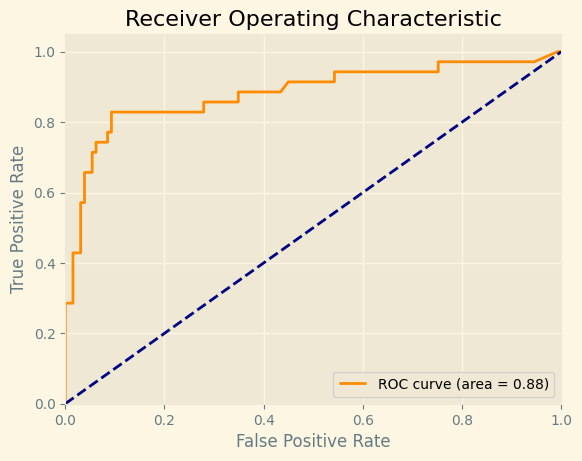

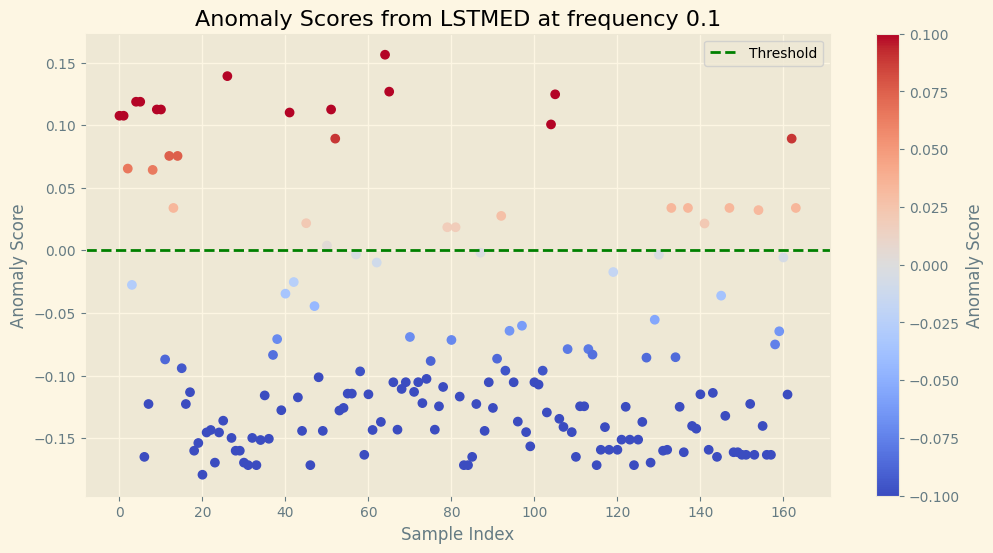

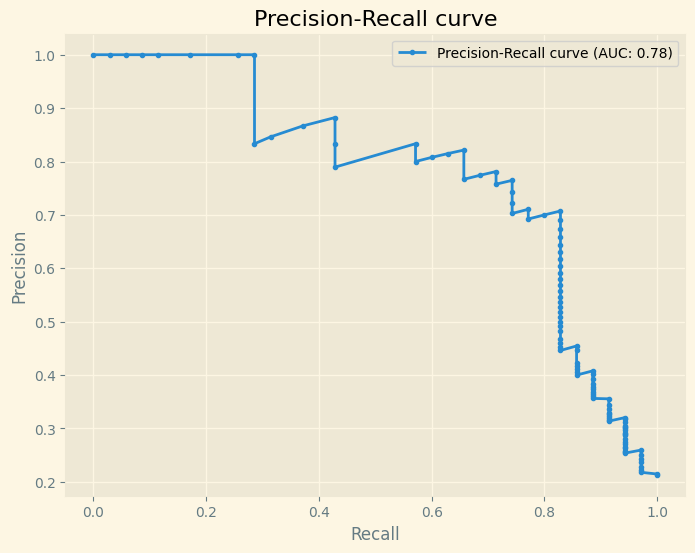

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=3)
14
IsolationForest(contamination=0.3431372549019608, n_estimators=5)
58
F1 Score: 0.3871
Accuracy: 0.6524
Precision: 0.3103
Recall: 0.5143
              precision    recall  f1-score   support

           0       0.84      0.69      0.76       129
           1       0.31      0.51      0.39        35

    accuracy                           0.65       164
   macro avg       0.57      0.60      0.57       164
weighted avg       0.73      0.65      0.68       164



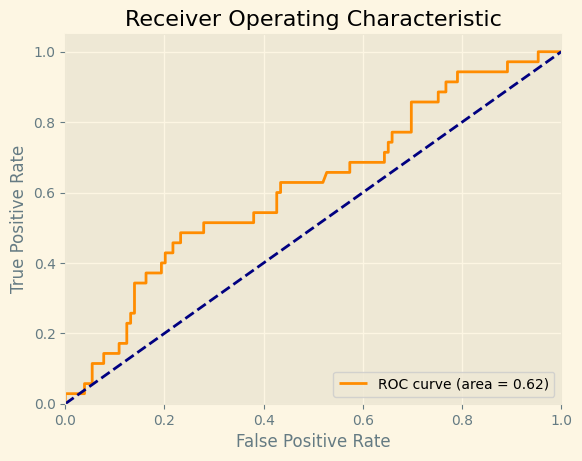

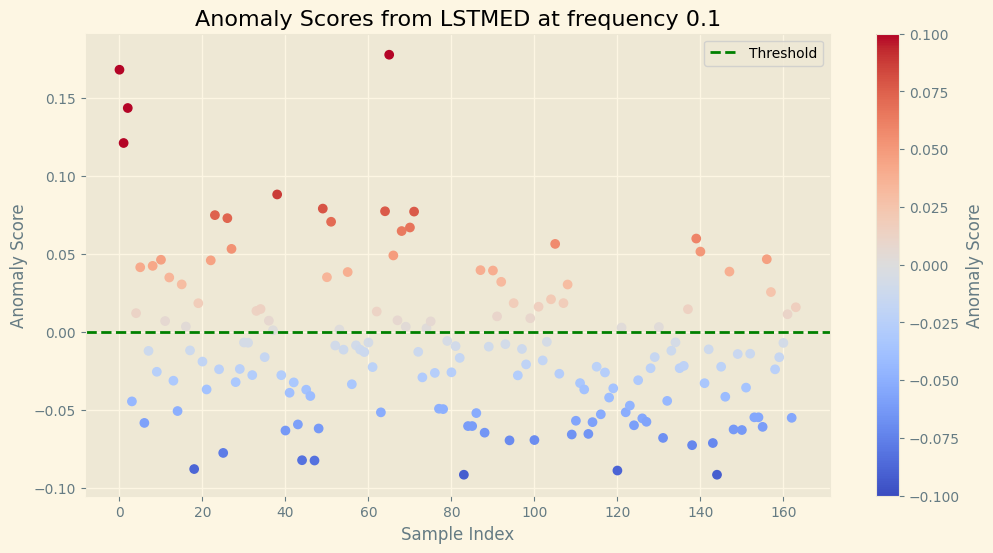

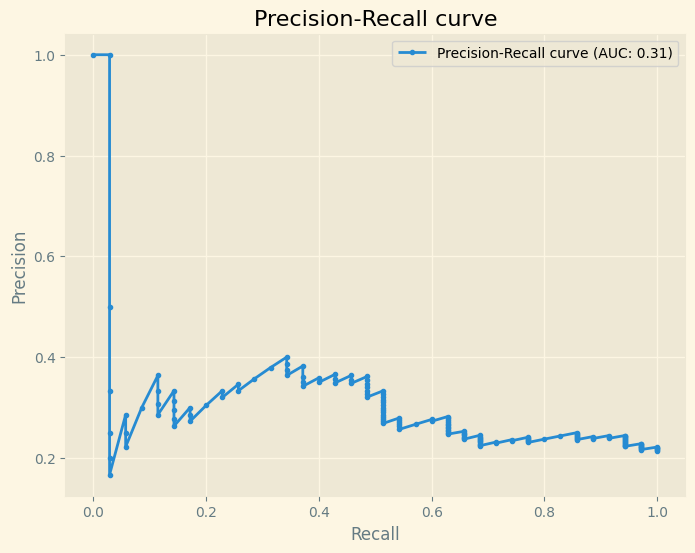

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=5)
6
IsolationForest(contamination=0.001, n_estimators=5)
3
IsolationForest(contamination=0.001, n_estimators=5)
1
IsolationForest(contamination=0.03, n_estimators=5)
8
IsolationForest(contamination=0.05, n_estimators=5)
13
IsolationForest(contamination=0.1, n_estimators=5)
19
IsolationForest(contamination=0.2, n_estimators=5)
41
F1 Score: 0.5789
Accuracy: 0.8049
Precision: 0.5366
Recall: 0.6286
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       129
           1       0.54      0.63      0.58        35

    accuracy                           0.80       164
   macro avg       0.72      0.74      0.73       164
weighted avg       0.82      0.80      0.81       164



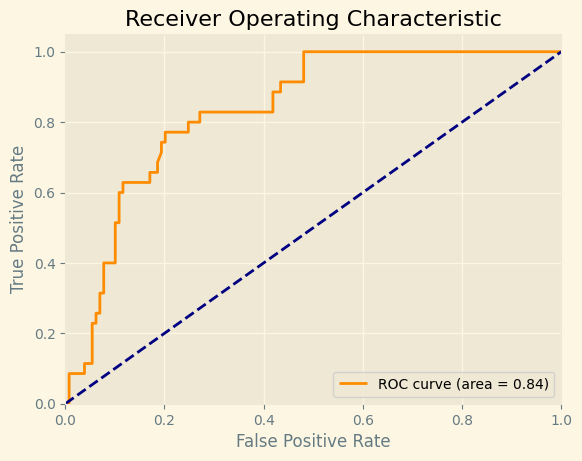

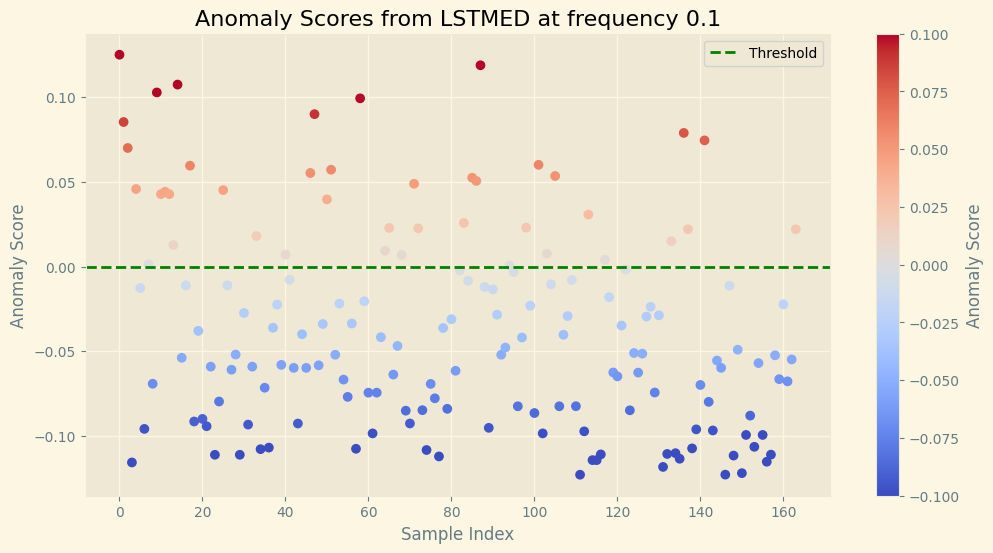

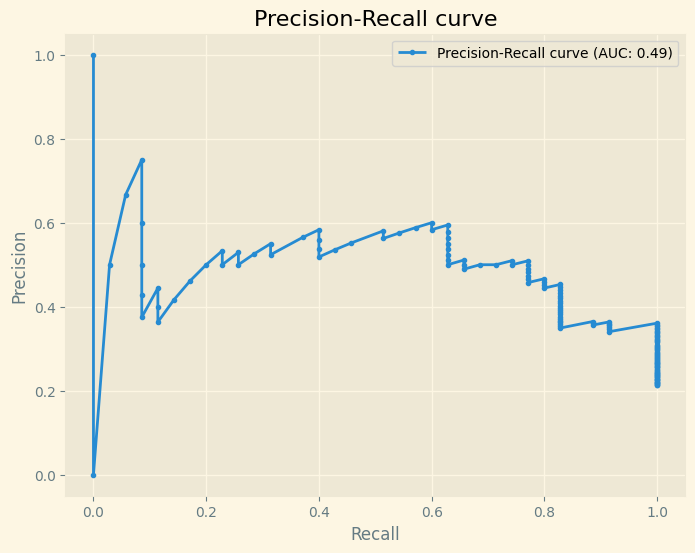

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=5)
66
IsolationForest(contamination=0.4, n_estimators=5)
89
IsolationForest(contamination=0.5, n_estimators=5)
91
IsolationForest(contamination=0.03, n_estimators=5)
5
IsolationForest(contamination=0.0475, n_estimators=5)
32
F1 Score: 0.8060
Accuracy: 0.9207
Precision: 0.8438
Recall: 0.7714
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       129
           1       0.84      0.77      0.81        35

    accuracy                           0.92       164
   macro avg       0.89      0.87      0.88       164
weighted avg       0.92      0.92      0.92       164



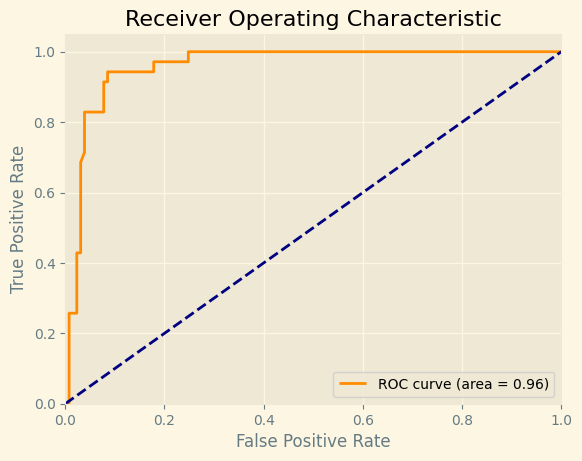

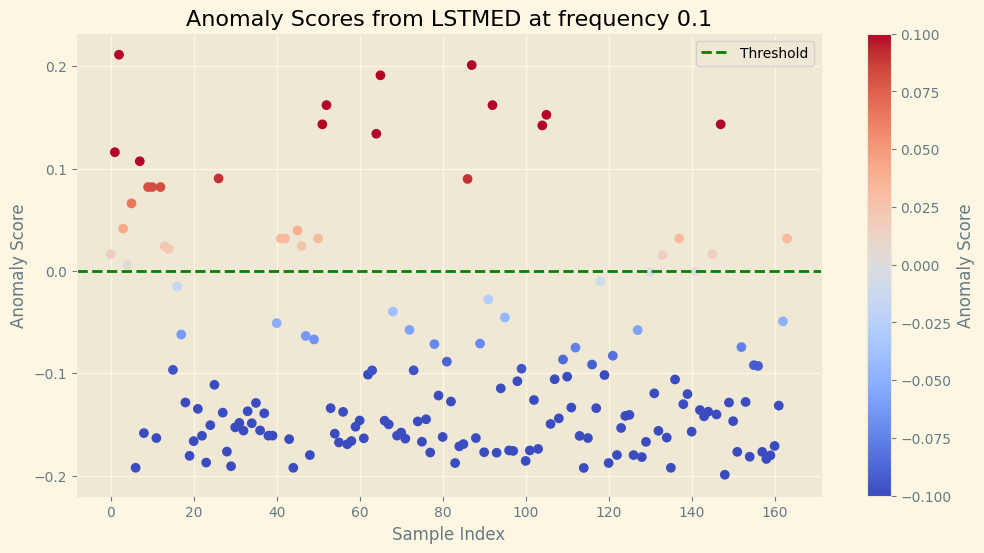

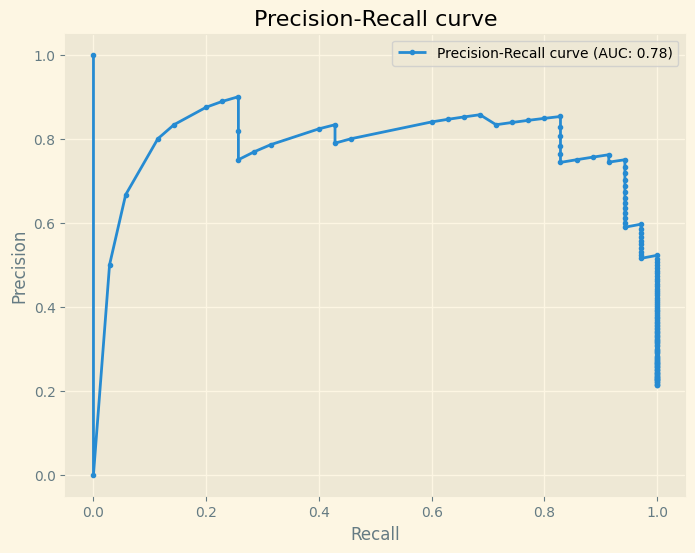

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=5)
10
IsolationForest(contamination=0.0825, n_estimators=5)
17
IsolationForest(contamination=0.1, n_estimators=5)
12
IsolationForest(contamination=0.3431372549019608, n_estimators=10)
70
IsolationForest(contamination=0.005, n_estimators=10)
0
IsolationForest(contamination=0.001, n_estimators=10)
1
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
5
IsolationForest(contamination=0.05, n_estimators=10)
19
IsolationForest(contamination=0.1, n_estimators=10)
34
F1 Score: 0.7246
Accuracy: 0.8841
Precision: 0.7353
Recall: 0.7143
              precision    recall  f1-score   support

           0       0.92      0.93      0.93       129
           1       0.74      0.71      0.72        35

    accuracy                           0.88       164
   macro avg       0.83      0.82      0.83      

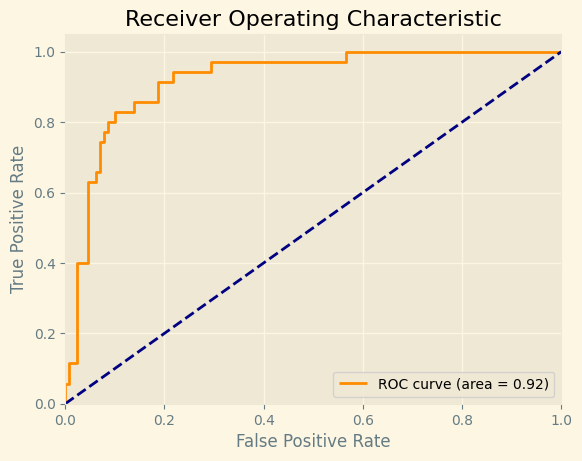

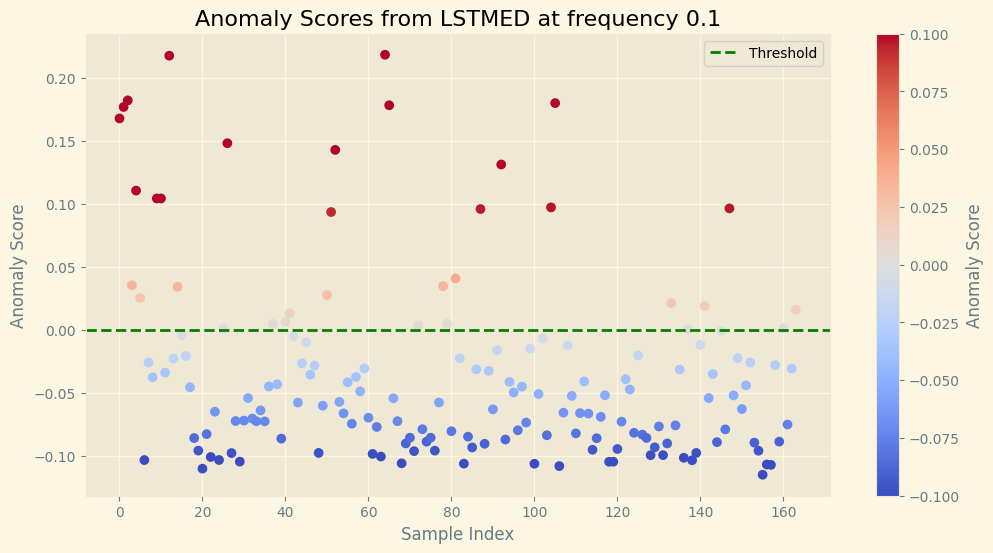

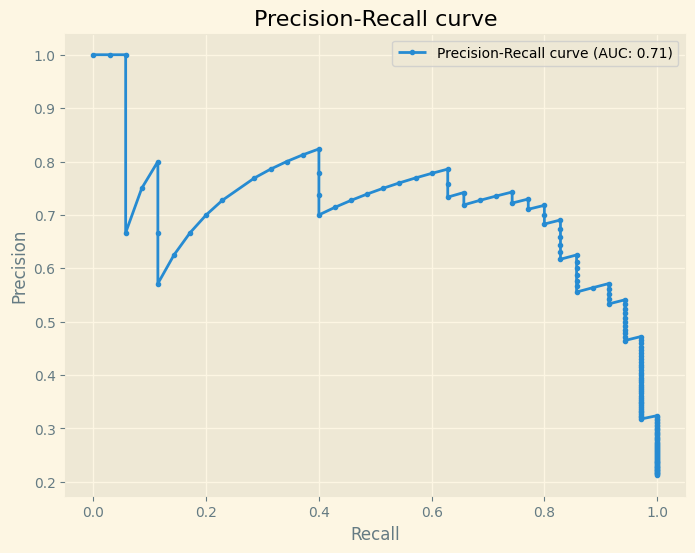

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=10)
50
F1 Score: 0.7059
Accuracy: 0.8476
Precision: 0.6000
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.96      0.84      0.90       129
           1       0.60      0.86      0.71        35

    accuracy                           0.85       164
   macro avg       0.78      0.85      0.80       164
weighted avg       0.88      0.85      0.86       164



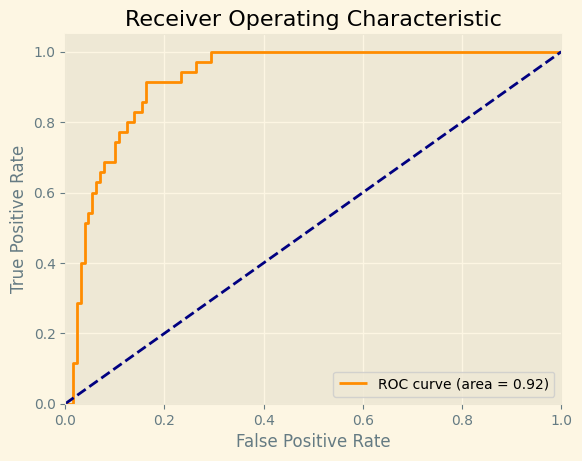

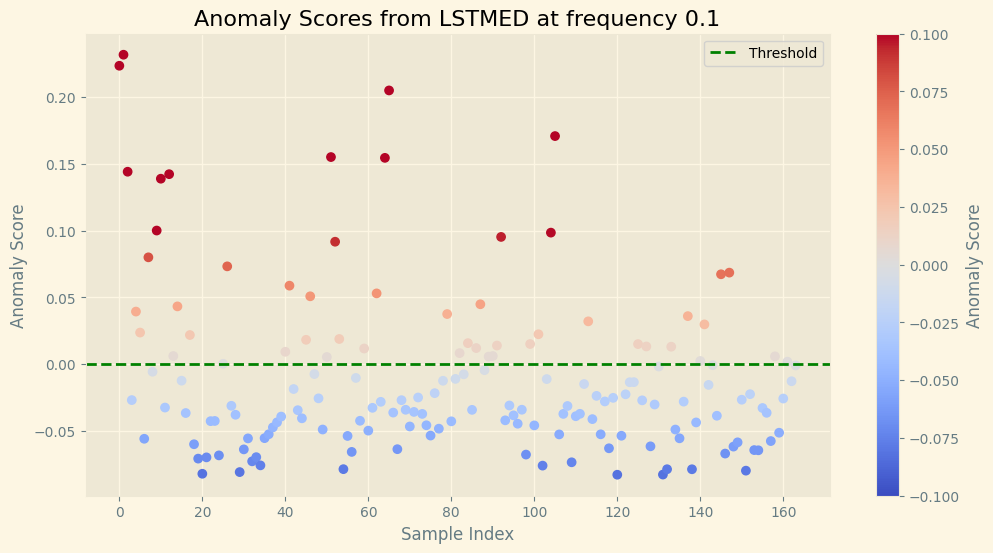

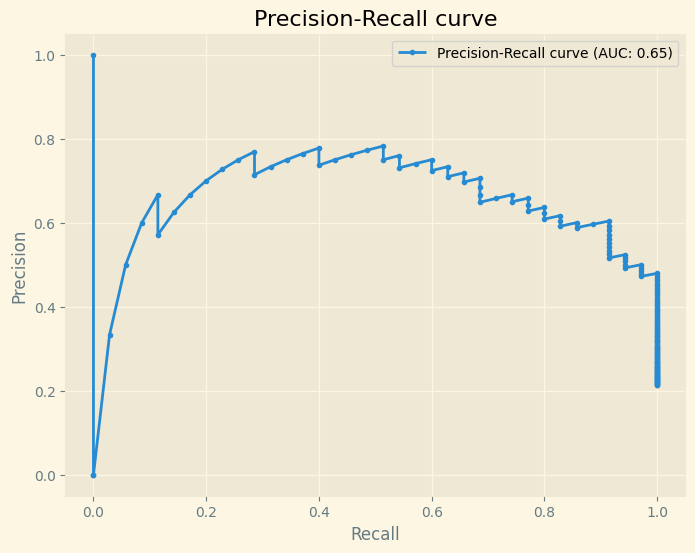

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=10)
68
IsolationForest(contamination=0.4, n_estimators=10)
79
IsolationForest(contamination=0.5, n_estimators=10)
91
IsolationForest(contamination=0.03, n_estimators=10)
6
IsolationForest(contamination=0.0475, n_estimators=10)
16
IsolationForest(contamination=0.065, n_estimators=10)
27
F1 Score: 0.5806
Accuracy: 0.8415
Precision: 0.6667
Recall: 0.5143
              precision    recall  f1-score   support

           0       0.88      0.93      0.90       129
           1       0.67      0.51      0.58        35

    accuracy                           0.84       164
   macro avg       0.77      0.72      0.74       164
weighted avg       0.83      0.84      0.83       164



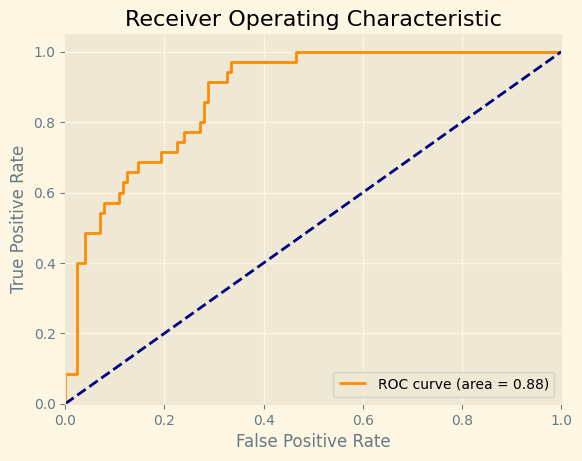

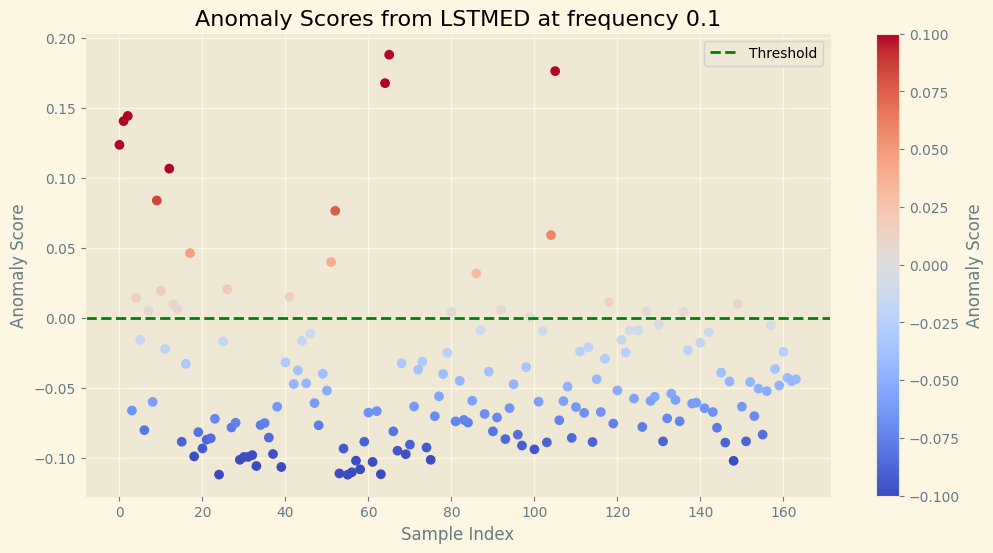

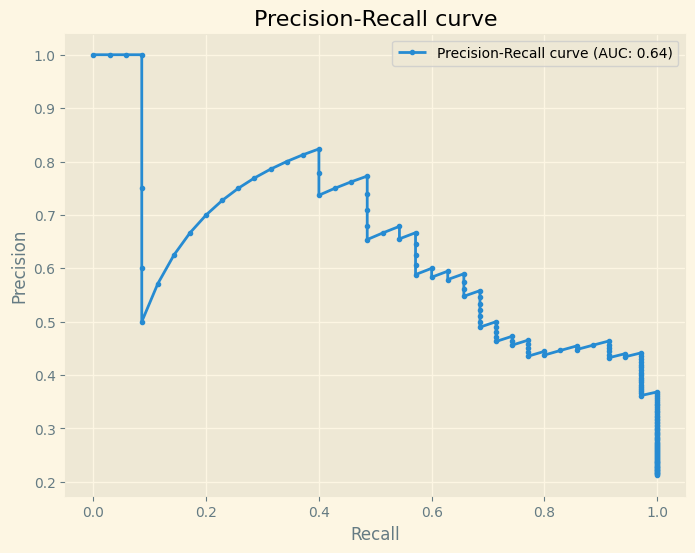

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
40
F1 Score: 0.8533
Accuracy: 0.9329
Precision: 0.8000
Recall: 0.9143
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       129
           1       0.80      0.91      0.85        35

    accuracy                           0.93       164
   macro avg       0.89      0.93      0.90       164
weighted avg       0.94      0.93      0.93       164



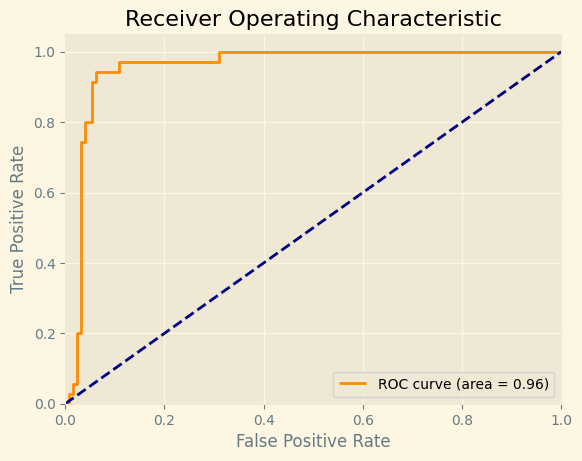

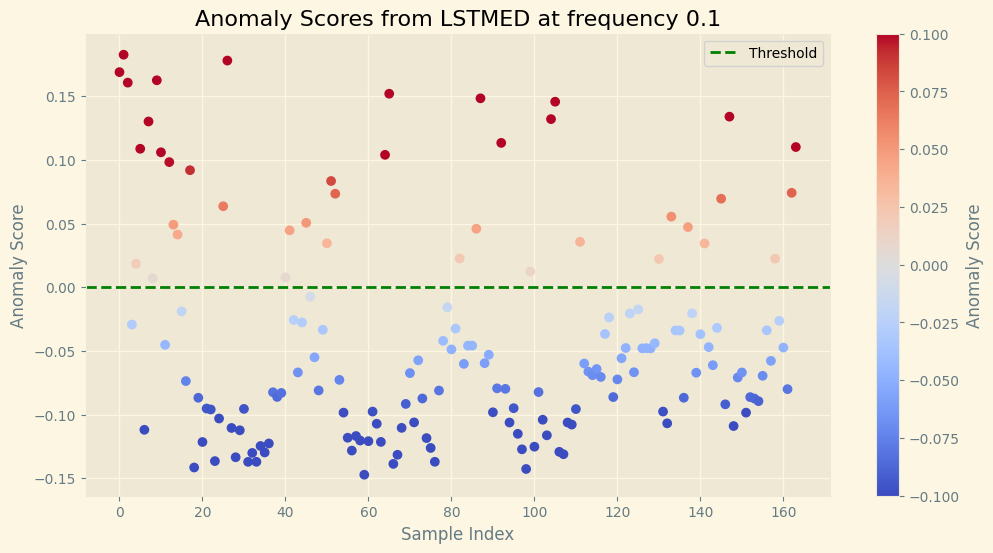

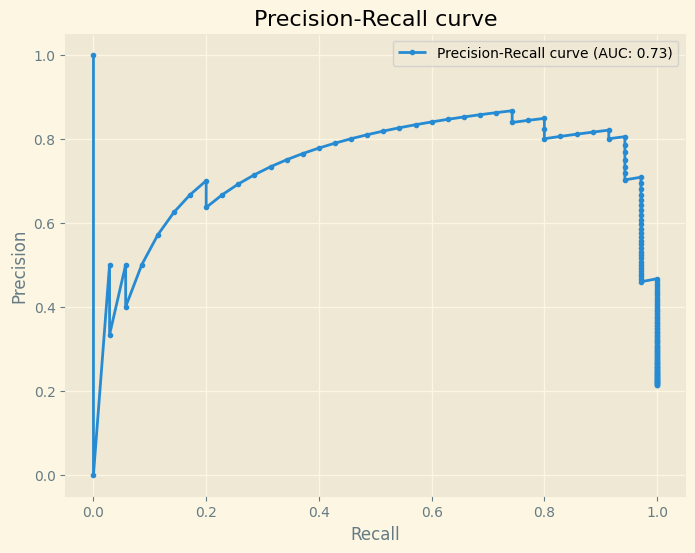

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
30
F1 Score: 0.5538
Accuracy: 0.8232
Precision: 0.6000
Recall: 0.5143
              precision    recall  f1-score   support

           0       0.87      0.91      0.89       129
           1       0.60      0.51      0.55        35

    accuracy                           0.82       164
   macro avg       0.74      0.71      0.72       164
weighted avg       0.81      0.82      0.82       164



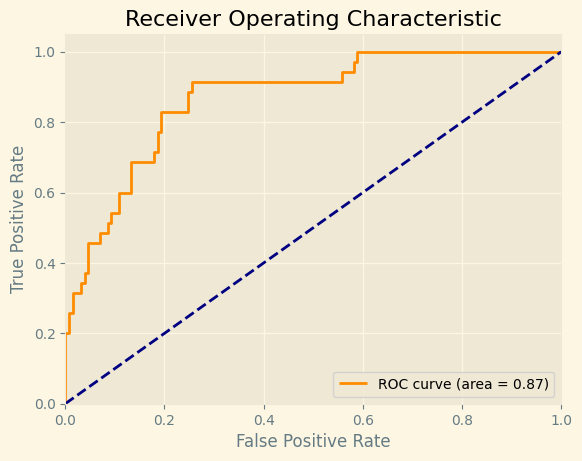

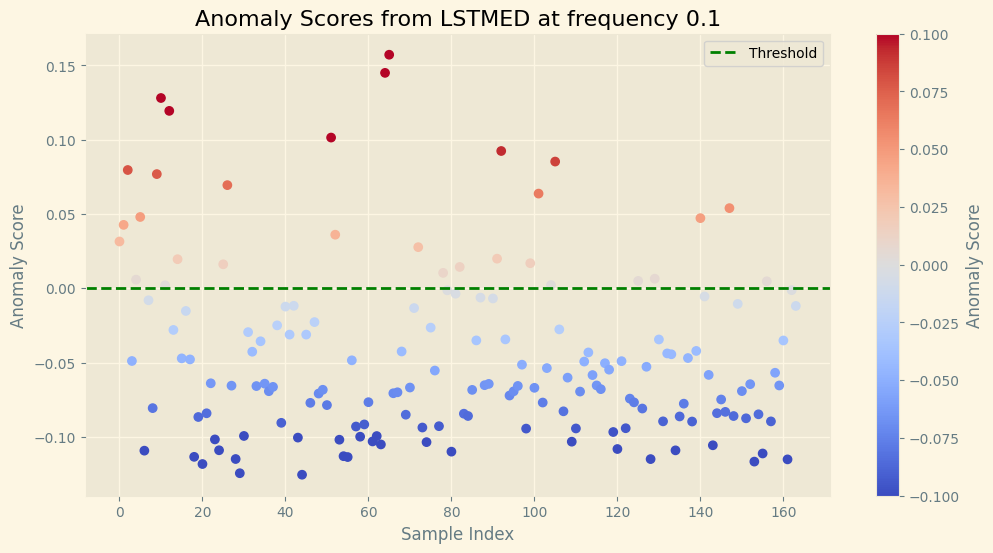

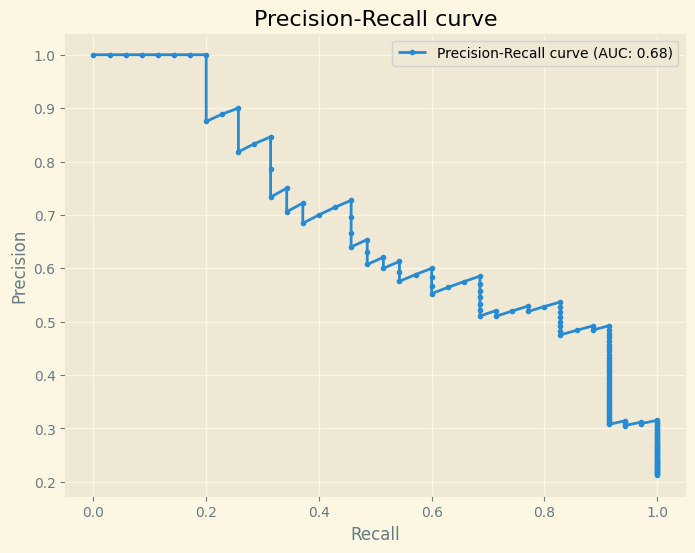

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608)
67
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
8
IsolationForest(contamination=0.05)
30
F1 Score: 0.8000
Accuracy: 0.9207
Precision: 0.8667
Recall: 0.7429
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       129
           1       0.87      0.74      0.80        35

    accuracy                           0.92       164
   macro avg       0.90      0.86      0.88       164
weighted avg       0.92      0.92      0.92       164



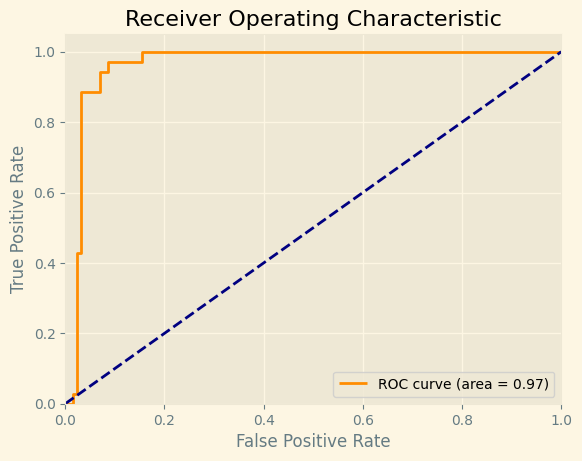

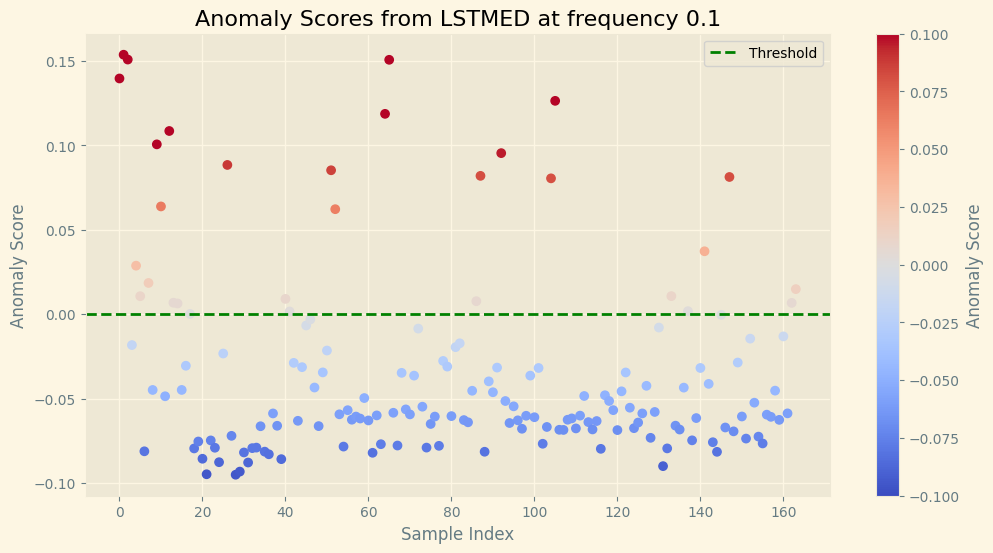

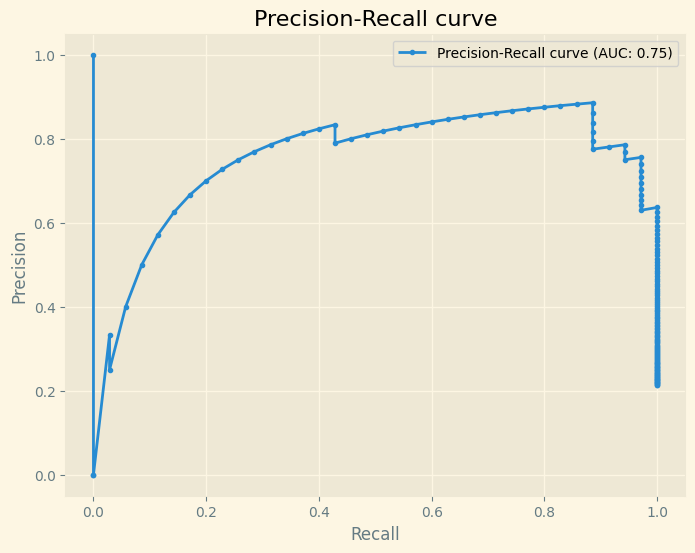

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
40
F1 Score: 0.8800
Accuracy: 0.9451
Precision: 0.8250
Recall: 0.9429
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       129
           1       0.82      0.94      0.88        35

    accuracy                           0.95       164
   macro avg       0.90      0.94      0.92       164
weighted avg       0.95      0.95      0.95       164



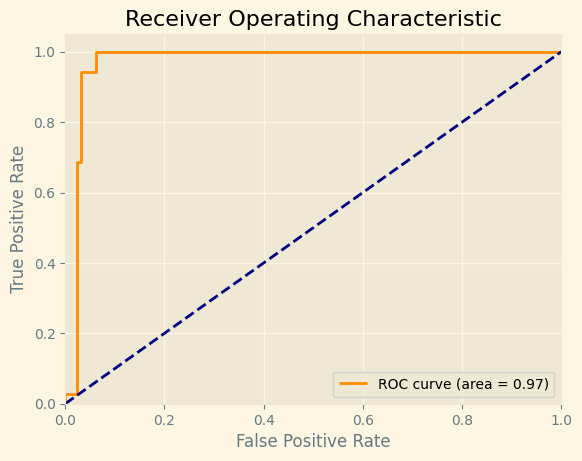

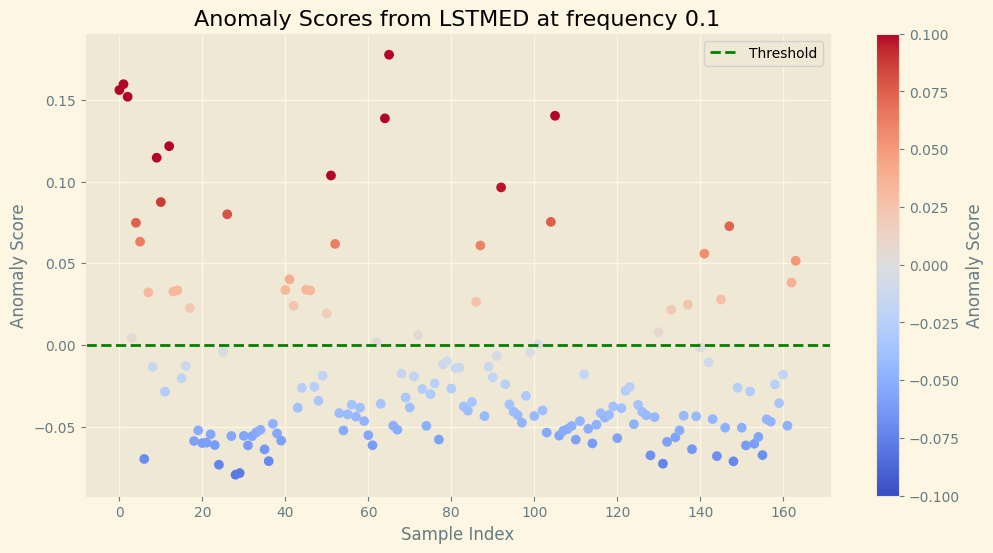

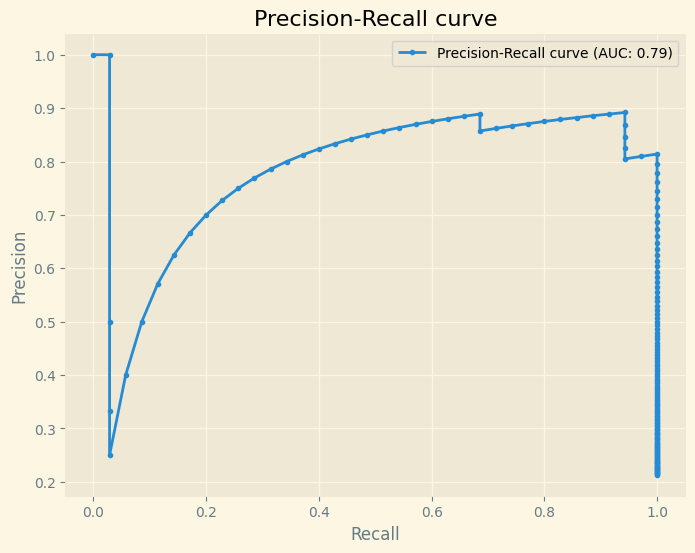

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2)
51
F1 Score: 0.8140
Accuracy: 0.9024
Precision: 0.6863
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.88      0.93       129
           1       0.69      1.00      0.81        35

    accuracy                           0.90       164
   macro avg       0.84      0.94      0.87       164
weighted avg       0.93      0.90      0.91       164



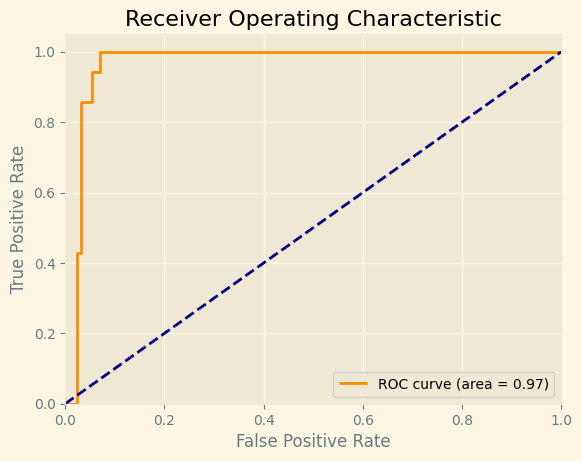

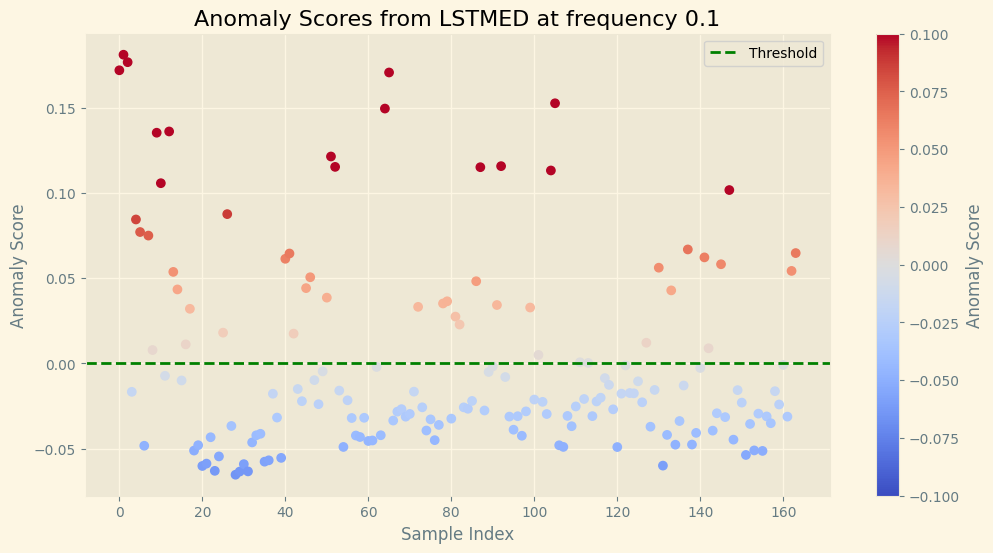

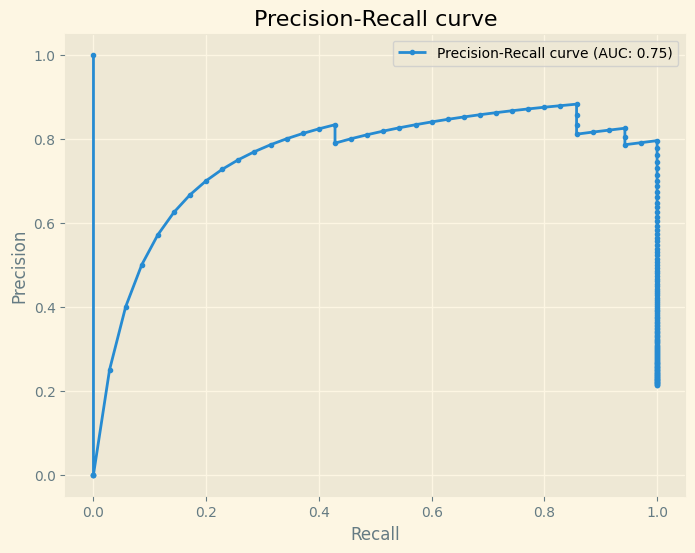

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3)
63
IsolationForest(contamination=0.4)
79
IsolationForest(contamination=0.5)
93
IsolationForest(contamination=0.03)
5
IsolationForest(contamination=0.0475)
26
F1 Score: 0.7541
Accuracy: 0.9085
Precision: 0.8846
Recall: 0.6571
              precision    recall  f1-score   support

           0       0.91      0.98      0.94       129
           1       0.88      0.66      0.75        35

    accuracy                           0.91       164
   macro avg       0.90      0.82      0.85       164
weighted avg       0.91      0.91      0.90       164



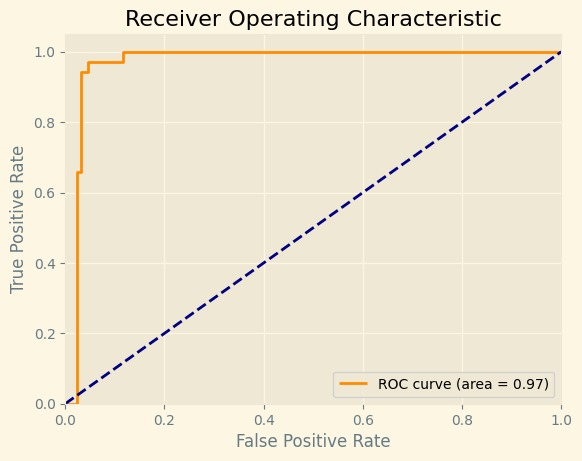

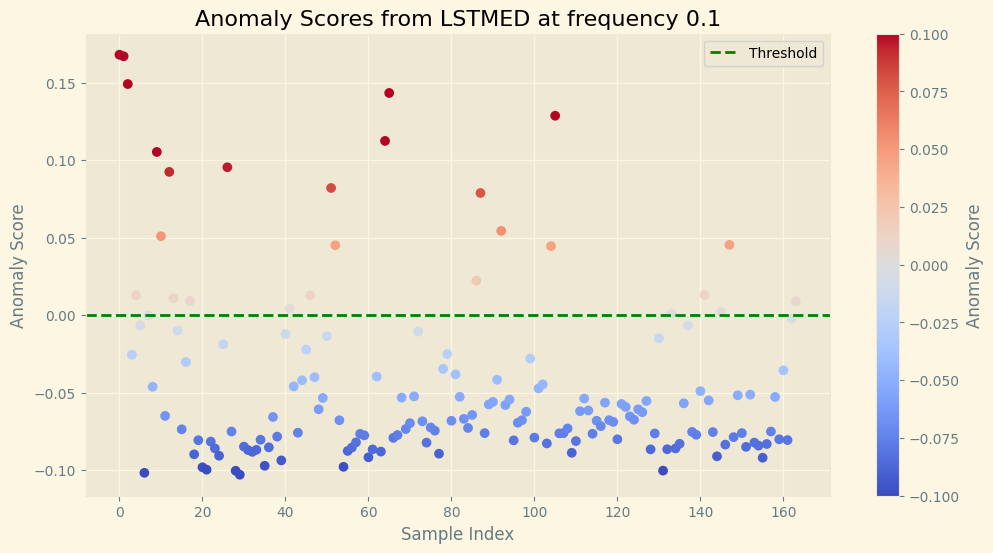

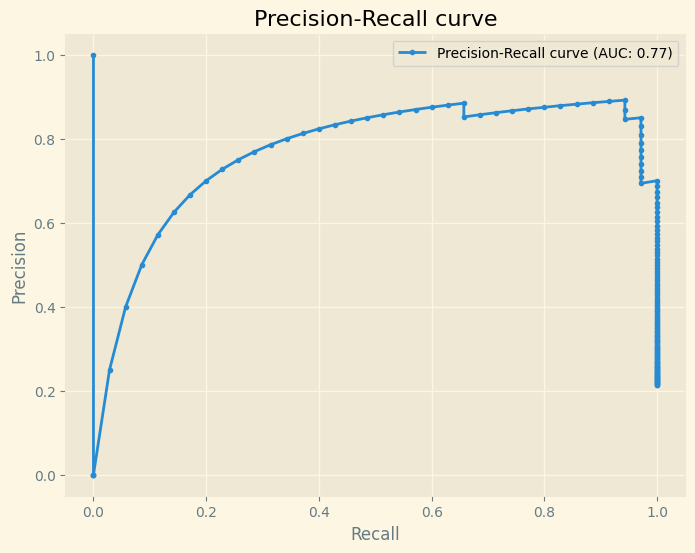

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
34
F1 Score: 0.8696
Accuracy: 0.9451
Precision: 0.8824
Recall: 0.8571
              precision    recall  f1-score   support

           0       0.96      0.97      0.97       129
           1       0.88      0.86      0.87        35

    accuracy                           0.95       164
   macro avg       0.92      0.91      0.92       164
weighted avg       0.94      0.95      0.94       164



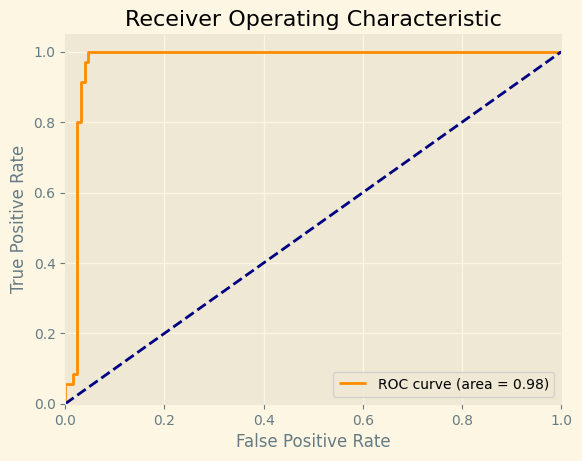

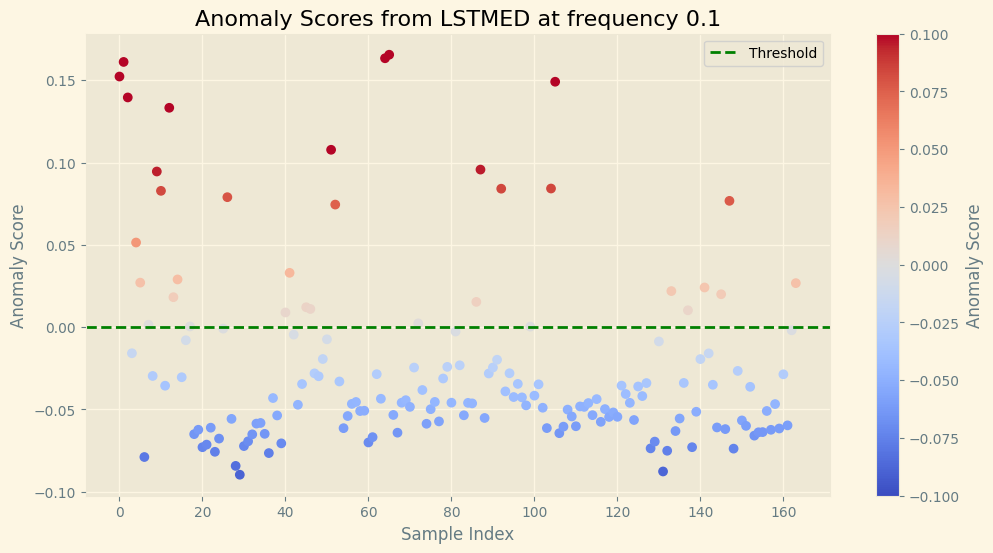

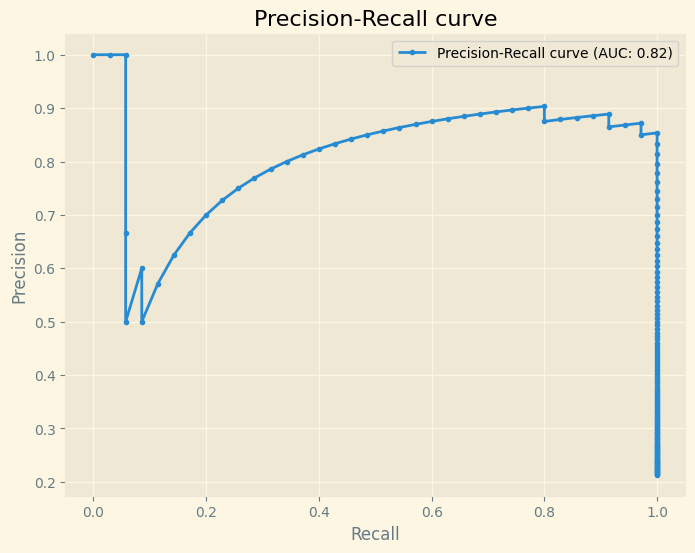

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
30
F1 Score: 0.8000
Accuracy: 0.9207
Precision: 0.8667
Recall: 0.7429
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       129
           1       0.87      0.74      0.80        35

    accuracy                           0.92       164
   macro avg       0.90      0.86      0.88       164
weighted avg       0.92      0.92      0.92       164



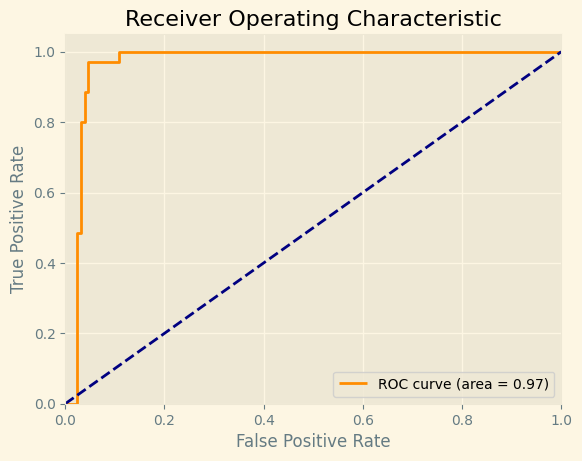

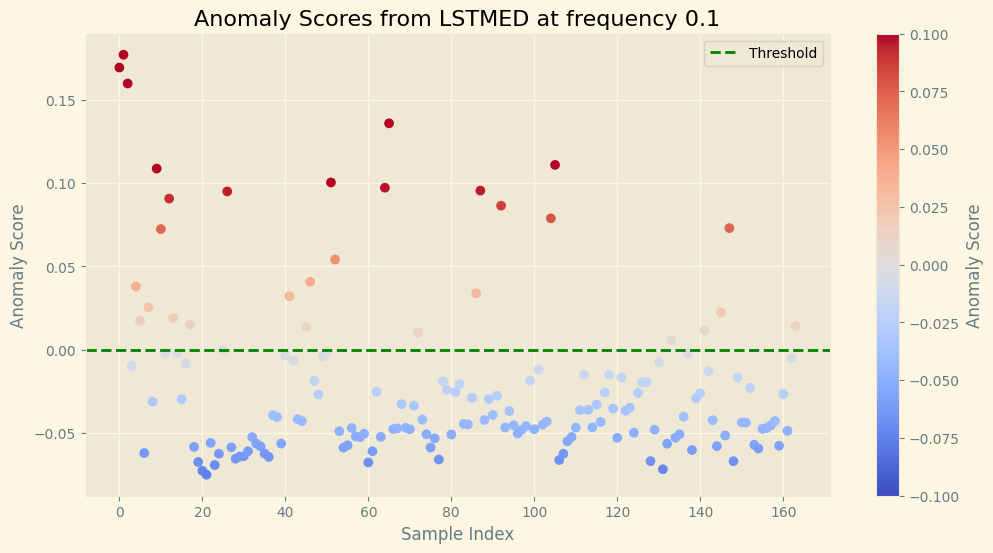

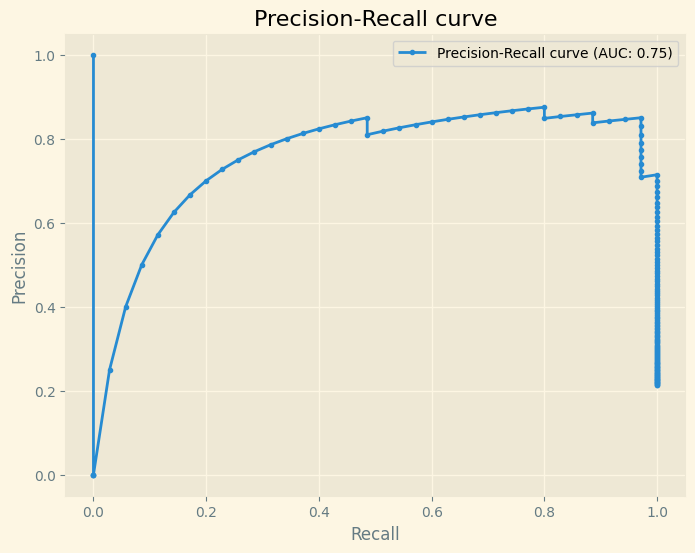

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
36
F1 Score: 0.8169
Accuracy: 0.9207
Precision: 0.8056
Recall: 0.8286
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       129
           1       0.81      0.83      0.82        35

    accuracy                           0.92       164
   macro avg       0.88      0.89      0.88       164
weighted avg       0.92      0.92      0.92       164



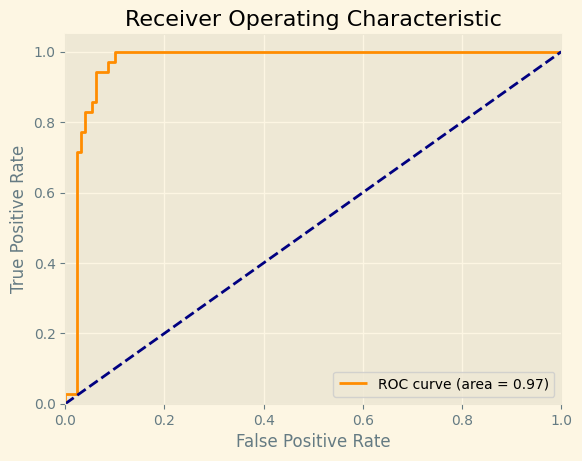

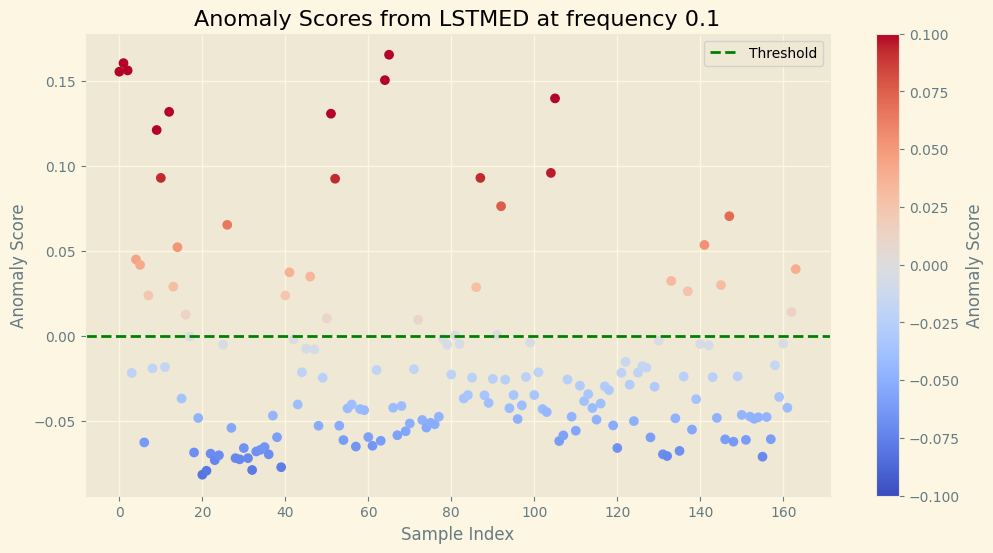

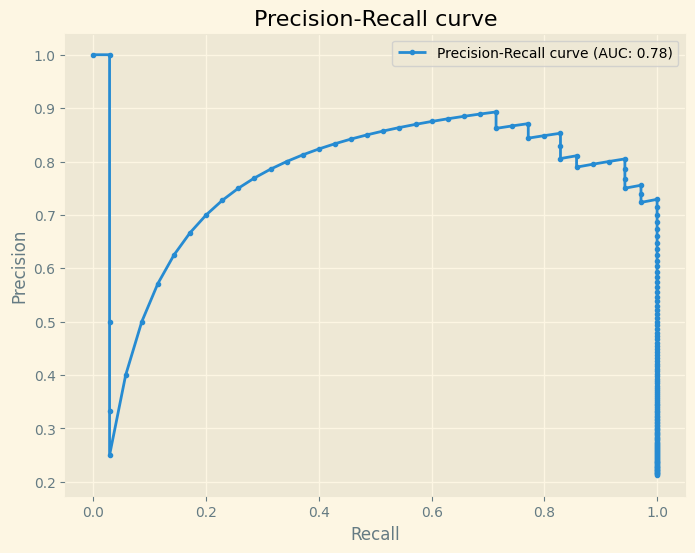

########################## ---------------------------------------- ##########################


In [32]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s_1):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = anomaly_scores > 0
    df_test_1["anomaly_score"] = anomaly_scores
    df_test_1["is_collision"] = np.array(anomalies_detected, dtype=int)
    anomalies_detected_sum = np.sum(anomalies_detected)
    print(f"{anomalies_detected_sum}")
    
    if (anomalies_detected_sum > 20 and anomalies_detected_sum < 60):
        compute_metrics(y_collisions_1, anomalies_detected)
        plot_roc_curve(y_collisions_1, anomaly_scores)
        _ = plot_anomalies(anomaly_scores, freq, threshold)
        plot_precision_recall_curve(y_collisions_1, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

### Classifying collisions_5

IsolationForest(contamination=0.3431372549019608, n_estimators=1)
46
F1 Score: 0.2157
Accuracy: 0.4326
Precision: 0.2391
Recall: 0.1964
              precision    recall  f1-score   support

           0       0.53      0.59      0.56        85
           1       0.24      0.20      0.22        56

    accuracy                           0.43       141
   macro avg       0.38      0.39      0.39       141
weighted avg       0.41      0.43      0.42       141



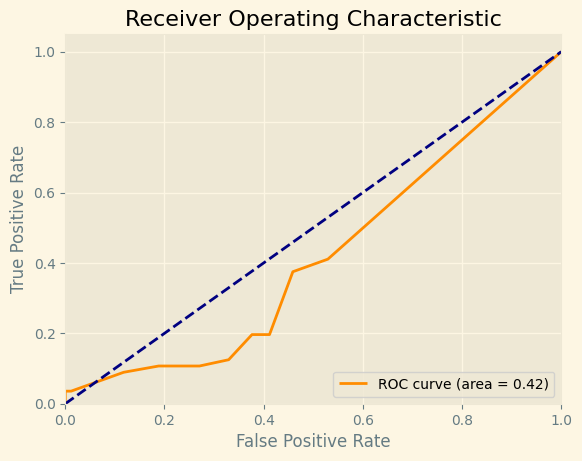

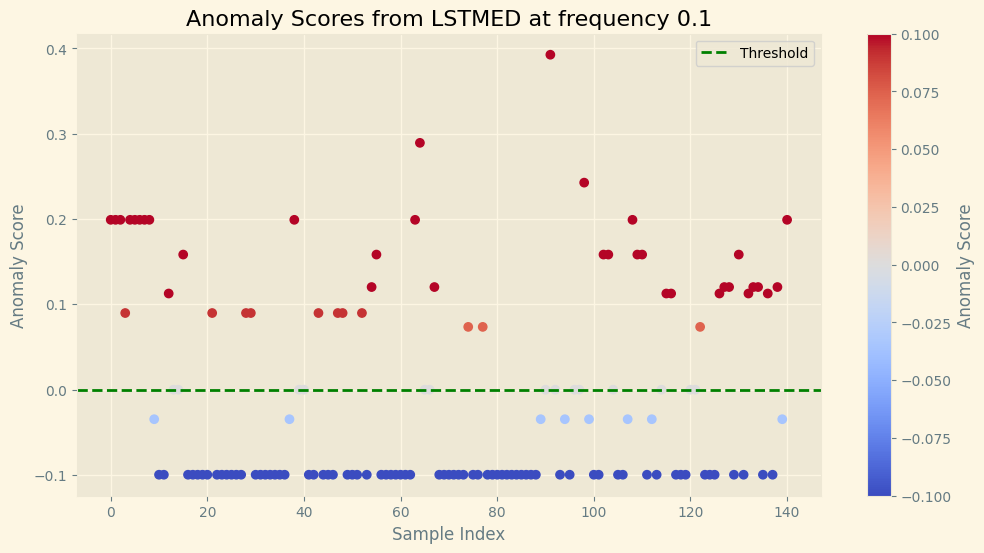

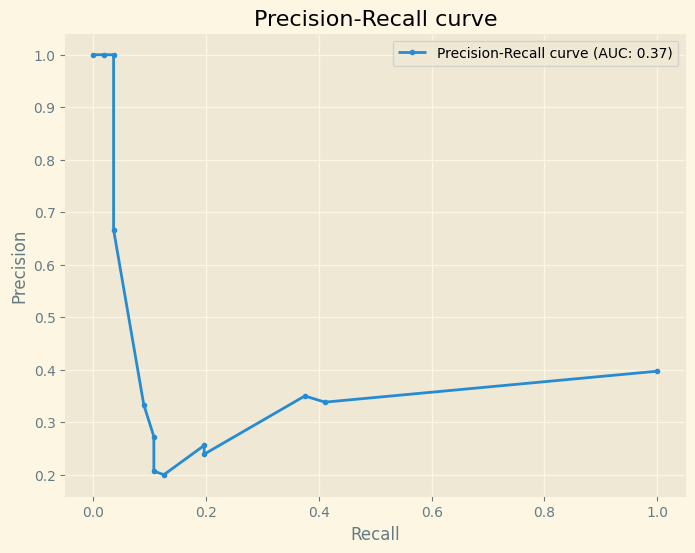

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.005, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.001, n_estimators=1)
0
IsolationForest(contamination=0.03, n_estimators=1)
13
IsolationForest(contamination=0.05, n_estimators=1)
20
IsolationForest(contamination=0.1, n_estimators=1)
36
IsolationForest(contamination=0.2, n_estimators=1)
50
F1 Score: 0.5283
Accuracy: 0.6454
Precision: 0.5600
Recall: 0.5000
              precision    recall  f1-score   support

           0       0.69      0.74      0.72        85
           1       0.56      0.50      0.53        56

    accuracy                           0.65       141
   macro avg       0.63      0.62      0.62       141
weighted avg       0.64      0.65      0.64       141



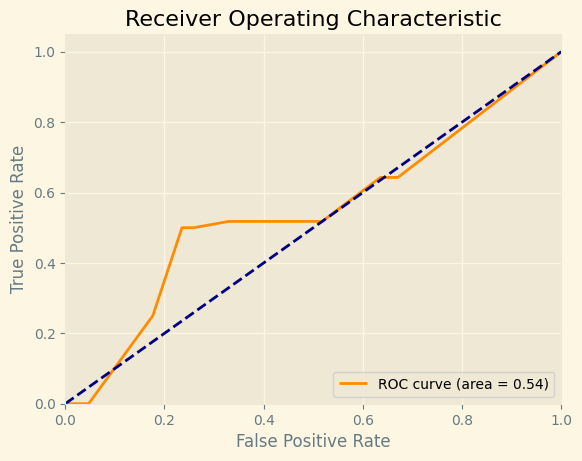

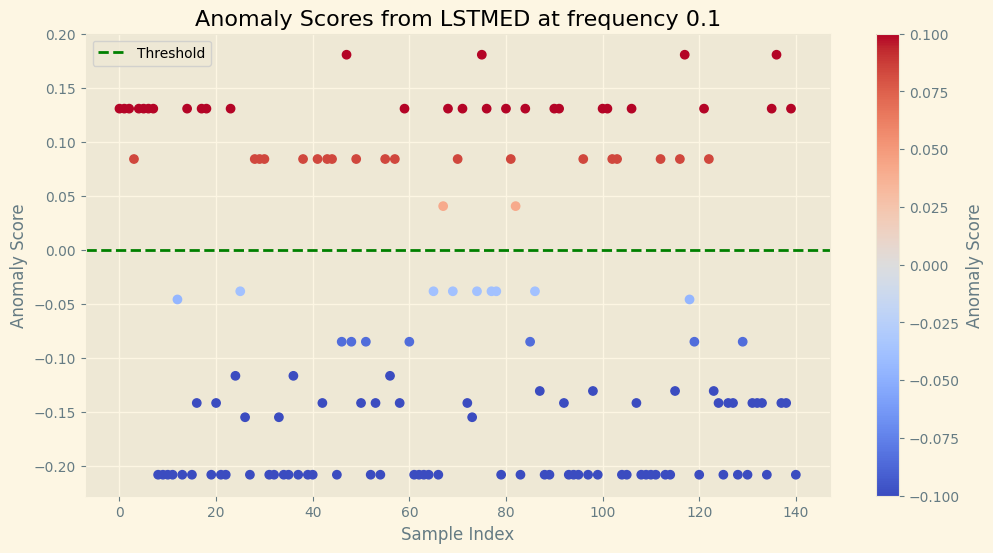

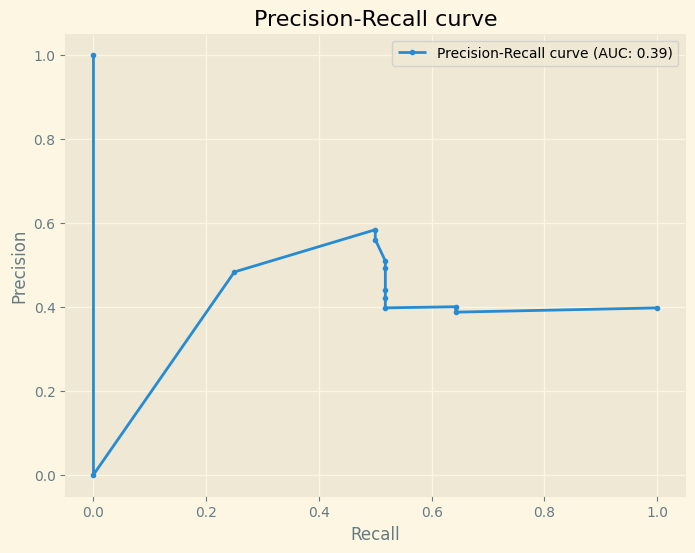

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=1)
78
F1 Score: 0.6716
Accuracy: 0.6879
Precision: 0.5769
Recall: 0.8036
              precision    recall  f1-score   support

           0       0.83      0.61      0.70        85
           1       0.58      0.80      0.67        56

    accuracy                           0.69       141
   macro avg       0.70      0.71      0.69       141
weighted avg       0.73      0.69      0.69       141



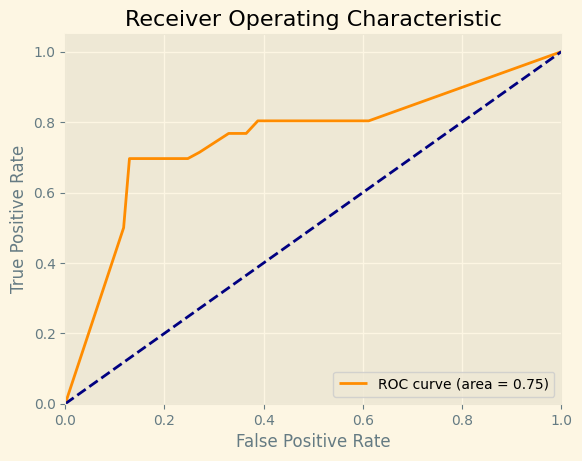

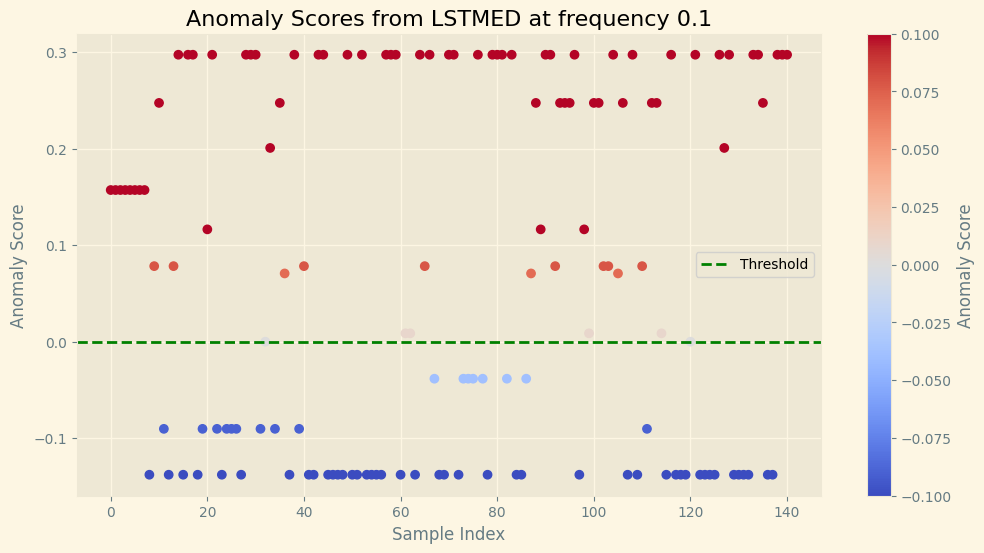

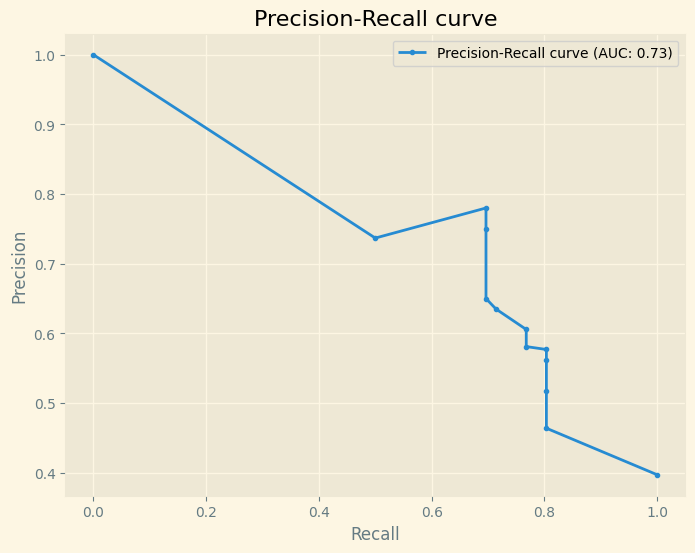

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=1)
55
F1 Score: 0.3604
Accuracy: 0.4965
Precision: 0.3636
Recall: 0.3571
              precision    recall  f1-score   support

           0       0.58      0.59      0.58        85
           1       0.36      0.36      0.36        56

    accuracy                           0.50       141
   macro avg       0.47      0.47      0.47       141
weighted avg       0.49      0.50      0.50       141



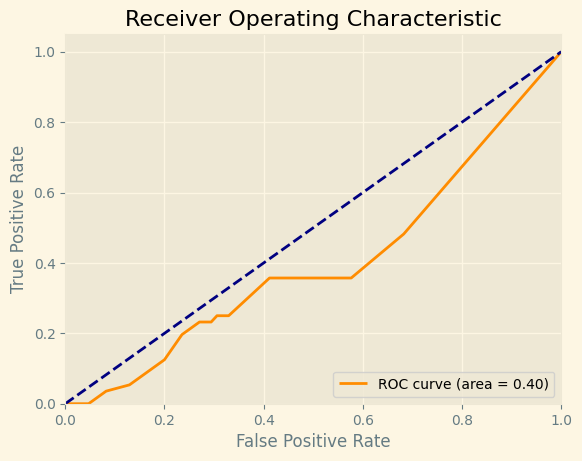

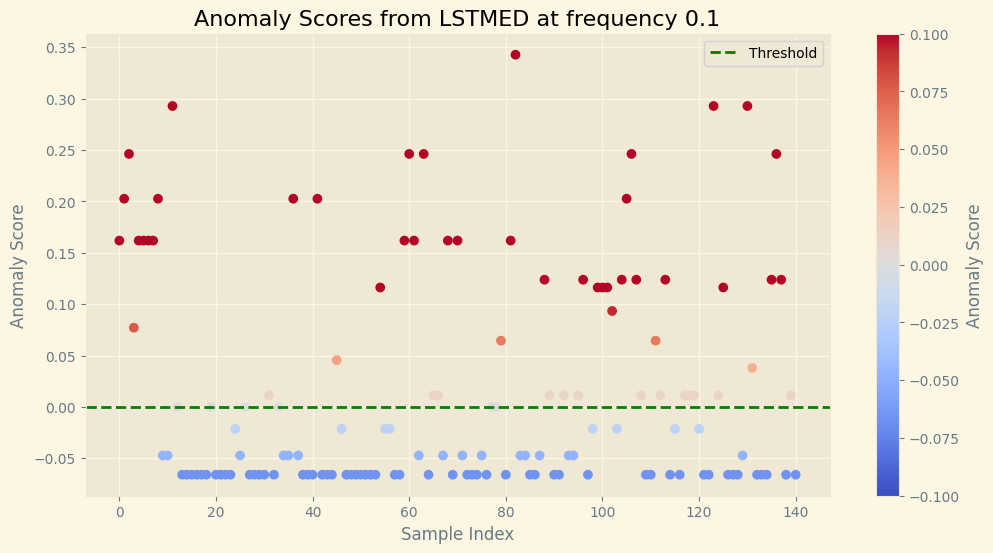

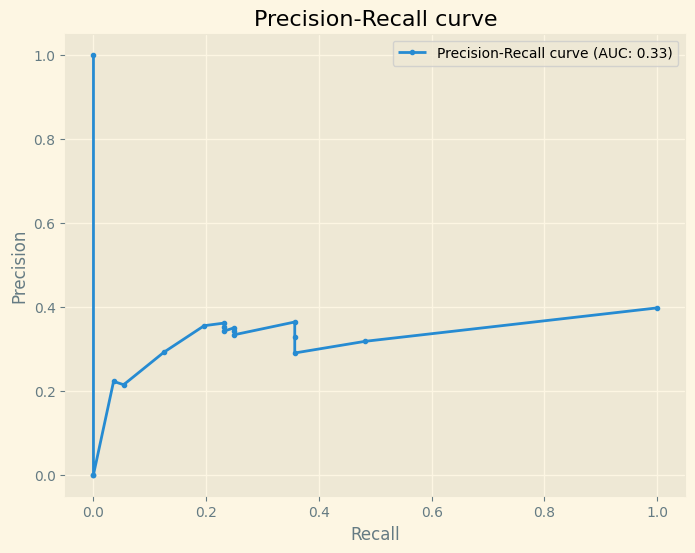

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.5, n_estimators=1)
103
IsolationForest(contamination=0.03, n_estimators=1)
32
IsolationForest(contamination=0.0475, n_estimators=1)
2
IsolationForest(contamination=0.065, n_estimators=1)
10
IsolationForest(contamination=0.0825, n_estimators=1)
16
IsolationForest(contamination=0.1, n_estimators=1)
42
F1 Score: 0.5510
Accuracy: 0.6879
Precision: 0.6429
Recall: 0.4821
              precision    recall  f1-score   support

           0       0.71      0.82      0.76        85
           1       0.64      0.48      0.55        56

    accuracy                           0.69       141
   macro avg       0.67      0.65      0.66       141
weighted avg       0.68      0.69      0.68       141



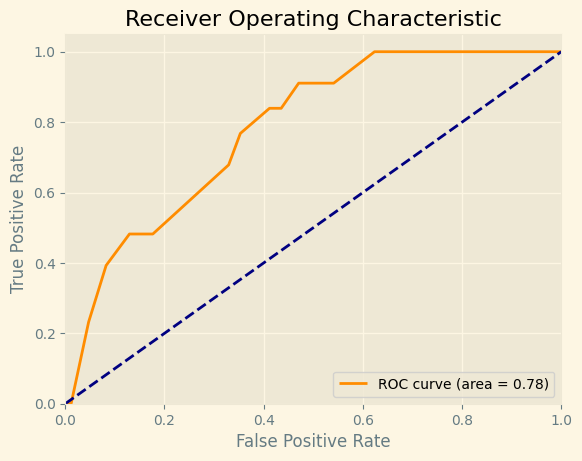

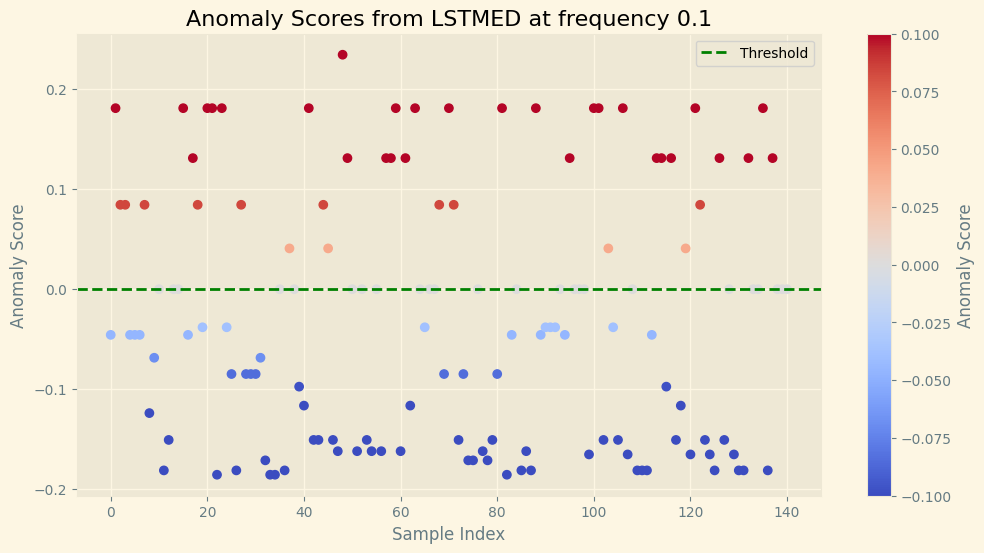

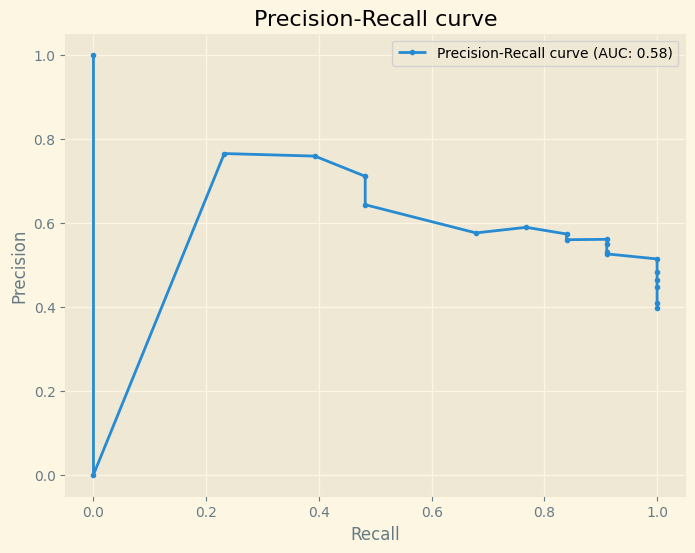

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608, n_estimators=2)
101
IsolationForest(contamination=0.005, n_estimators=2)
3
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.001, n_estimators=2)
0
IsolationForest(contamination=0.03, n_estimators=2)
36
IsolationForest(contamination=0.05, n_estimators=2)
15
IsolationForest(contamination=0.1, n_estimators=2)
31
IsolationForest(contamination=0.2, n_estimators=2)
56
F1 Score: 0.5536
Accuracy: 0.6454
Precision: 0.5536
Recall: 0.5536
              precision    recall  f1-score   support

           0       0.71      0.71      0.71        85
           1       0.55      0.55      0.55        56

    accuracy                           0.65       141
   macro avg       0.63      0.63      0.63       141
weighted avg       0.65      0.65      0.65       141



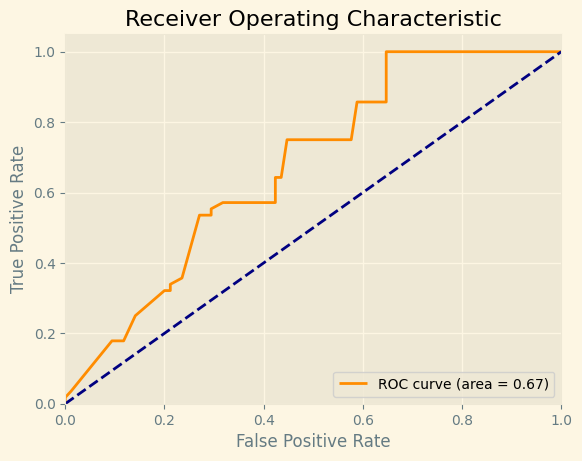

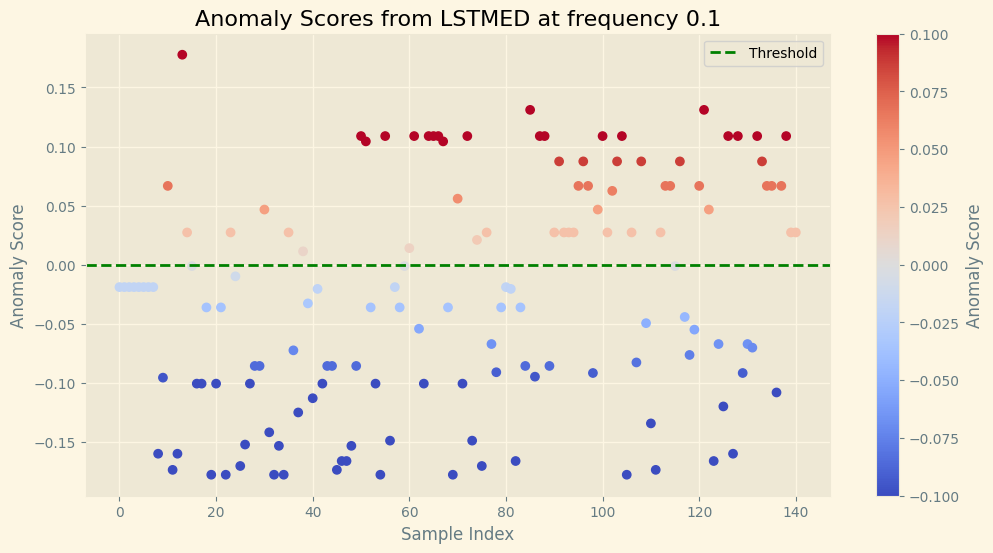

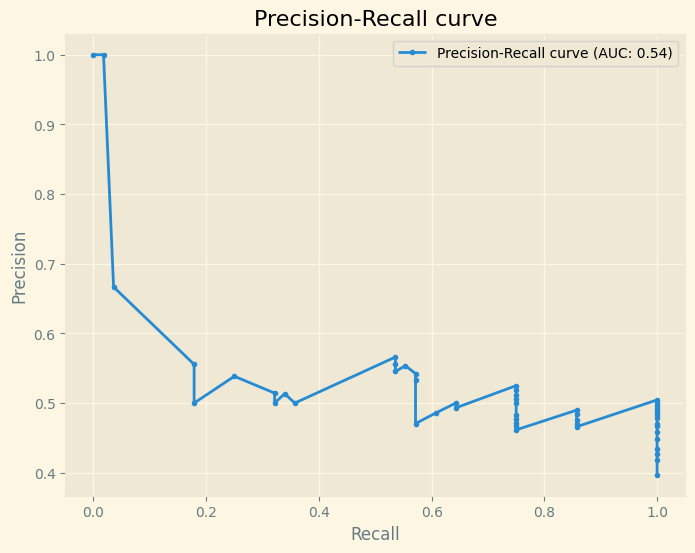

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=2)
93
IsolationForest(contamination=0.4, n_estimators=2)
105
IsolationForest(contamination=0.5, n_estimators=2)
113
IsolationForest(contamination=0.03, n_estimators=2)
14
IsolationForest(contamination=0.0475, n_estimators=2)
80
IsolationForest(contamination=0.065, n_estimators=2)
18
IsolationForest(contamination=0.0825, n_estimators=2)
19
IsolationForest(contamination=0.1, n_estimators=2)
30
IsolationForest(contamination=0.3431372549019608, n_estimators=3)
101
IsolationForest(contamination=0.005, n_estimators=3)
19
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.001, n_estimators=3)
0
IsolationForest(contamination=0.03, n_estimators=3)
9
IsolationForest(contamination=0.05, n_estimators=3)
31
IsolationForest(contamination=0.1, n_estimators=3)
69
F1 Score: 0.7680
Accuracy: 0.7943
Precision: 0.6957
Recall: 0.8

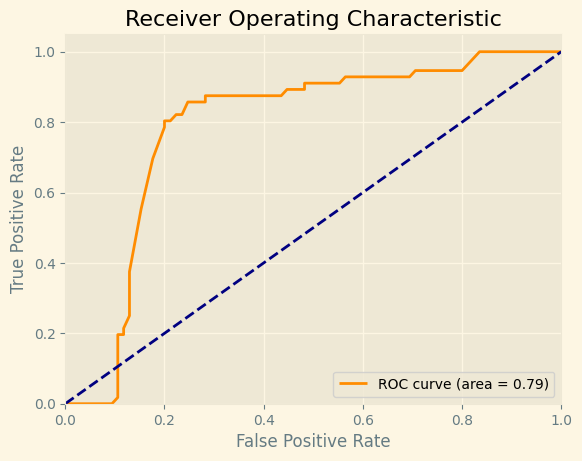

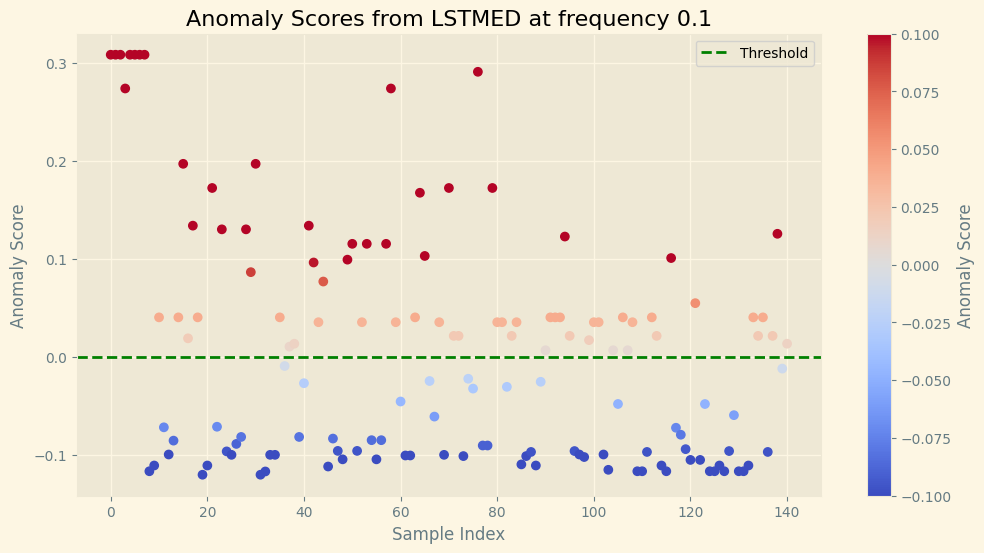

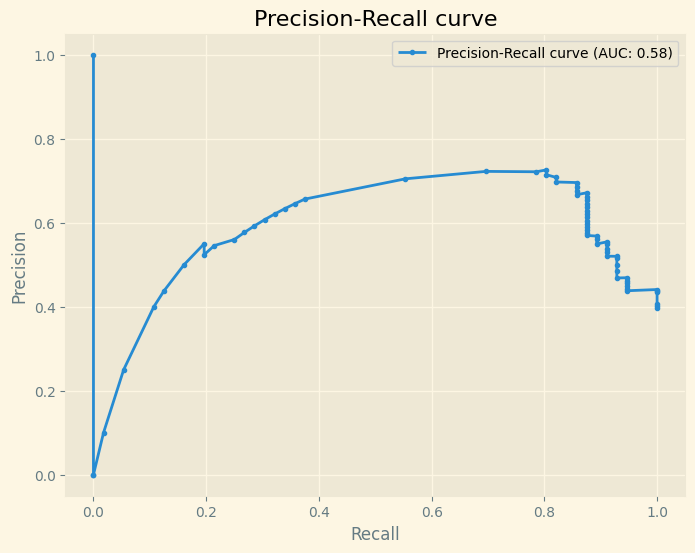

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=3)
61
F1 Score: 0.5641
Accuracy: 0.6383
Precision: 0.5410
Recall: 0.5893
              precision    recall  f1-score   support

           0       0.71      0.67      0.69        85
           1       0.54      0.59      0.56        56

    accuracy                           0.64       141
   macro avg       0.63      0.63      0.63       141
weighted avg       0.64      0.64      0.64       141



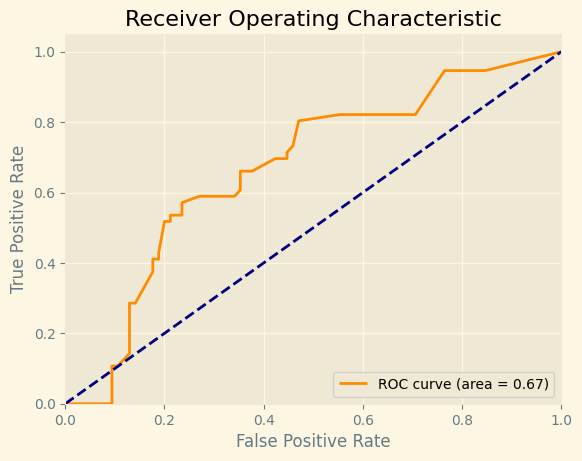

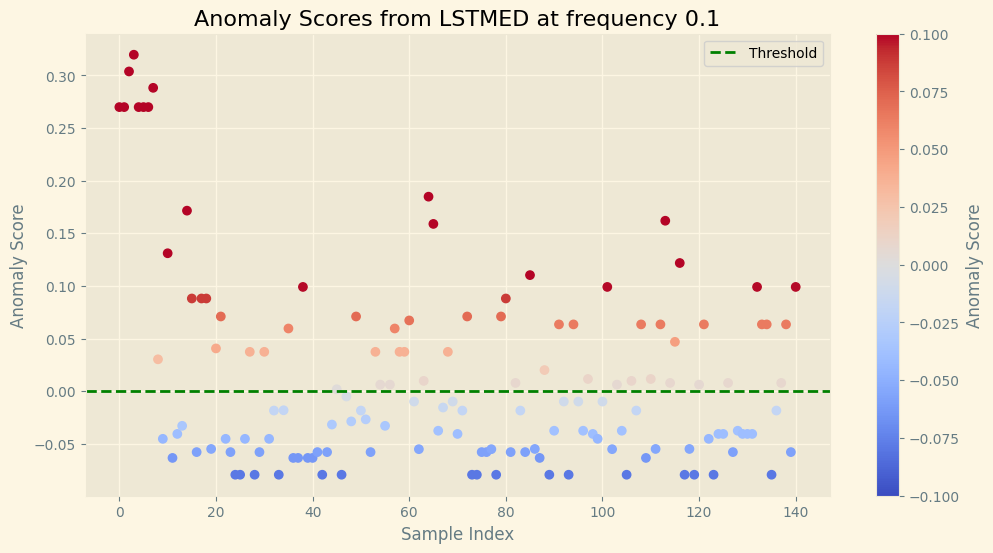

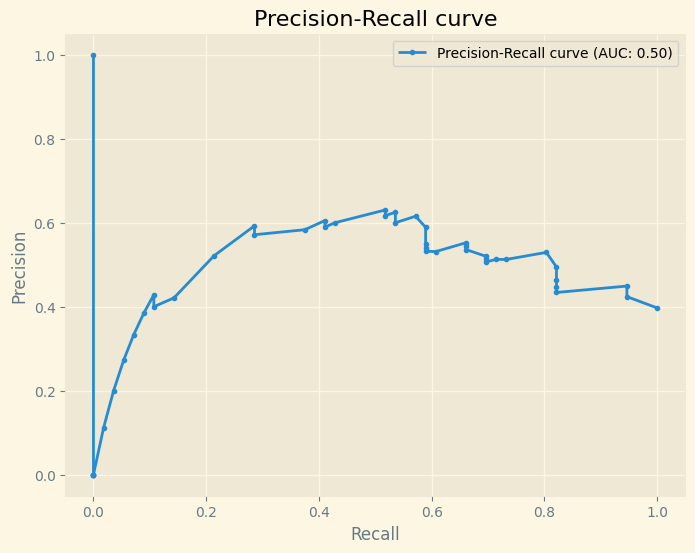

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=3)
52
F1 Score: 0.5556
Accuracy: 0.6596
Precision: 0.5769
Recall: 0.5357
              precision    recall  f1-score   support

           0       0.71      0.74      0.72        85
           1       0.58      0.54      0.56        56

    accuracy                           0.66       141
   macro avg       0.64      0.64      0.64       141
weighted avg       0.66      0.66      0.66       141



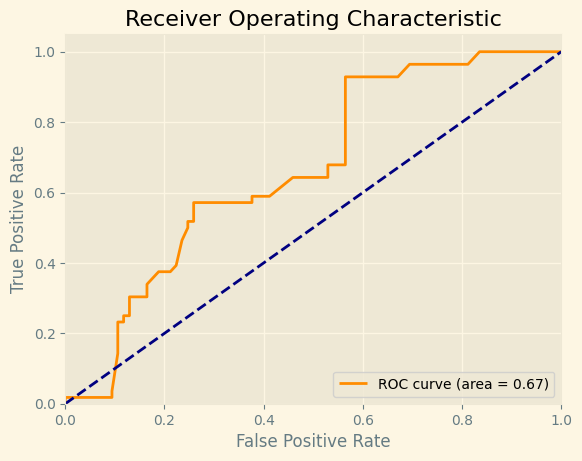

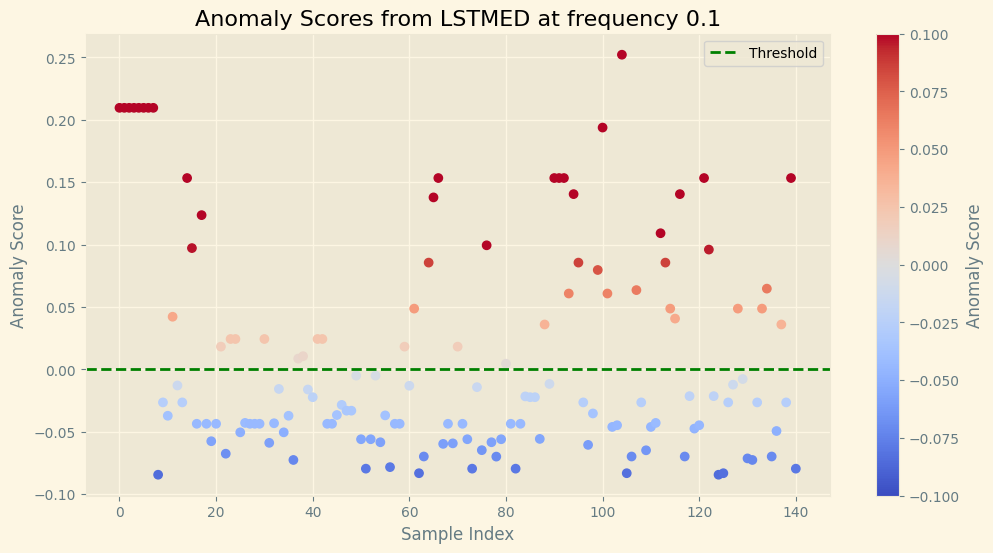

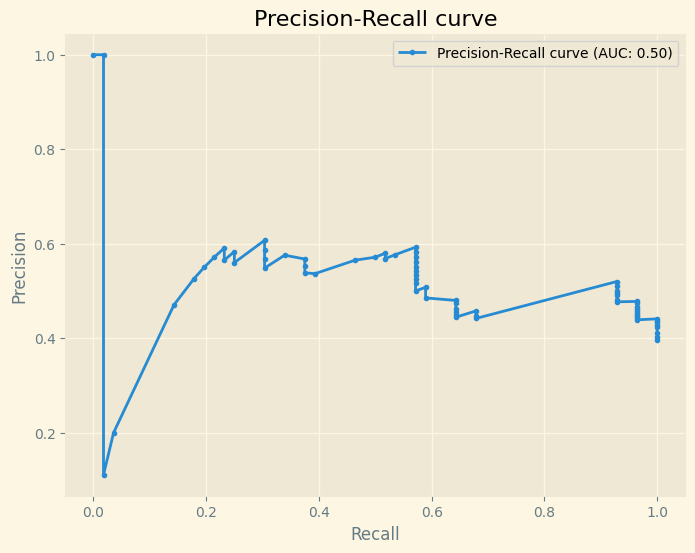

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.4, n_estimators=3)
102
IsolationForest(contamination=0.5, n_estimators=3)
106
IsolationForest(contamination=0.03, n_estimators=3)
22
IsolationForest(contamination=0.0475, n_estimators=3)
13
IsolationForest(contamination=0.065, n_estimators=3)
74
F1 Score: 0.7846
Accuracy: 0.8014
Precision: 0.6892
Recall: 0.9107
              precision    recall  f1-score   support

           0       0.93      0.73      0.82        85
           1       0.69      0.91      0.78        56

    accuracy                           0.80       141
   macro avg       0.81      0.82      0.80       141
weighted avg       0.83      0.80      0.80       141



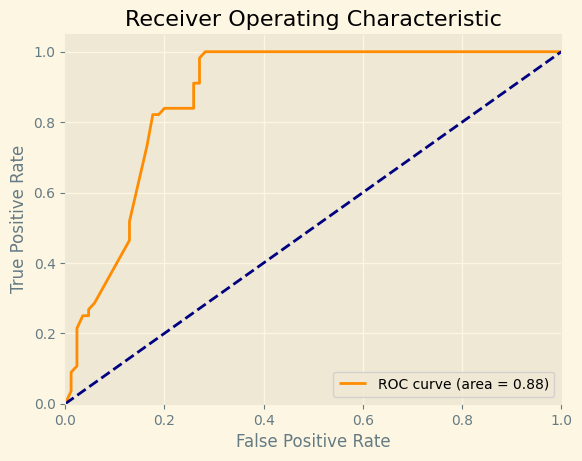

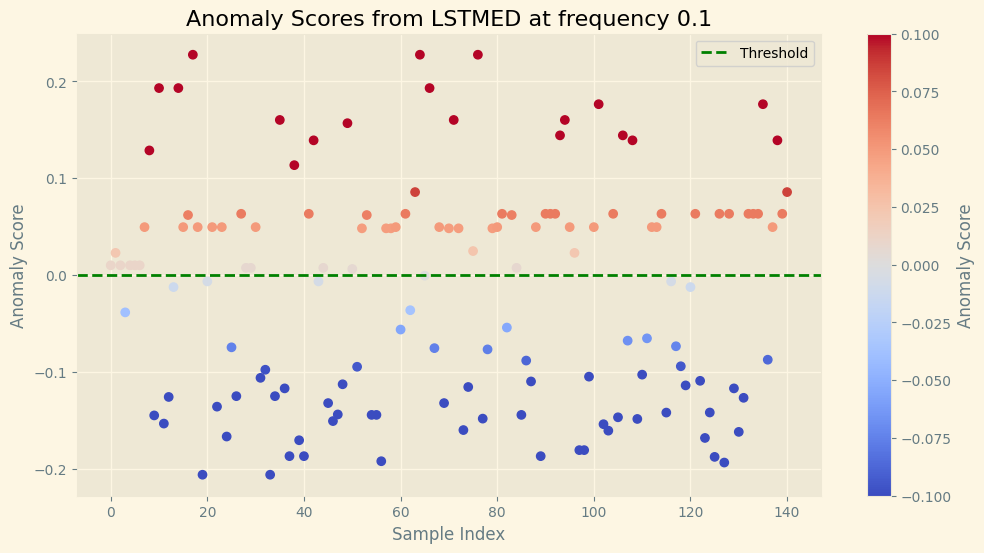

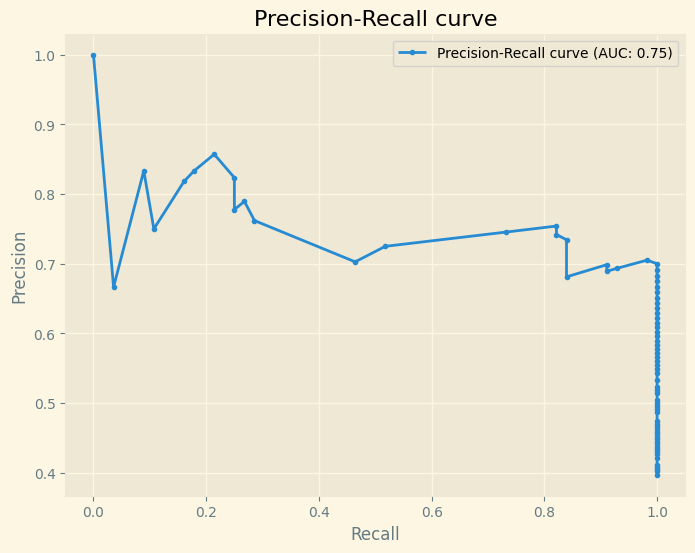

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=3)
73
F1 Score: 0.8217
Accuracy: 0.8369
Precision: 0.7260
Recall: 0.9464
              precision    recall  f1-score   support

           0       0.96      0.76      0.85        85
           1       0.73      0.95      0.82        56

    accuracy                           0.84       141
   macro avg       0.84      0.86      0.84       141
weighted avg       0.86      0.84      0.84       141



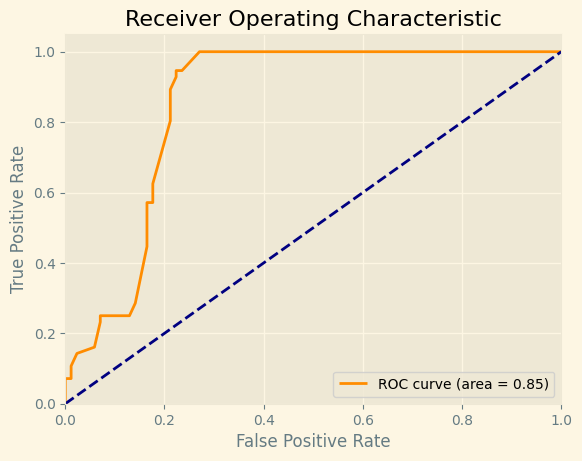

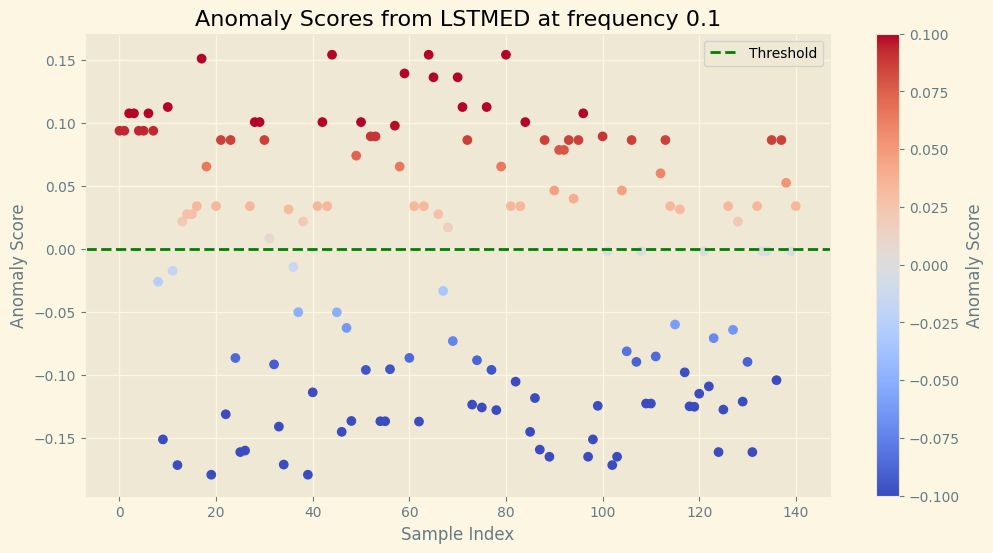

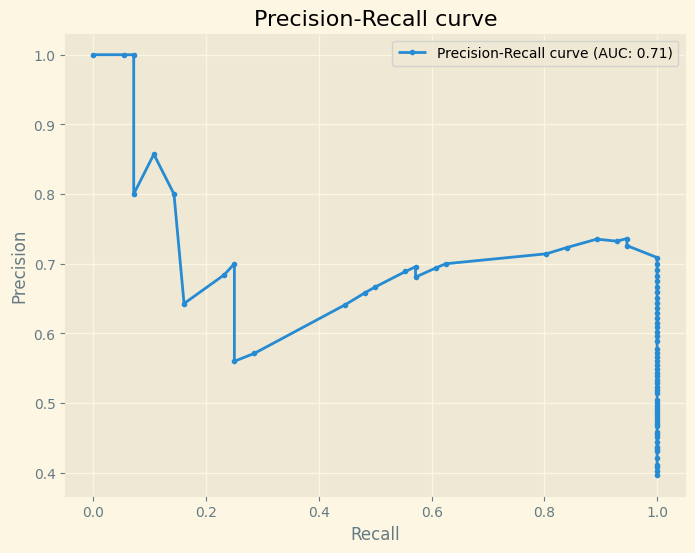

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=3)
27
IsolationForest(contamination=0.3431372549019608, n_estimators=5)
83
IsolationForest(contamination=0.005, n_estimators=5)
12
IsolationForest(contamination=0.001, n_estimators=5)
4
IsolationForest(contamination=0.001, n_estimators=5)
0
IsolationForest(contamination=0.03, n_estimators=5)
16
IsolationForest(contamination=0.05, n_estimators=5)
71
F1 Score: 0.8031
Accuracy: 0.8227
Precision: 0.7183
Recall: 0.9107
              precision    recall  f1-score   support

           0       0.93      0.76      0.84        85
           1       0.72      0.91      0.80        56

    accuracy                           0.82       141
   macro avg       0.82      0.84      0.82       141
weighted avg       0.85      0.82      0.82       141



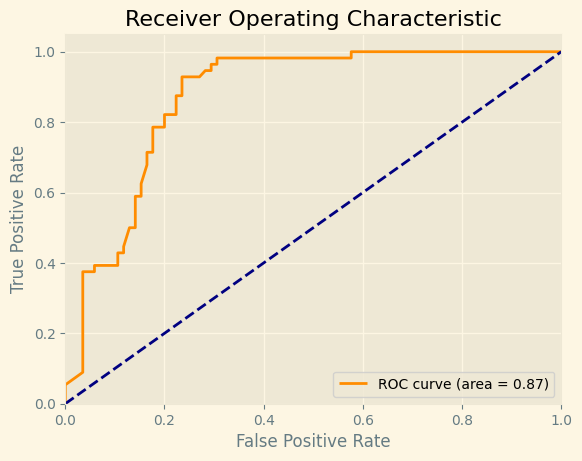

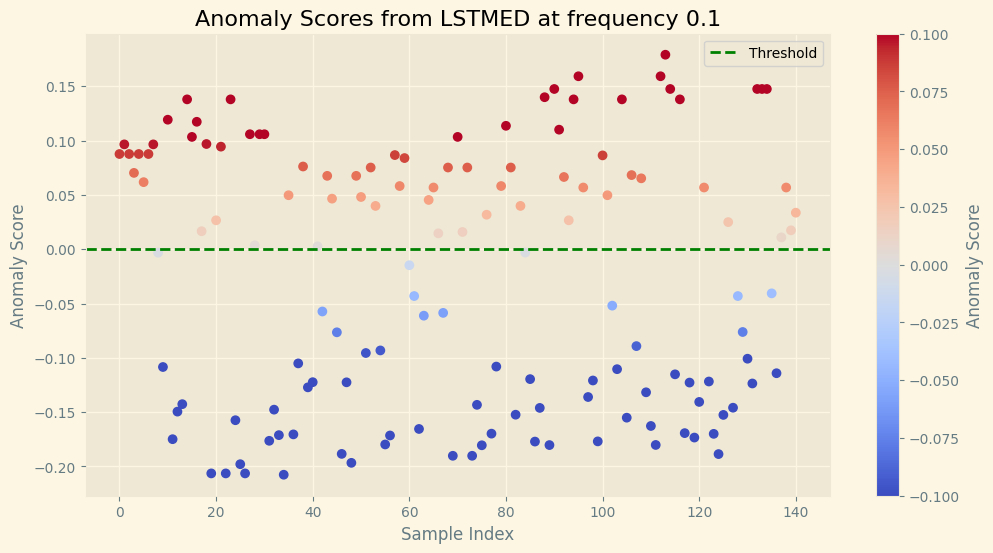

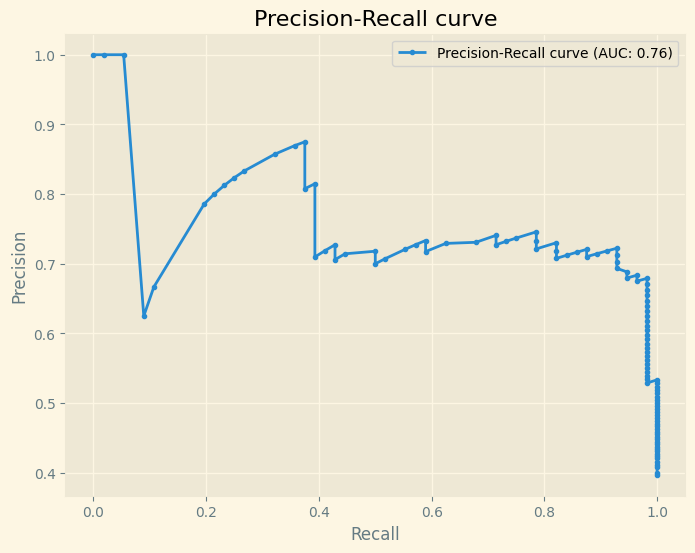

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=5)
46
F1 Score: 0.5098
Accuracy: 0.6454
Precision: 0.5652
Recall: 0.4643
              precision    recall  f1-score   support

           0       0.68      0.76      0.72        85
           1       0.57      0.46      0.51        56

    accuracy                           0.65       141
   macro avg       0.62      0.61      0.62       141
weighted avg       0.64      0.65      0.64       141



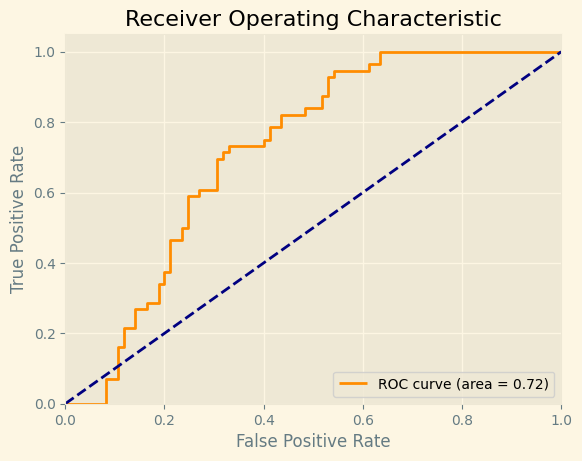

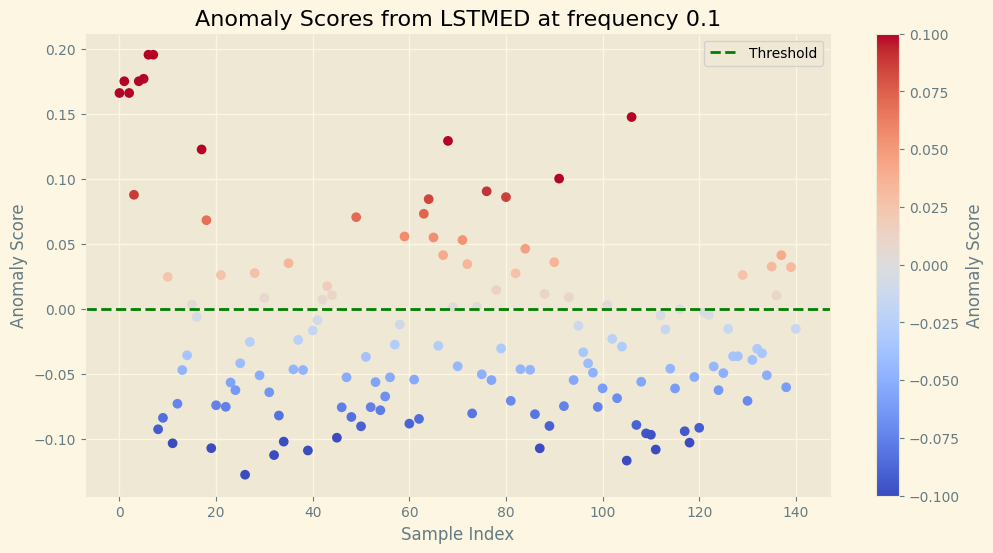

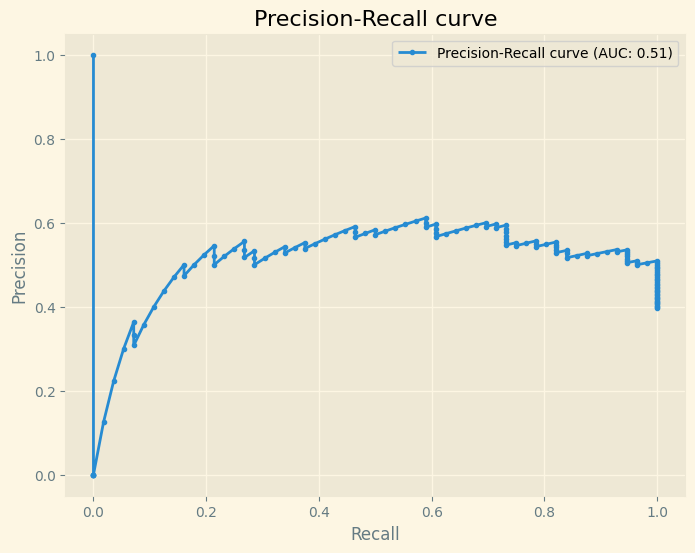

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=5)
57
F1 Score: 0.6195
Accuracy: 0.6950
Precision: 0.6140
Recall: 0.6250
              precision    recall  f1-score   support

           0       0.75      0.74      0.75        85
           1       0.61      0.62      0.62        56

    accuracy                           0.70       141
   macro avg       0.68      0.68      0.68       141
weighted avg       0.70      0.70      0.70       141



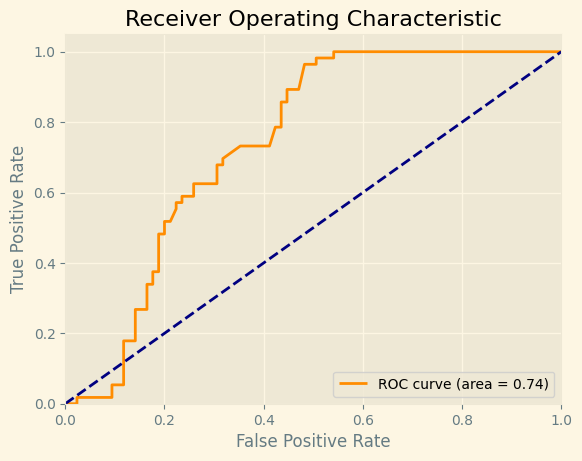

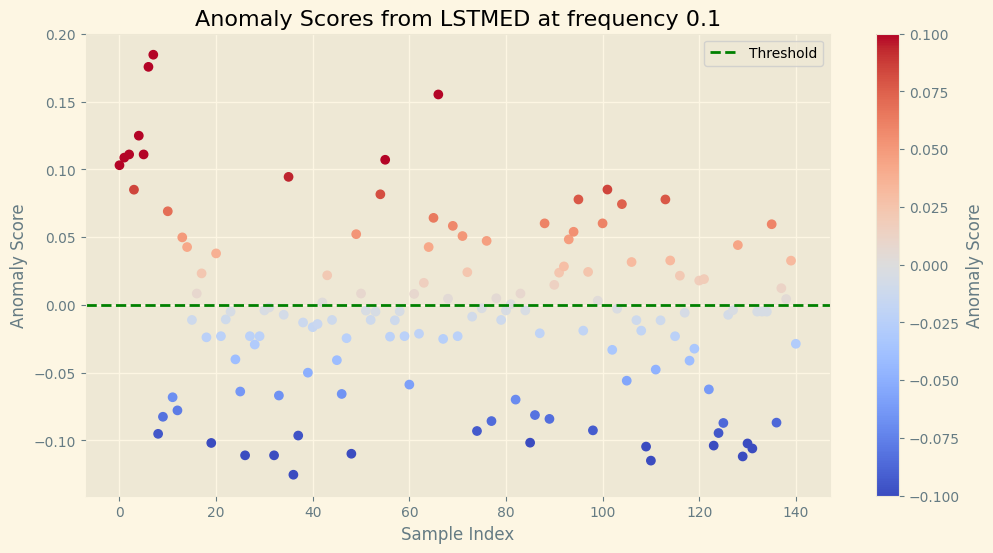

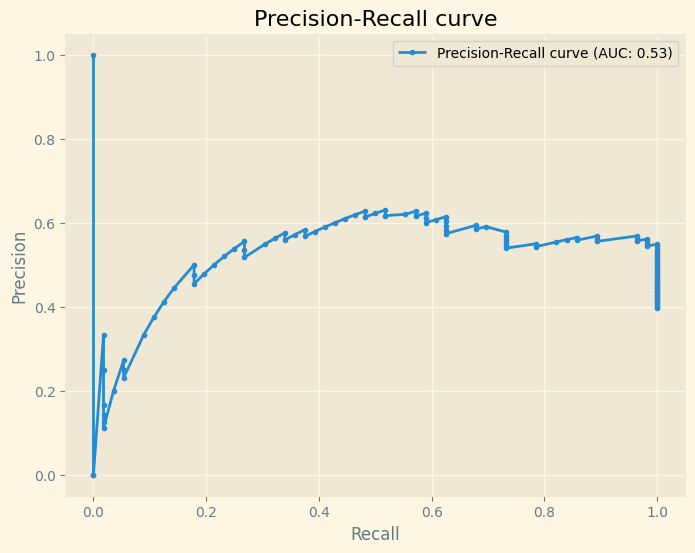

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3, n_estimators=5)
89
IsolationForest(contamination=0.4, n_estimators=5)
96
IsolationForest(contamination=0.5, n_estimators=5)
108
IsolationForest(contamination=0.03, n_estimators=5)
11
IsolationForest(contamination=0.0475, n_estimators=5)
79
F1 Score: 0.8296
Accuracy: 0.8369
Precision: 0.7089
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        85
           1       0.71      1.00      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



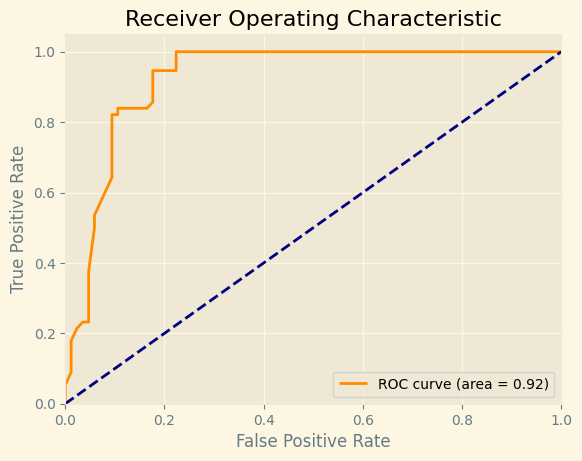

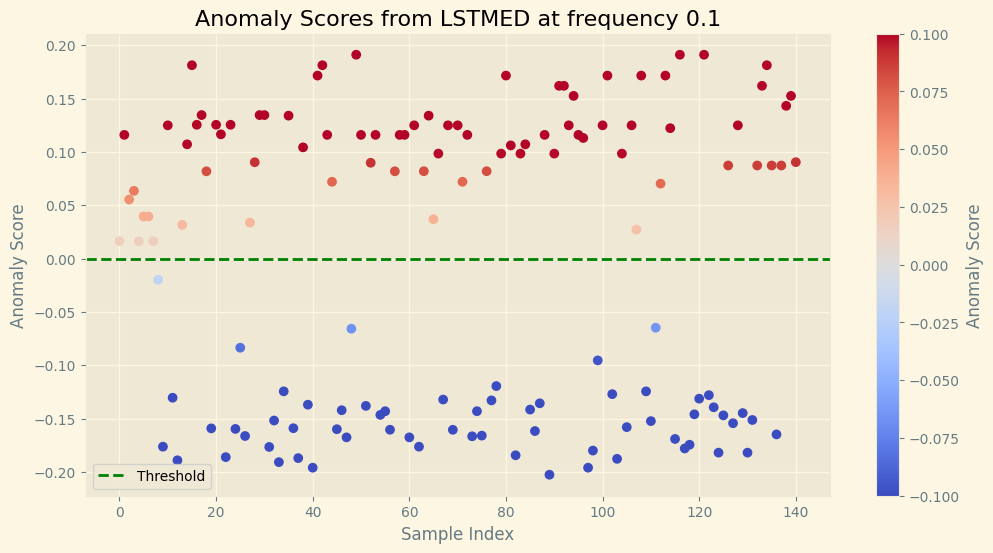

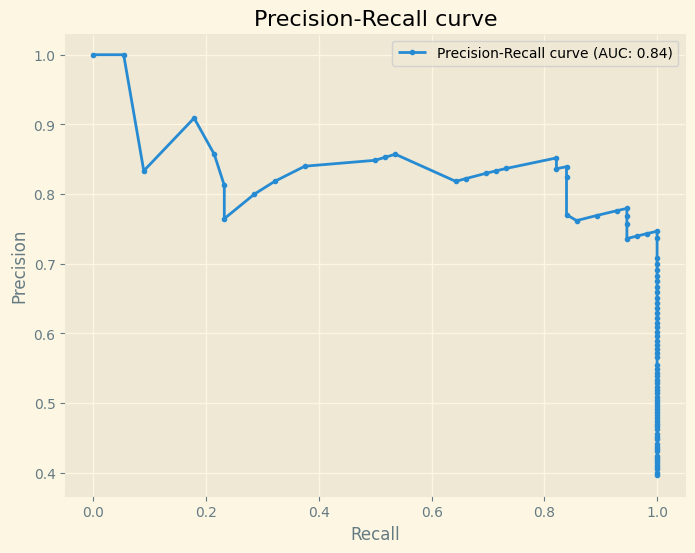

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065, n_estimators=5)
26
IsolationForest(contamination=0.0825, n_estimators=5)
40
IsolationForest(contamination=0.1, n_estimators=5)
14
IsolationForest(contamination=0.3431372549019608, n_estimators=10)
97
IsolationForest(contamination=0.005, n_estimators=10)
2
IsolationForest(contamination=0.001, n_estimators=10)
2
IsolationForest(contamination=0.001, n_estimators=10)
0
IsolationForest(contamination=0.03, n_estimators=10)
9
IsolationForest(contamination=0.05, n_estimators=10)
62
F1 Score: 0.7797
Accuracy: 0.8156
Precision: 0.7419
Recall: 0.8214
              precision    recall  f1-score   support

           0       0.87      0.81      0.84        85
           1       0.74      0.82      0.78        56

    accuracy                           0.82       141
   macro avg       0.81      0.82      0.81       141
weighted avg       0.82      0.82      0.82       

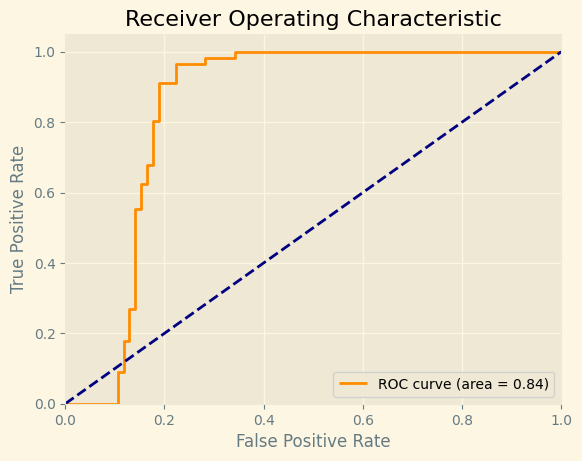

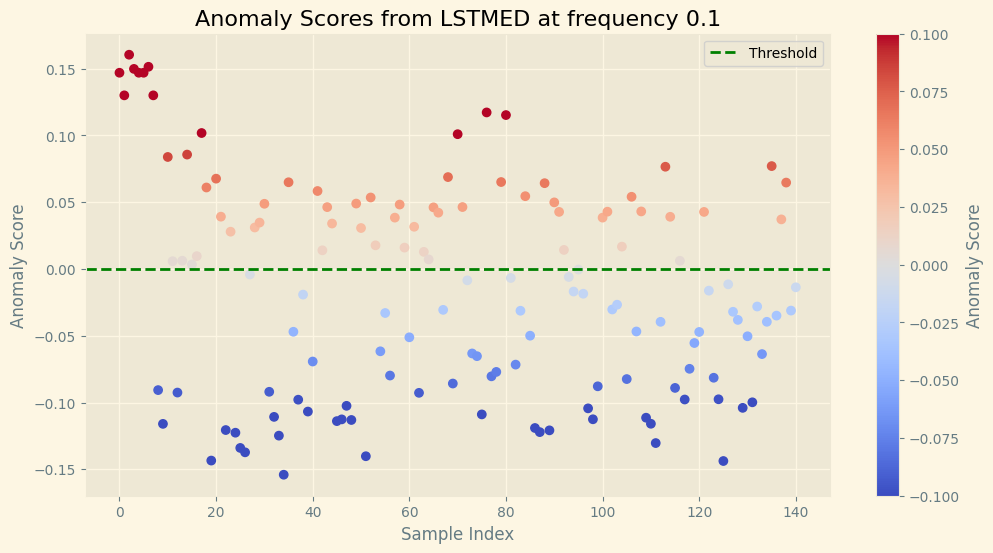

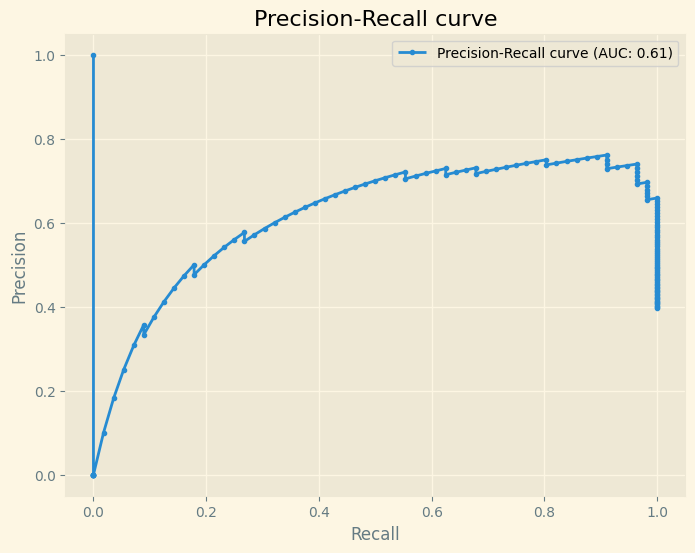

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1, n_estimators=10)
79
F1 Score: 0.8148
Accuracy: 0.8227
Precision: 0.6962
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.72      0.83        85
           1       0.70      0.98      0.81        56

    accuracy                           0.82       141
   macro avg       0.84      0.85      0.82       141
weighted avg       0.87      0.82      0.82       141



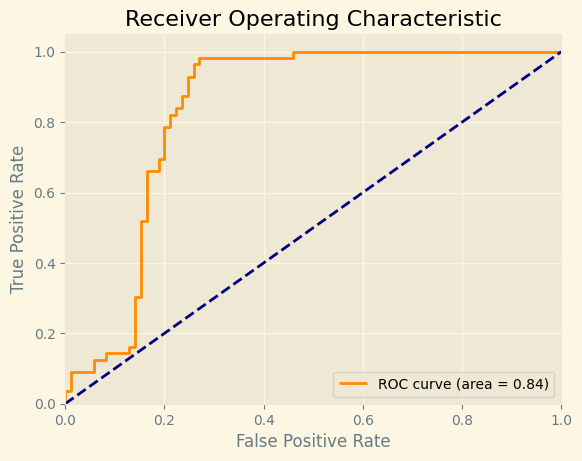

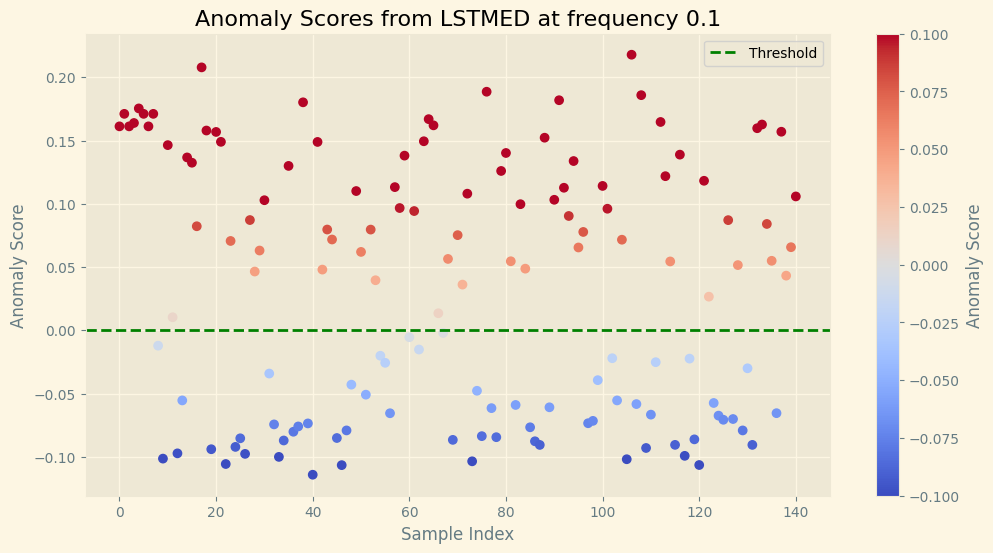

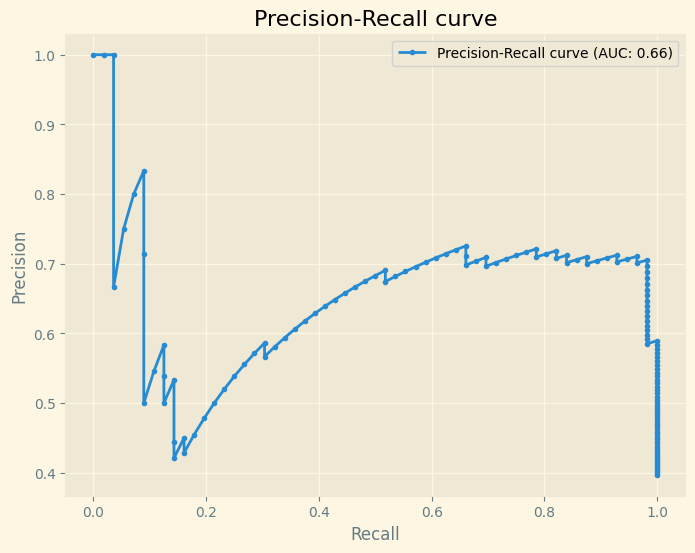

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2, n_estimators=10)
83
IsolationForest(contamination=0.3, n_estimators=10)
87
IsolationForest(contamination=0.4, n_estimators=10)
101
IsolationForest(contamination=0.5, n_estimators=10)
105
IsolationForest(contamination=0.03, n_estimators=10)
12
IsolationForest(contamination=0.0475, n_estimators=10)
22
IsolationForest(contamination=0.065, n_estimators=10)
59
F1 Score: 0.6609
Accuracy: 0.7234
Precision: 0.6441
Recall: 0.6786
              precision    recall  f1-score   support

           0       0.78      0.75      0.77        85
           1       0.64      0.68      0.66        56

    accuracy                           0.72       141
   macro avg       0.71      0.72      0.71       141
weighted avg       0.73      0.72      0.72       141



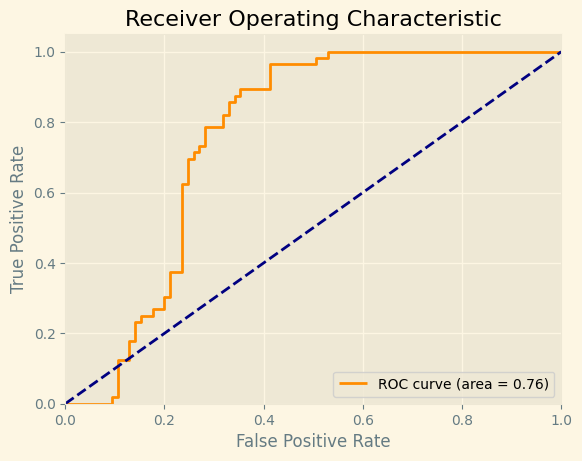

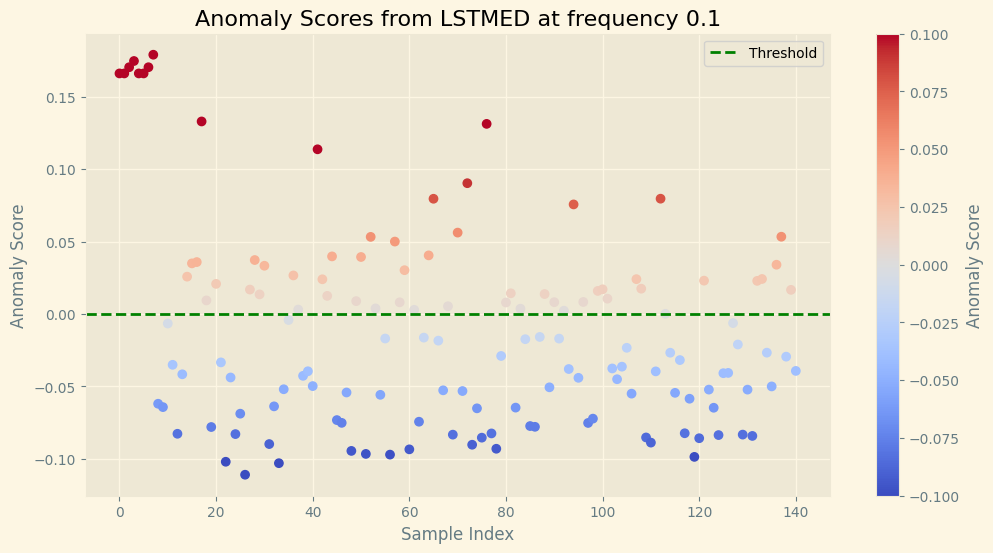

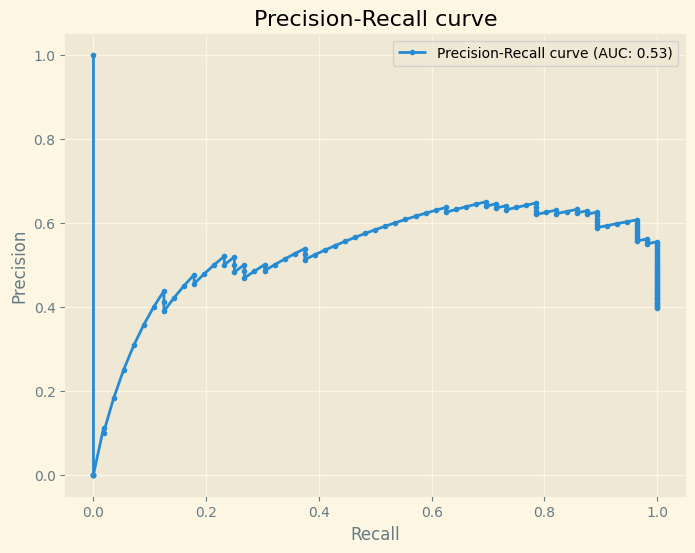

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825, n_estimators=10)
81
IsolationForest(contamination=0.1, n_estimators=10)
61
F1 Score: 0.6667
Accuracy: 0.7234
Precision: 0.6393
Recall: 0.6964
              precision    recall  f1-score   support

           0       0.79      0.74      0.76        85
           1       0.64      0.70      0.67        56

    accuracy                           0.72       141
   macro avg       0.71      0.72      0.72       141
weighted avg       0.73      0.72      0.73       141



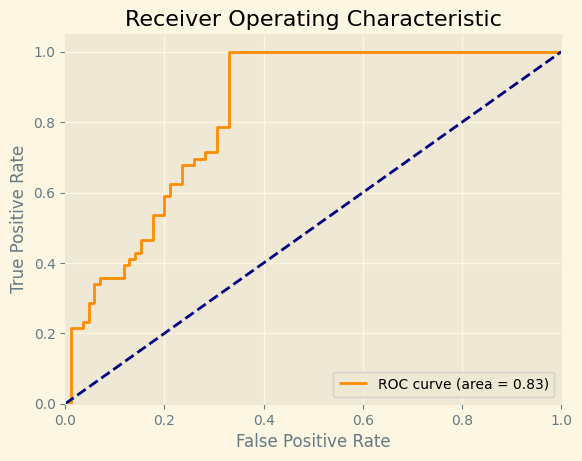

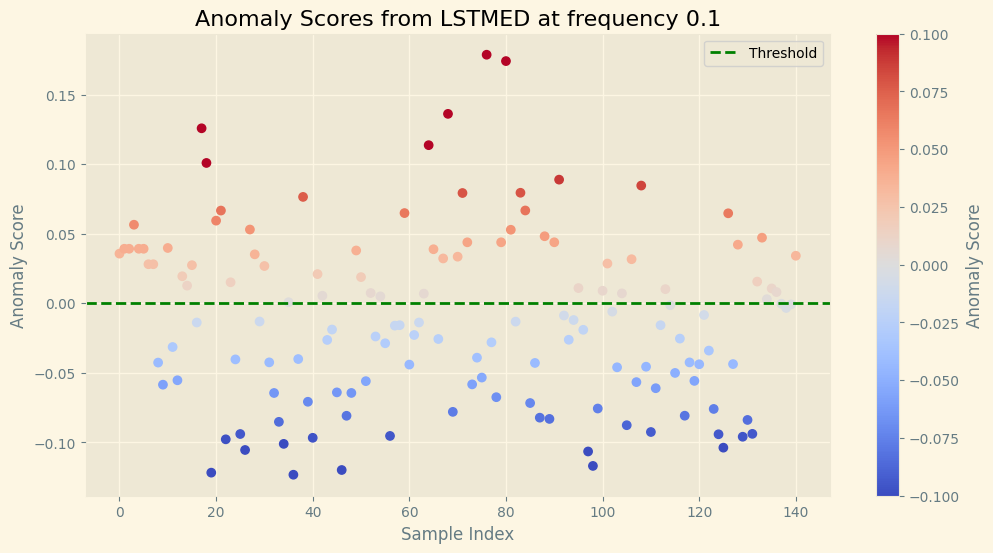

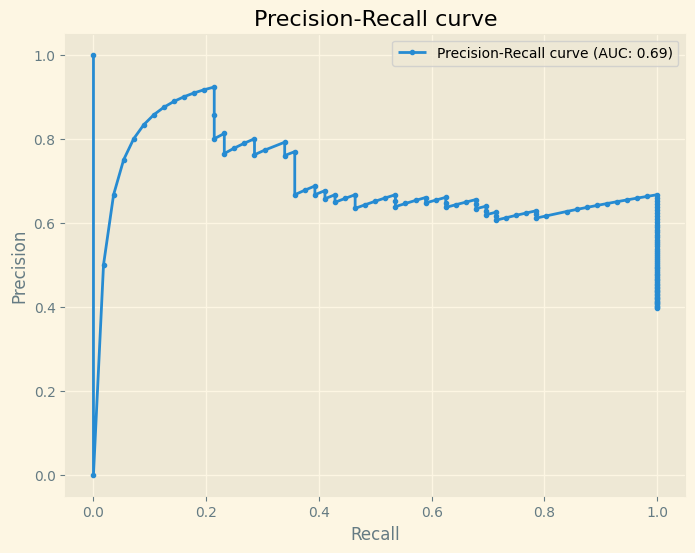

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.3431372549019608)
95
IsolationForest(contamination=0.005)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.001)
0
IsolationForest(contamination=0.03)
11
IsolationForest(contamination=0.05)
78
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



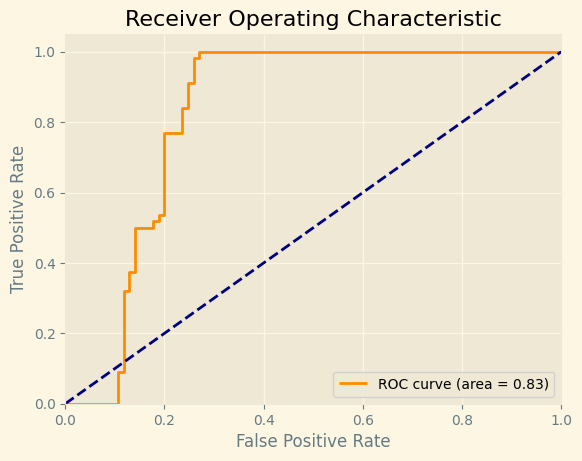

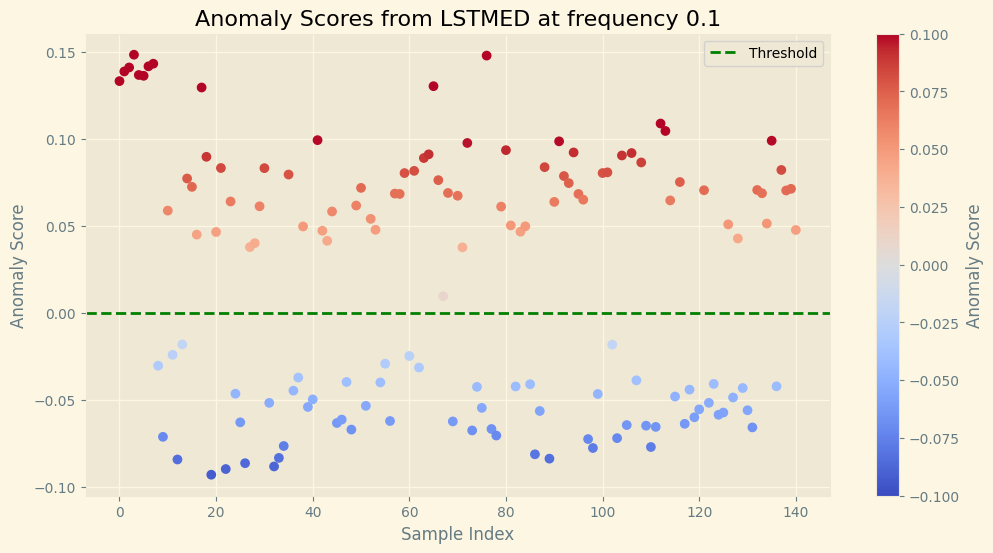

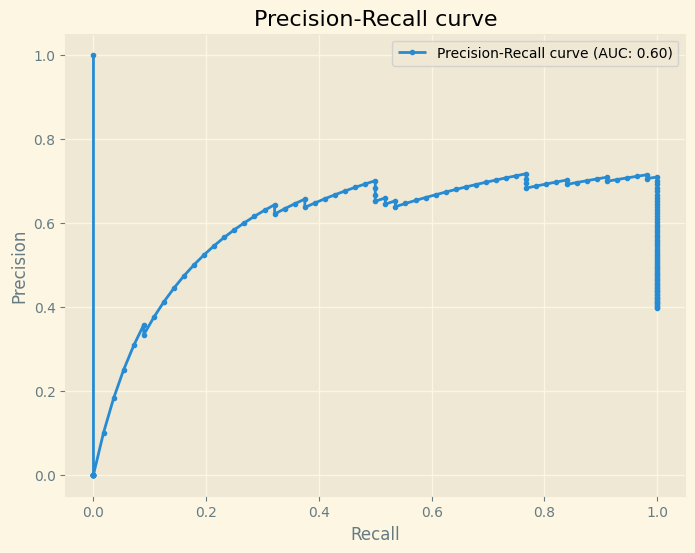

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.1)
79
F1 Score: 0.8296
Accuracy: 0.8369
Precision: 0.7089
Recall: 1.0000
              precision    recall  f1-score   support

           0       1.00      0.73      0.84        85
           1       0.71      1.00      0.83        56

    accuracy                           0.84       141
   macro avg       0.85      0.86      0.84       141
weighted avg       0.88      0.84      0.84       141



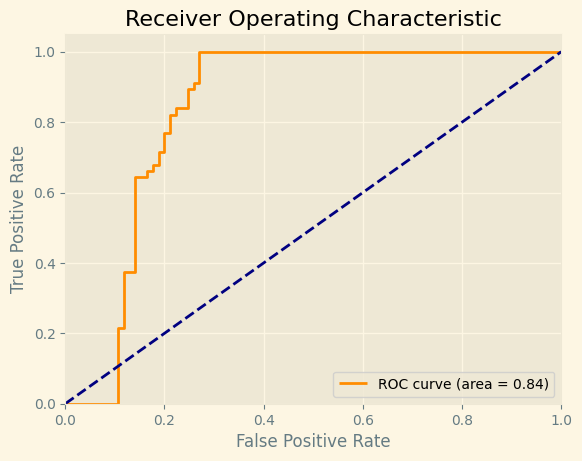

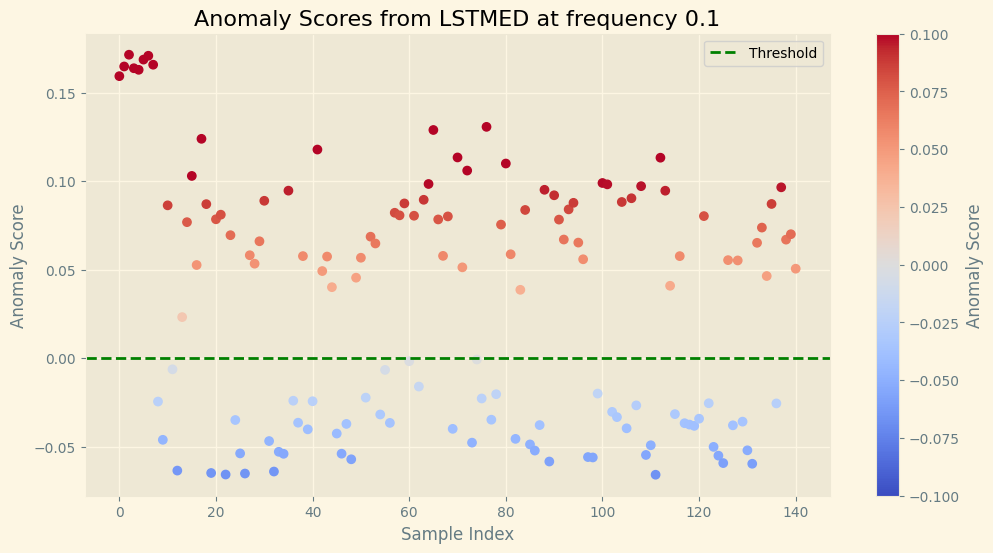

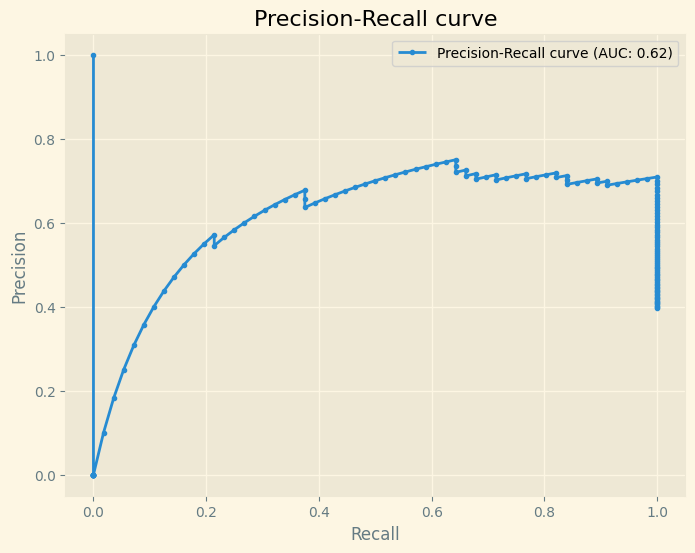

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.2)
86
IsolationForest(contamination=0.3)
90
IsolationForest(contamination=0.4)
106
IsolationForest(contamination=0.5)
101
IsolationForest(contamination=0.03)
11
IsolationForest(contamination=0.0475)
78
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



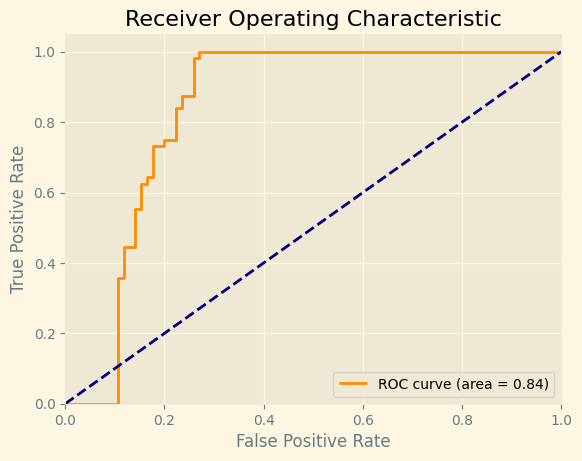

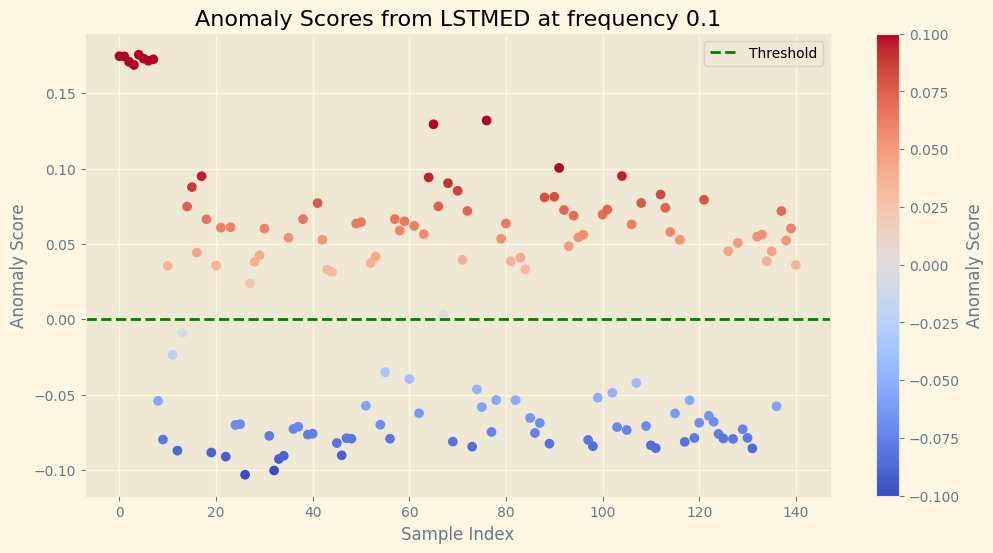

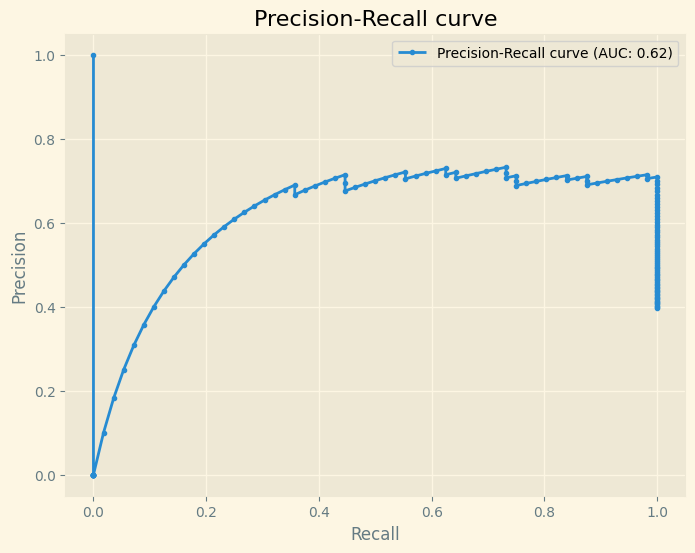

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.065)
78
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



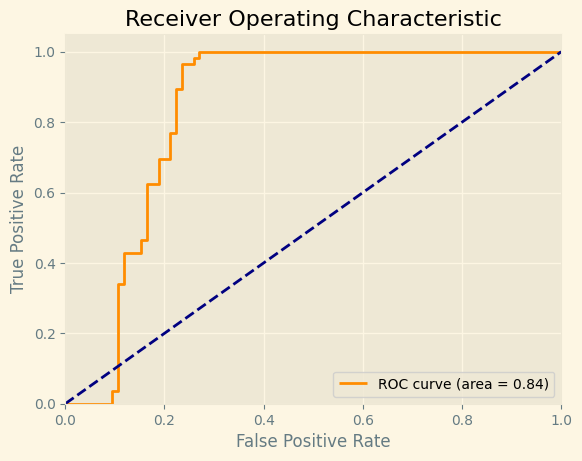

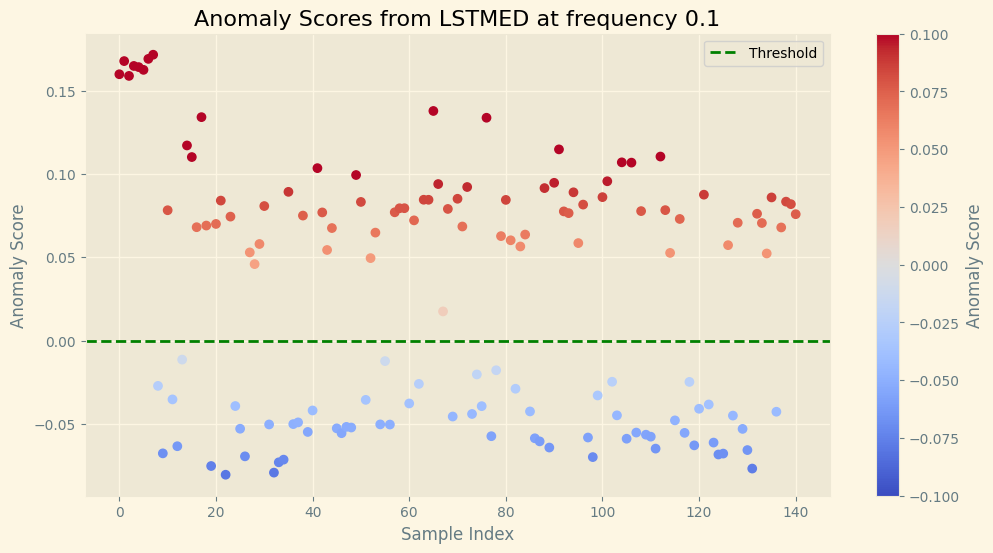

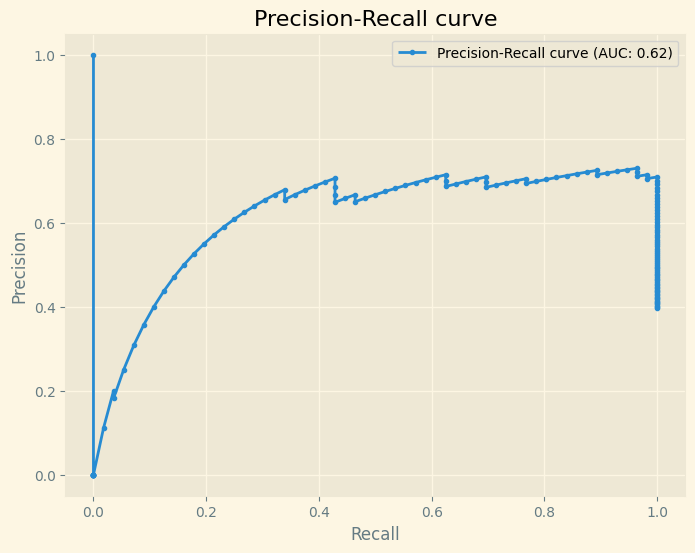

########################## ---------------------------------------- ##########################
IsolationForest(contamination=0.0825)
80
IsolationForest(contamination=0.1)
78
F1 Score: 0.8209
Accuracy: 0.8298
Precision: 0.7051
Recall: 0.9821
              precision    recall  f1-score   support

           0       0.98      0.73      0.84        85
           1       0.71      0.98      0.82        56

    accuracy                           0.83       141
   macro avg       0.84      0.86      0.83       141
weighted avg       0.87      0.83      0.83       141



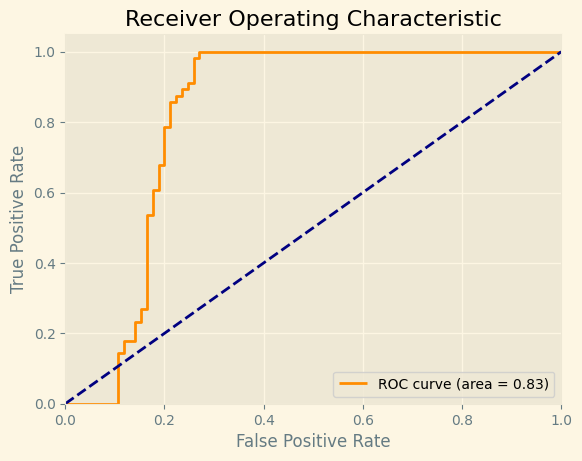

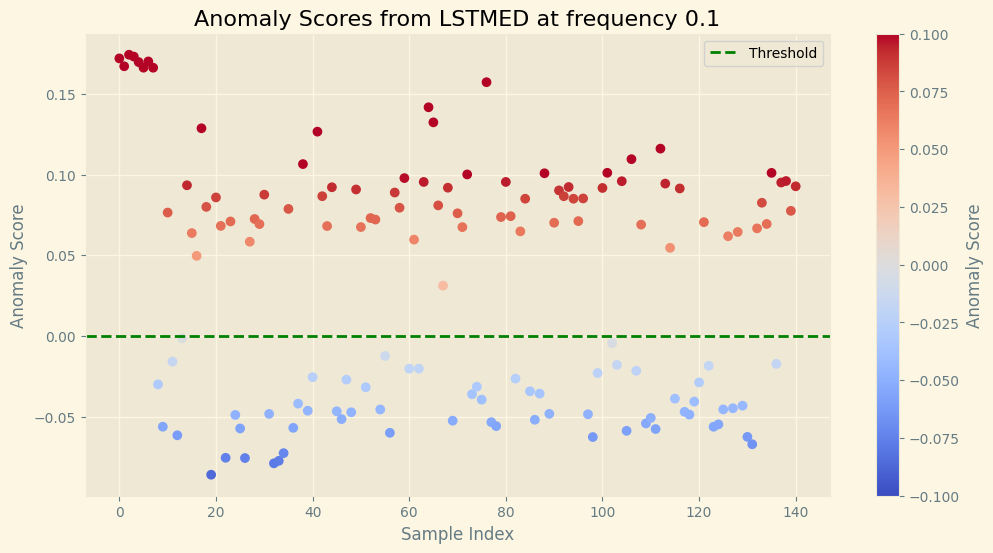

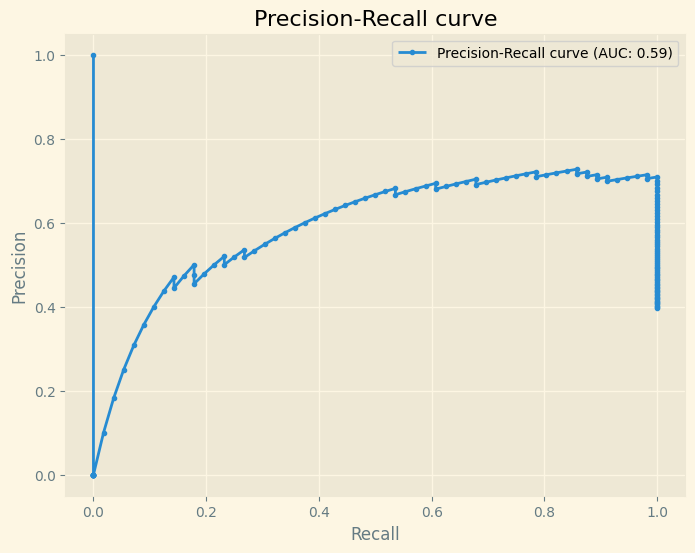

########################## ---------------------------------------- ##########################


In [33]:
threshold = 0 # threshold 0 for decision_function method
for idx, anomaly_scores in enumerate(anomaly_scores_s_5):
    print(f"{clf_s[idx][0]}")
    anomaly_scores = -anomaly_scores    #This is done as scores from decision function that are lower than 0 are considered abnomalies (see literature)

    anomalies_detected = anomaly_scores > 0
    df_test_5["anomaly_score"] = anomaly_scores
    df_test_5["is_collision"] = np.array(anomalies_detected, dtype=int)
    anomalies_detected_sum = np.sum(anomalies_detected)
    print(f"{anomalies_detected_sum}")

    if (anomalies_detected_sum > 40 and anomalies_detected_sum < 80):
        compute_metrics(y_collisions_5, anomalies_detected)
        plot_roc_curve(y_collisions_5, anomaly_scores)
        _ = plot_anomalies(anomaly_scores, freq, threshold)
        plot_precision_recall_curve(y_collisions_5, anomaly_scores)
        print("########################## ---------------------------------------- ##########################")
    # plot_anomalies_over_time(X_test, anomaly_scores, anomalies_detected, freq, threshold, collision_zones, X_test_start_end)

In [34]:
plot_anomalies_true_and_predicted(df_collisions_raw, df_collisions_raw_action, collisions_zones, df_test, title="Collisions zones vs predicted zones for both recordings")

In [35]:
plot_anomalies_true_and_predicted(df_collisions_raw_1, df_collisions_raw_action_1, collisions_zones_1, df_test_1, title="Collisions zones vs predicted zones for recording 1")

In [36]:
plot_anomalies_true_and_predicted(df_collisions_raw_5, df_collisions_raw_action_5, collisions_zones_5, df_test_5, title="Collisions zones vs predicted zones for recording 5")